In [34]:
#import libraries
import torch, pdb # library for debugging
from torch.utils.data import DataLoader
from torch import nn #used to make deep learning architectures
from torchvision import transforms #used to transform training data
from torchvision.datasets import MNIST
from torchvision.utils import make_grid, save_image
from tqdm.auto import tqdm  #used to get useful progress bar
import matplotlib.pyplot as plt
import torchvision.transforms.functional as TF
from PIL import Image
import numpy as np

In [2]:
#visualization function
def show(tensor, ch = 1, size=(28,28), num = 16):
  #tensor : 128 x 784
  data = tensor.detach().cpu().view(-1, ch, *size)    # used to get 128 x 1 x 28 x 28
  grid = make_grid (data[:num],nrow = 4).permute(1,2,0)  # 1 x 28 x 28 = 28 x 28 x 1
  plt.imshow(grid)
  plt.show()

In [3]:
#setup of main parameters and hyperparameters
epochs = 500
cur_step  =0
info_step = 300
mean_gen_loss = 0
mean_disc_loss = 0

z_dim = 64 #size of noise vector for the generator
lr = 0.00001
loss_func = nn.BCEWithLogitsLoss()    #convert all to 0-1 and then use it

bs = 128
device = 'cuda'

dataloader = DataLoader(MNIST('.', download= True, transform=transforms.ToTensor()), shuffle=True,batch_size = bs)
#number of steps in each epochs = total number of images / batch size

100%|██████████| 9912422/9912422 [00:00<00:00, 135805316.63it/s]

Extracting ./MNIST/raw/train-images-idx3-ubyte.gz to ./MNIST/raw

100%|██████████| 28881/28881 [00:00<00:00, 109823838.46it/s]


Extracting ./MNIST/raw/train-labels-idx1-ubyte.gz to ./MNIST/raw



100%|██████████| 1648877/1648877 [00:00<00:00, 50246962.30it/s]

Extracting ./MNIST/raw/t10k-images-idx3-ubyte.gz to ./MNIST/raw


100%|██████████| 4542/4542 [00:00<00:00, 18006170.86it/s]


Extracting ./MNIST/raw/t10k-labels-idx1-ubyte.gz to ./MNIST/raw



In [4]:
#declare our models

#Generator

def genBlock(inp, out):
  return nn.Sequential(
      nn.Linear(inp, out),
      nn.BatchNorm1d(out),
      nn.ReLU(inplace=True),  #set all negative values to be zero and keep positive values
  )

class Generator(nn.Module):
  def __init__(self, z_dim=64, i_dim=784, h_dim = 128):     #z is input noise latent vector and output image size is i
    super().__init__()
    self.gen = nn.Sequential(
      genBlock(z_dim, h_dim),     #64, 128
      genBlock(h_dim, h_dim * 2),  # 128 , 256
      genBlock(h_dim*2, h_dim*4),    # 256 x 512
      genBlock(h_dim*4, h_dim*8),  # 512 x 1024
      nn.Linear(h_dim*8, i_dim),   # 1024 x 784
      nn.Sigmoid(),
    )
  def forward(self, noise):
    return self.gen(noise)

def gen_noise(number, z_dim):
  return torch.randn(number, z_dim).to(device)


# Discriminator

def discBlock(inp, out):
  return nn.Sequential(
      nn.Linear(inp, out),
      nn.LeakyReLU(0.2)   # here all negative values are not set to zero, as it sets them a small negative value and on a slope
  )

class Discriminator(nn.Module):
  def __init__(self, i_dim = 784 , h_dim = 256):
    super().__init__()
    self.disc = nn.Sequential(
        discBlock(i_dim, h_dim*4),
        discBlock(h_dim*4, h_dim*2),
        discBlock(h_dim*2, h_dim),
        nn.Linear(h_dim, 1)
    )

  def forward(self, image):
    return self.disc(image)

In [5]:
gen = Generator ().to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr = lr)
disc = Discriminator().to(device)
disc_opt = torch.optim.Adam(disc.parameters(), lr = lr)

torch.Size([128, 1, 28, 28]) torch.Size([128])
tensor([2, 0, 8, 6, 6, 3, 2, 4, 2, 9])


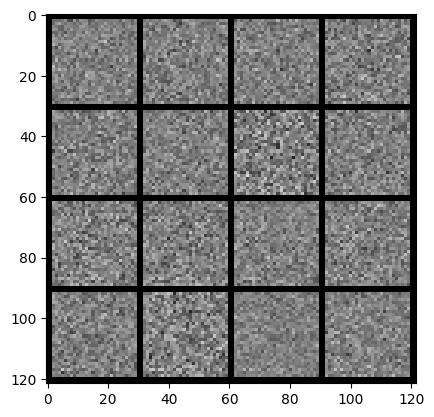

In [6]:
x, y = next(iter(dataloader))
print(x.shape, y.shape)
print (y[0:10])

noise = gen_noise(bs, z_dim)
fake = gen(noise)
show(fake)

In [13]:
#calculating the loss

#generator loss

def calc_gen_loss(loss_func, gen, disc, number, z_dim):
  noise = gen_noise(number, z_dim)
  fake = gen(noise)
  pred = disc(fake)
  targets = torch.ones_like(pred)
  gen_loss = loss_func(pred, targets)
  return gen_loss

def calc_disc_loss(loss_func, gen, disc, number, real, z_dim):
  noise = gen_noise(number, z_dim)
  fake=gen(noise)
  disc_fake = disc(fake.detach())
  disc_fake_targets = torch.zeros_like(disc_fake)   #ideal when fake is detected as all zeros
  disc_fake_loss = loss_func(disc_fake, disc_fake_targets)

  disc_real = disc(real)
  disc_real_targets = torch.ones_like(disc_real)     #ideal is when real is detected as all ones
  disc_real_loss = loss_func(disc_real, disc_real_targets)

  disc_loss = (disc_fake_loss + disc_real_loss)/2
  return disc_loss

  0%|          | 0/469 [00:00<?, ?it/s]

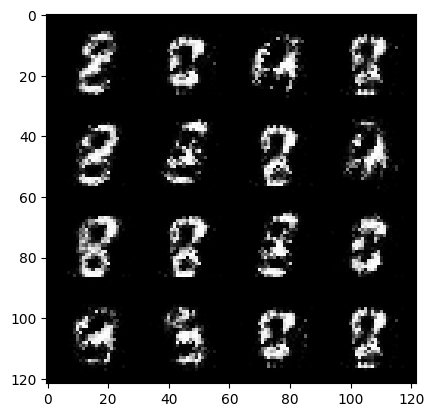

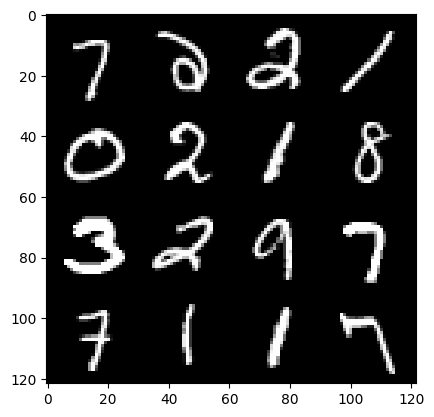

0: step 19500 / Gen loss: 5.675018690427145 / Disc loss: 0.03906416531341768


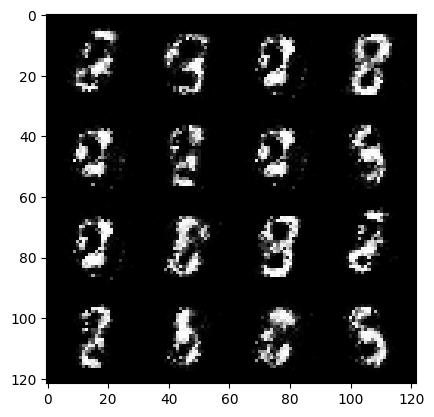

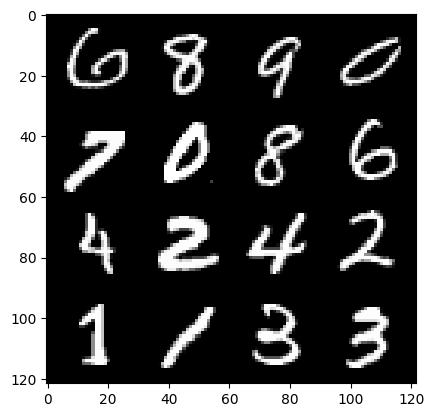

0: step 19800 / Gen loss: 5.582259786923722 / Disc loss: 0.03863543531236548


  0%|          | 0/469 [00:00<?, ?it/s]

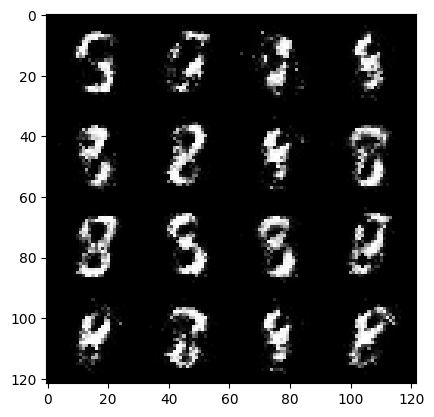

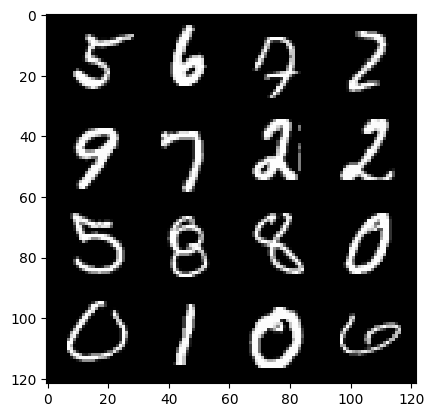

1: step 20100 / Gen loss: 5.540425399144491 / Disc loss: 0.04194174661611514


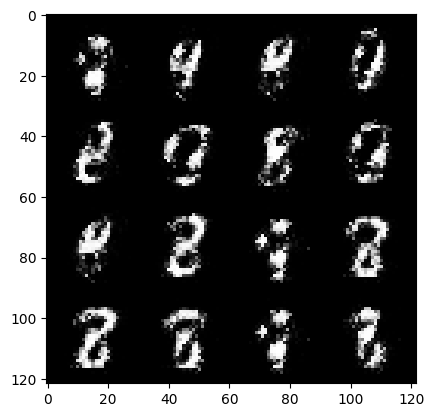

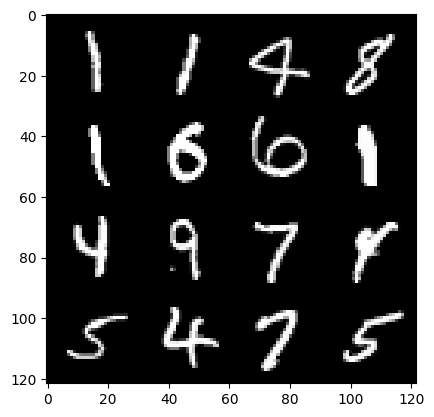

1: step 20400 / Gen loss: 5.311443503697713 / Disc loss: 0.049534243115534345


  0%|          | 0/469 [00:00<?, ?it/s]

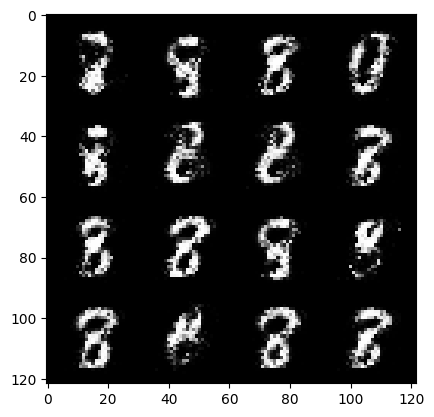

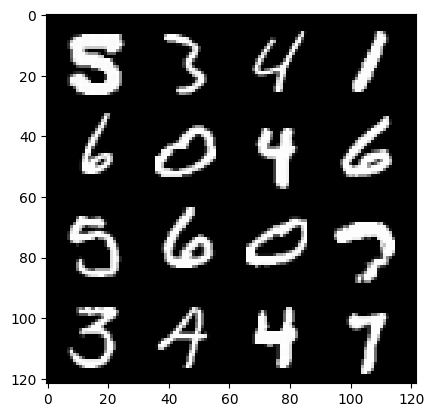

2: step 20700 / Gen loss: 5.439497628211975 / Disc loss: 0.03787938534282149


  0%|          | 0/469 [00:00<?, ?it/s]

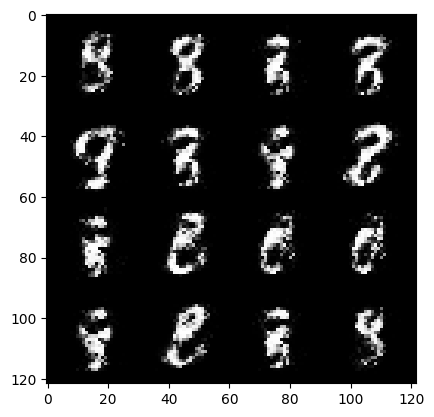

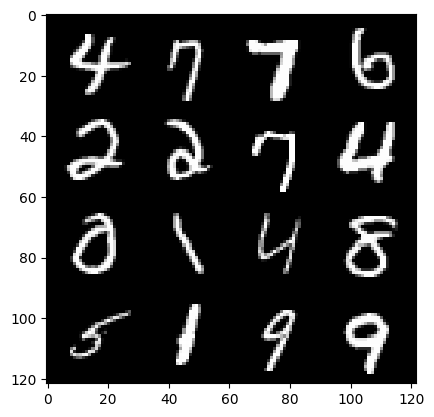

3: step 21000 / Gen loss: 5.47519764741262 / Disc loss: 0.042949051937709294


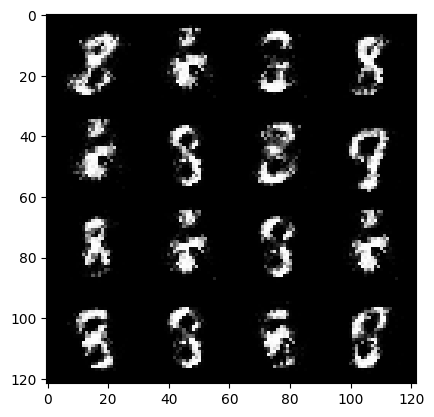

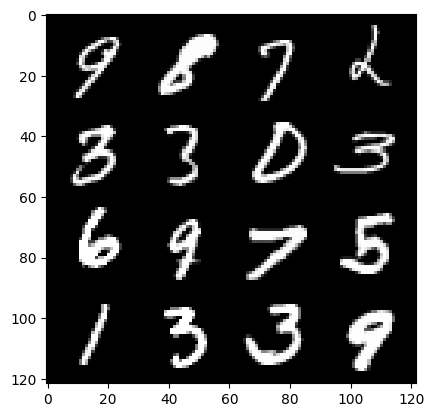

3: step 21300 / Gen loss: 5.554430623054504 / Disc loss: 0.043647261671721914


  0%|          | 0/469 [00:00<?, ?it/s]

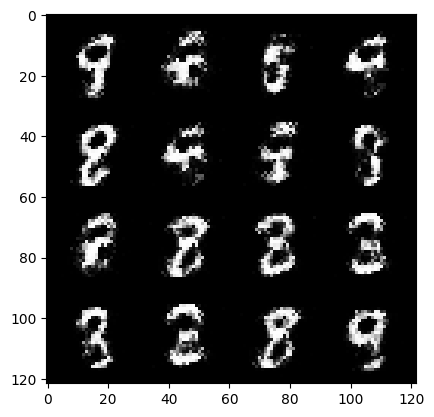

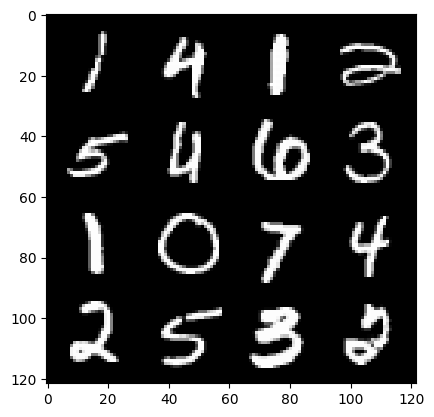

4: step 21600 / Gen loss: 5.53893699804942 / Disc loss: 0.04853359345812351


  0%|          | 0/469 [00:00<?, ?it/s]

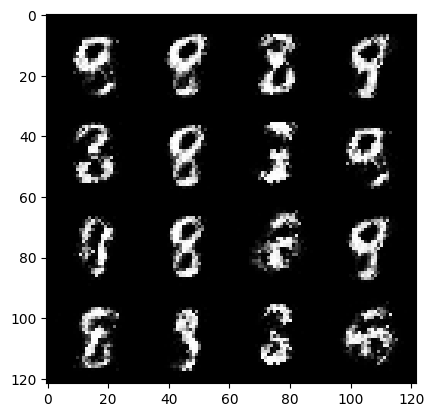

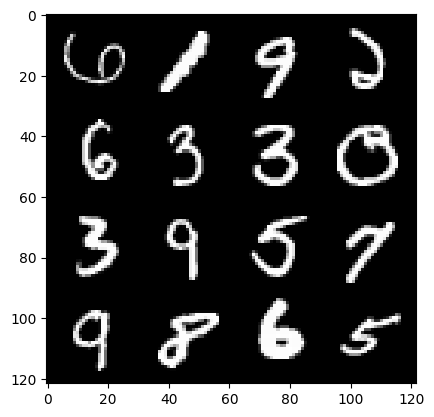

5: step 21900 / Gen loss: 5.5108274841308615 / Disc loss: 0.05193457227200265


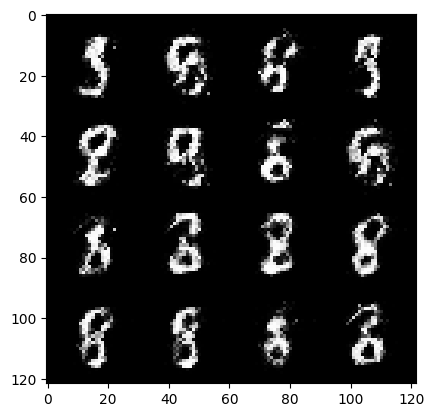

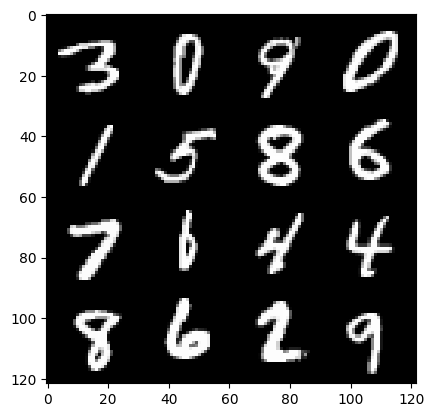

5: step 22200 / Gen loss: 5.341080244382219 / Disc loss: 0.04942253157496454


  0%|          | 0/469 [00:00<?, ?it/s]

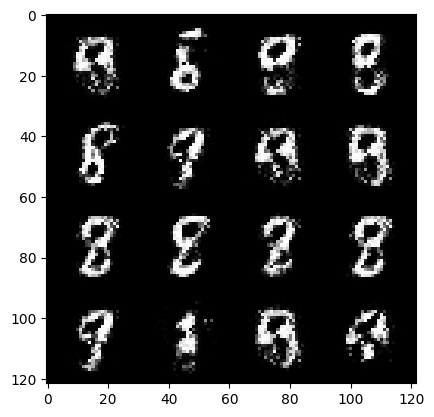

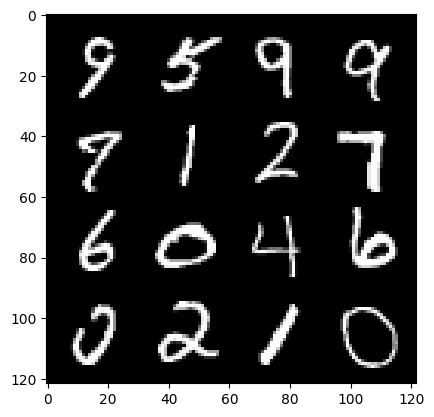

6: step 22500 / Gen loss: 5.189356554349266 / Disc loss: 0.0546532354255517


  0%|          | 0/469 [00:00<?, ?it/s]

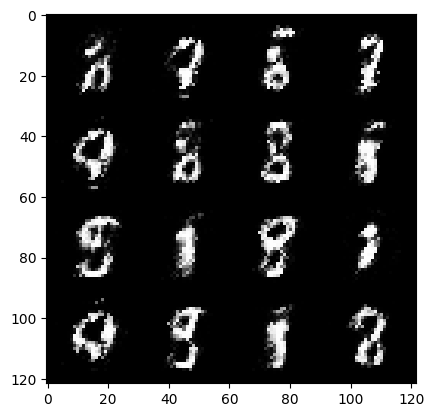

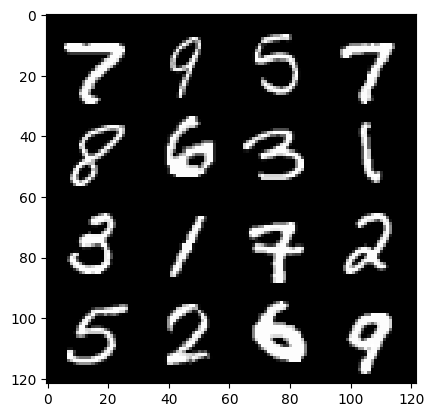

7: step 22800 / Gen loss: 5.410704703330992 / Disc loss: 0.05656709236092867


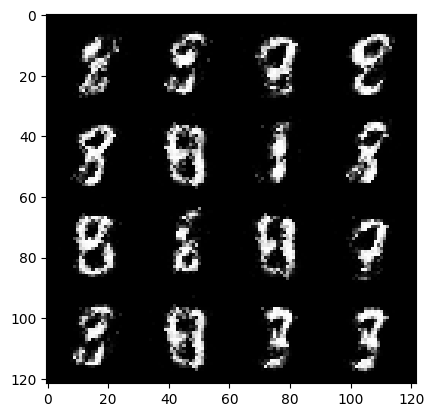

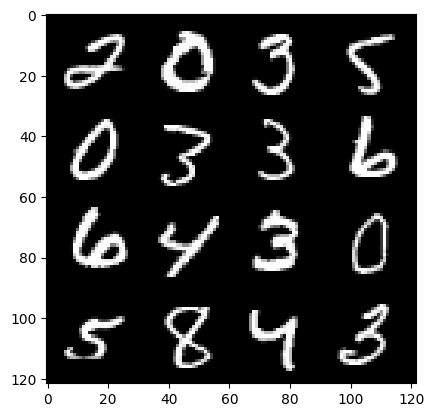

7: step 23100 / Gen loss: 5.057042114734648 / Disc loss: 0.05959656332309043


  0%|          | 0/469 [00:00<?, ?it/s]

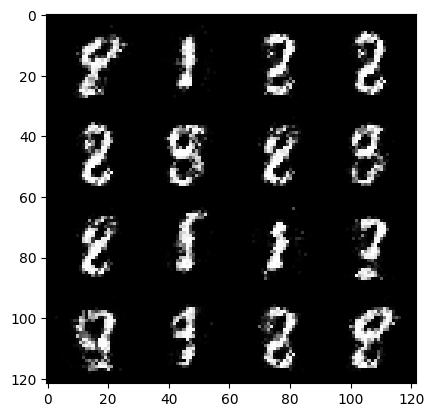

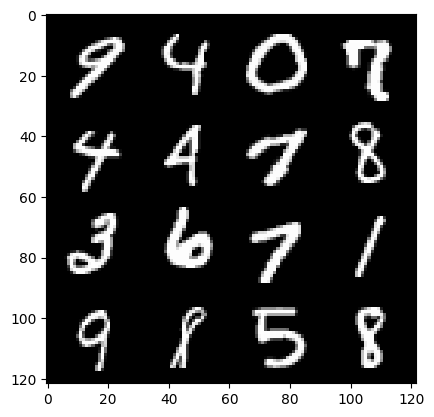

8: step 23400 / Gen loss: 5.1423604631423965 / Disc loss: 0.04878745049238205


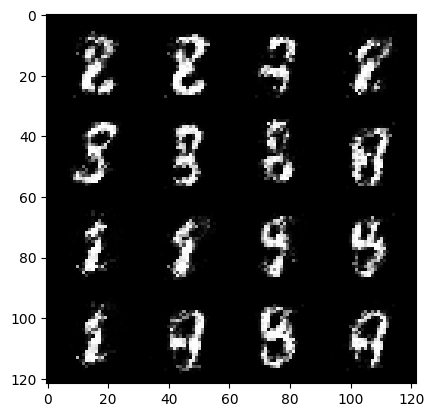

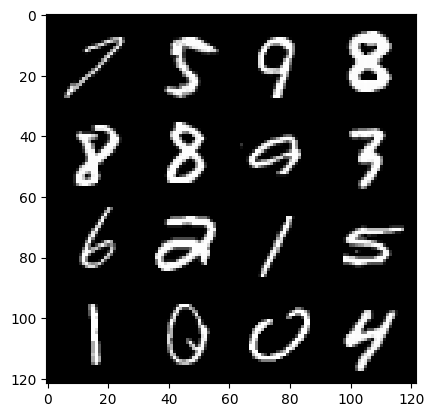

8: step 23700 / Gen loss: 5.175200484593709 / Disc loss: 0.054046926610171825


  0%|          | 0/469 [00:00<?, ?it/s]

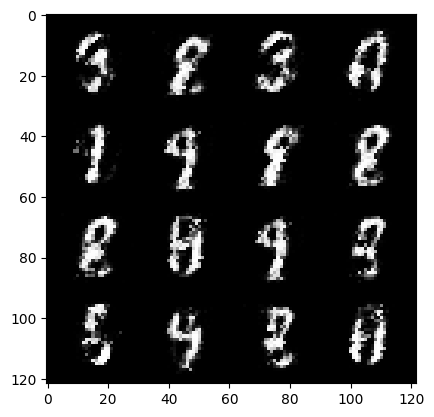

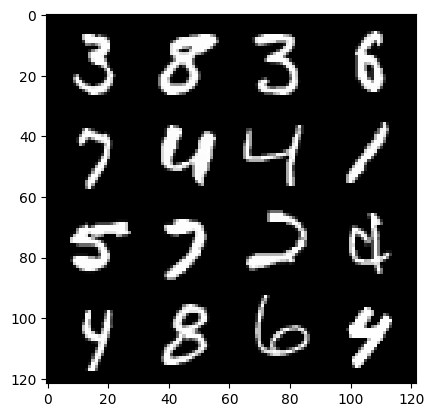

9: step 24000 / Gen loss: 5.217333528995514 / Disc loss: 0.06504448999029896


  0%|          | 0/469 [00:00<?, ?it/s]

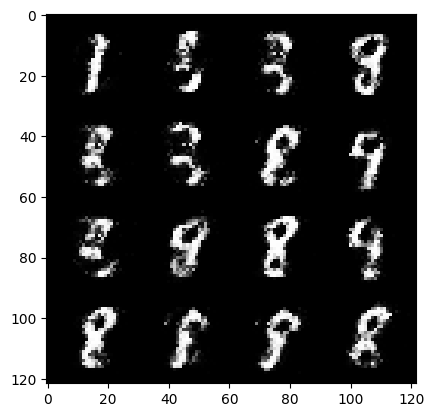

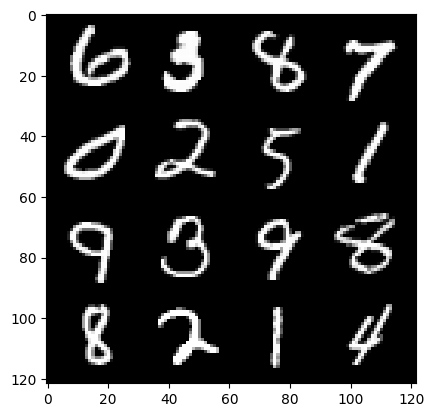

10: step 24300 / Gen loss: 4.854476419289908 / Disc loss: 0.08208917068938407


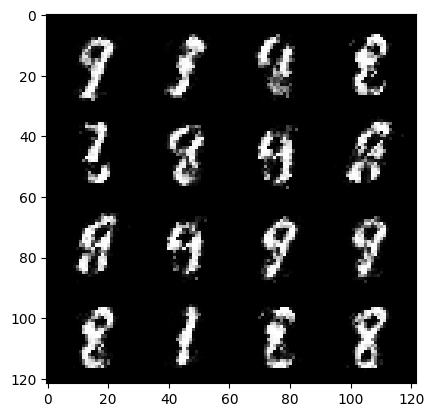

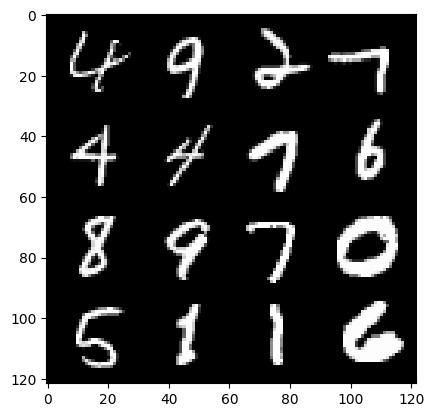

10: step 24600 / Gen loss: 4.7408895055453 / Disc loss: 0.08439452158908047


  0%|          | 0/469 [00:00<?, ?it/s]

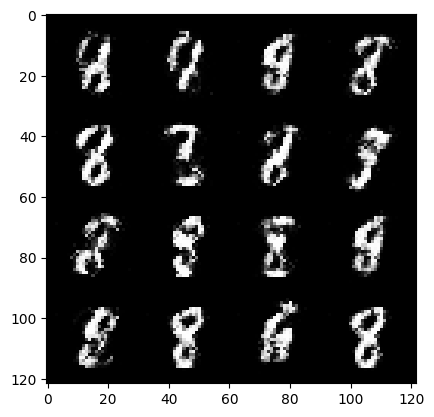

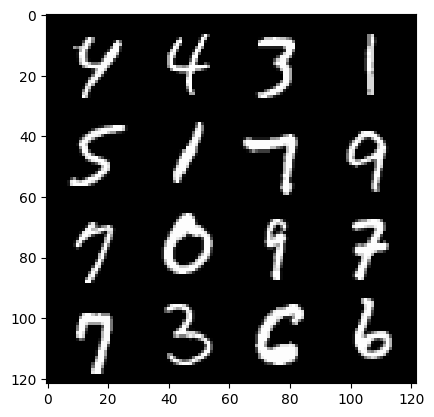

11: step 24900 / Gen loss: 4.705512291590374 / Disc loss: 0.0835047382799287


  0%|          | 0/469 [00:00<?, ?it/s]

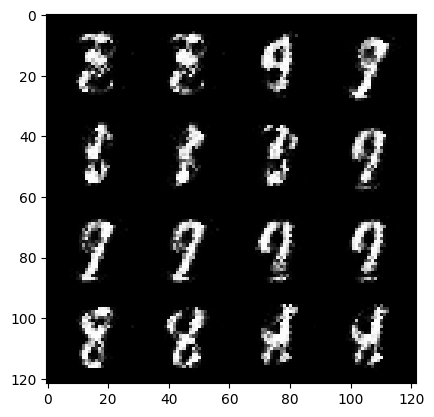

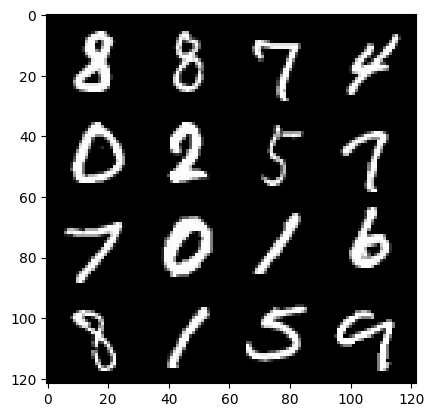

12: step 25200 / Gen loss: 4.557776721318563 / Disc loss: 0.0899684770777822


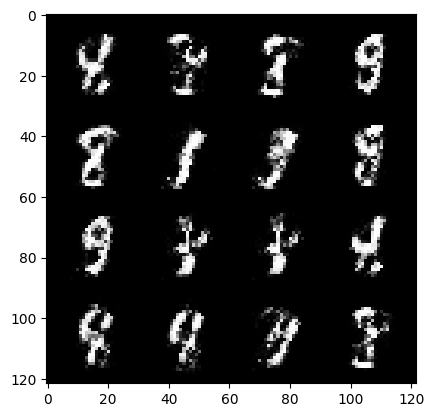

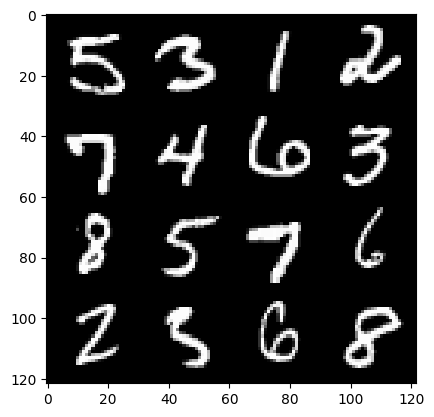

12: step 25500 / Gen loss: 4.796883964538574 / Disc loss: 0.08433400049805648


  0%|          | 0/469 [00:00<?, ?it/s]

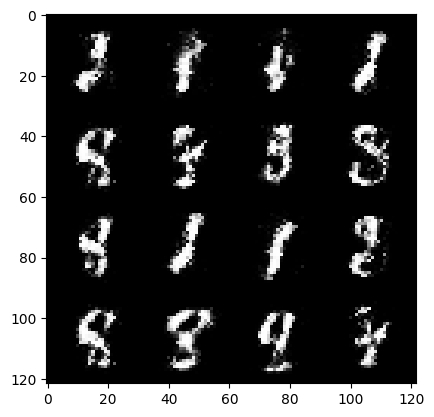

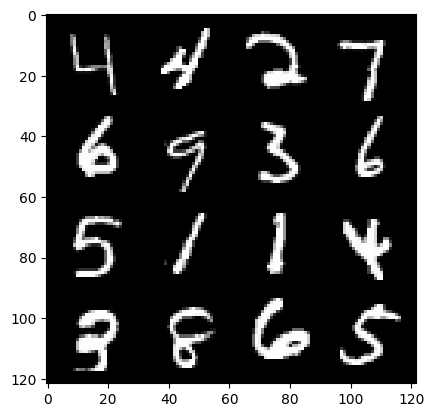

13: step 25800 / Gen loss: 4.510174030462898 / Disc loss: 0.08676463194191453


  0%|          | 0/469 [00:00<?, ?it/s]

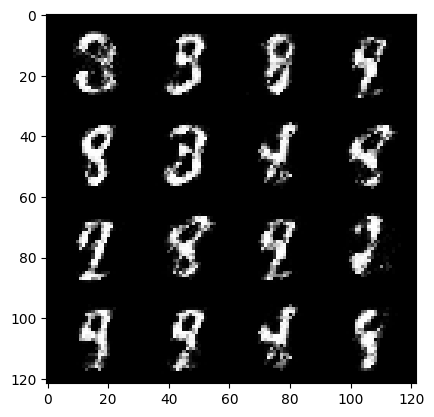

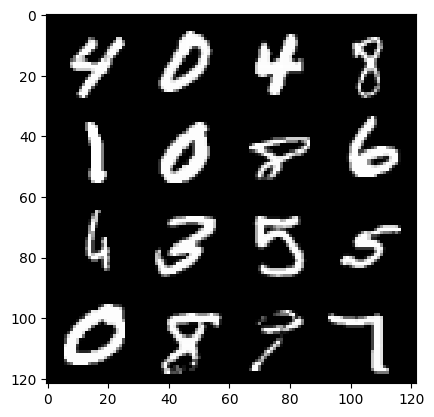

14: step 26100 / Gen loss: 4.719519021511079 / Disc loss: 0.07845388134941458


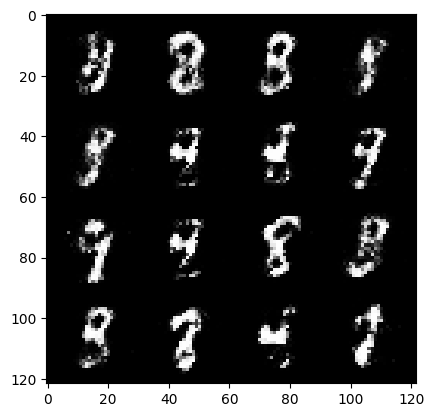

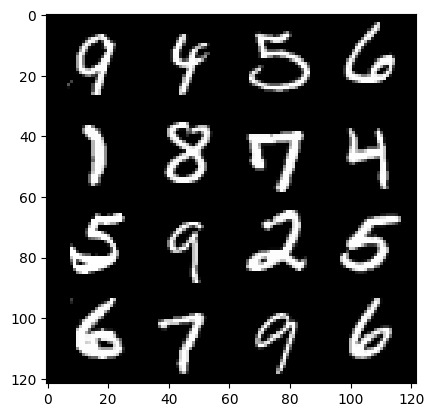

14: step 26400 / Gen loss: 4.460435563723246 / Disc loss: 0.08066625167926156


  0%|          | 0/469 [00:00<?, ?it/s]

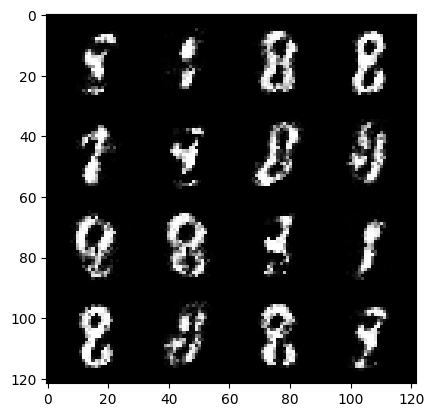

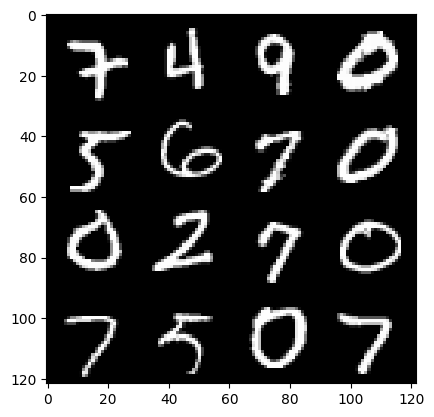

15: step 26700 / Gen loss: 4.417260552247368 / Disc loss: 0.10489856687684851


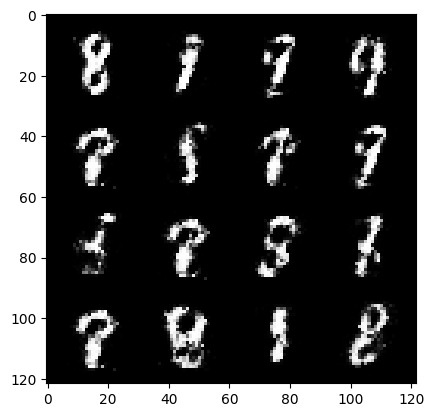

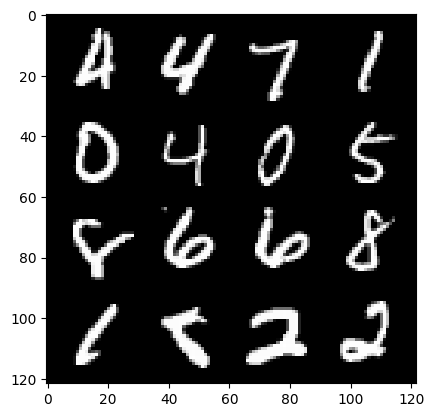

15: step 27000 / Gen loss: 4.2707133332888265 / Disc loss: 0.10203259264429407


  0%|          | 0/469 [00:00<?, ?it/s]

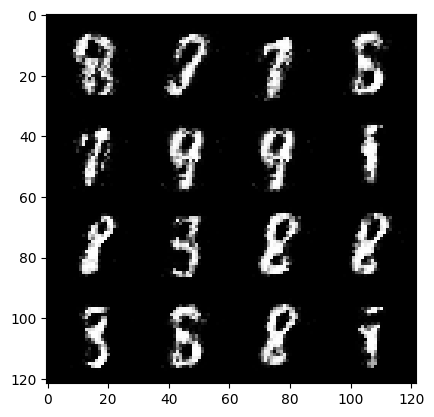

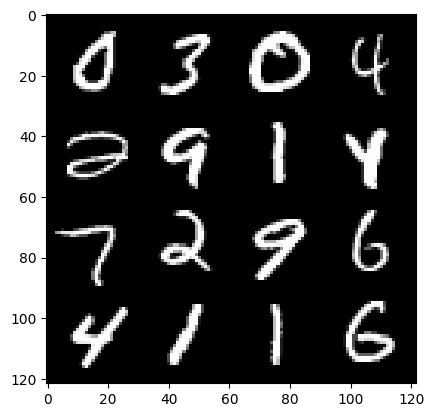

16: step 27300 / Gen loss: 4.256937792301179 / Disc loss: 0.09113510883102814


  0%|          | 0/469 [00:00<?, ?it/s]

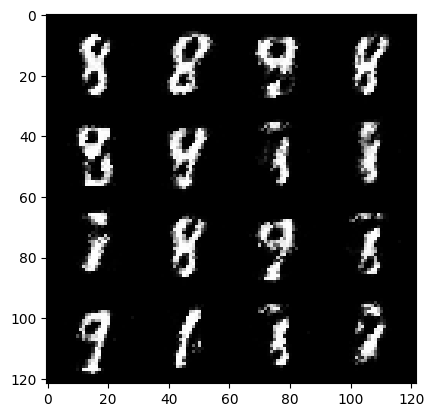

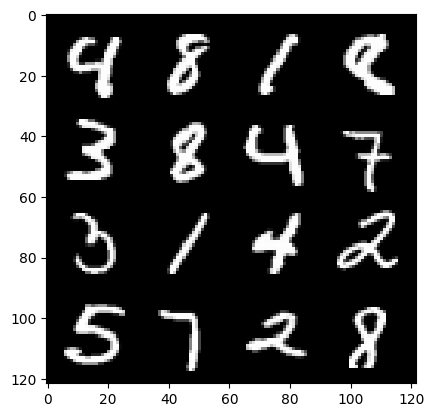

17: step 27600 / Gen loss: 4.21030987898509 / Disc loss: 0.10726106606423853


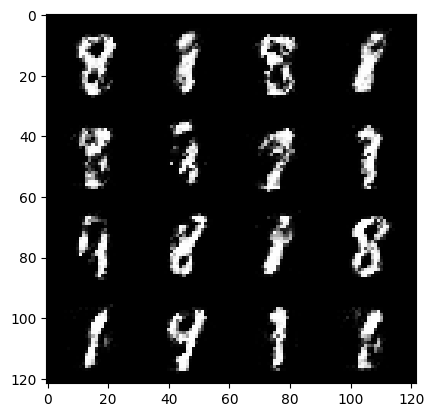

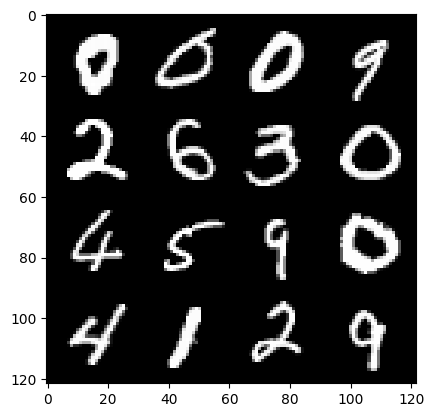

17: step 27900 / Gen loss: 4.240919036865235 / Disc loss: 0.0952674987539649


  0%|          | 0/469 [00:00<?, ?it/s]

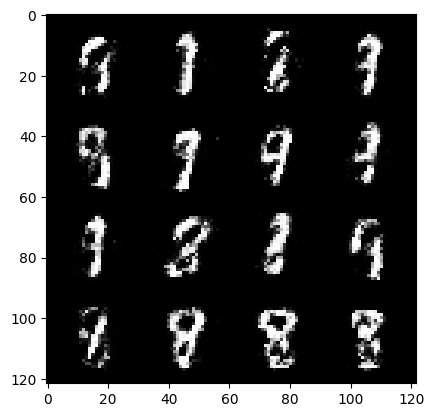

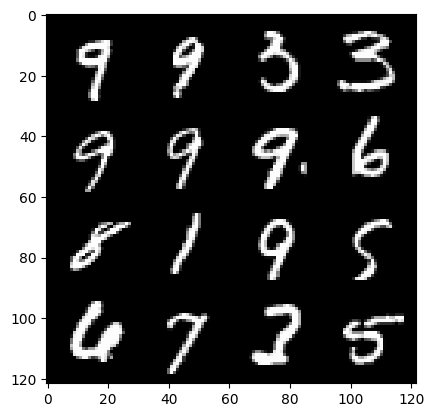

18: step 28200 / Gen loss: 4.106447385946908 / Disc loss: 0.09808721813062823


  0%|          | 0/469 [00:00<?, ?it/s]

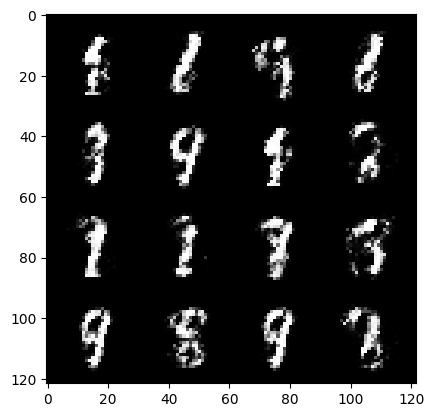

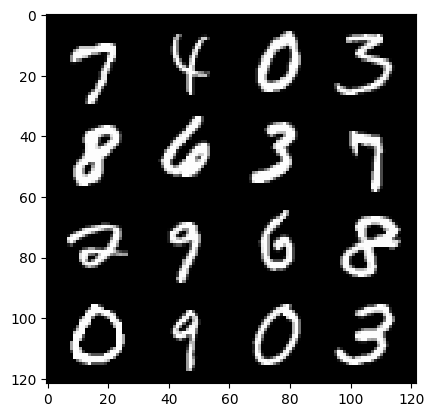

19: step 28500 / Gen loss: 4.182766746679942 / Disc loss: 0.09568127224842712


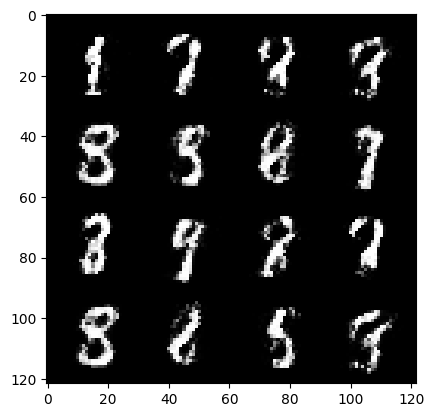

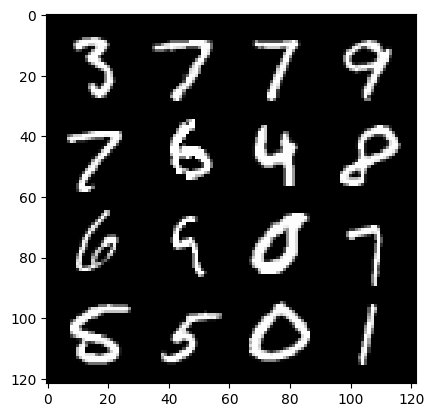

19: step 28800 / Gen loss: 3.959381098747254 / Disc loss: 0.11443843953311435


  0%|          | 0/469 [00:00<?, ?it/s]

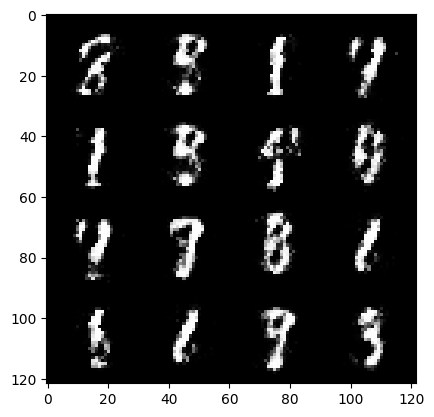

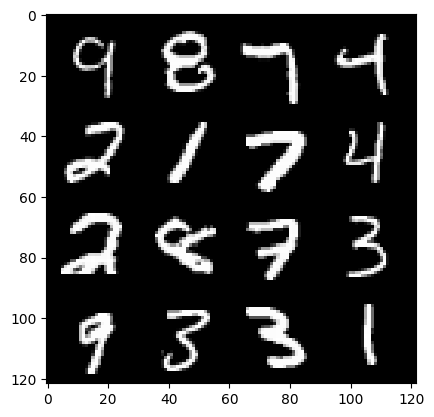

20: step 29100 / Gen loss: 4.00635711113612 / Disc loss: 0.10459401514381168


  0%|          | 0/469 [00:00<?, ?it/s]

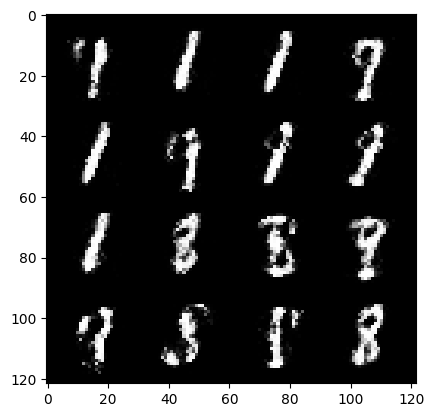

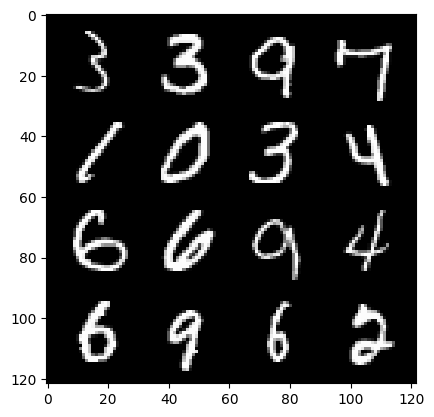

21: step 29400 / Gen loss: 3.9964683723449714 / Disc loss: 0.1108063253139456


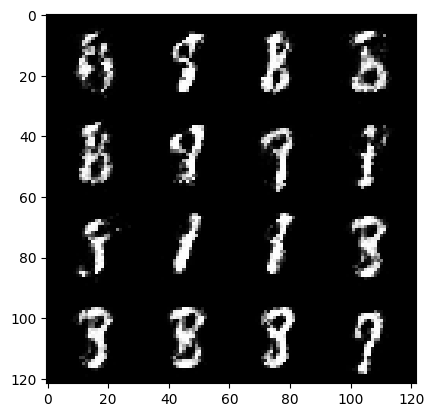

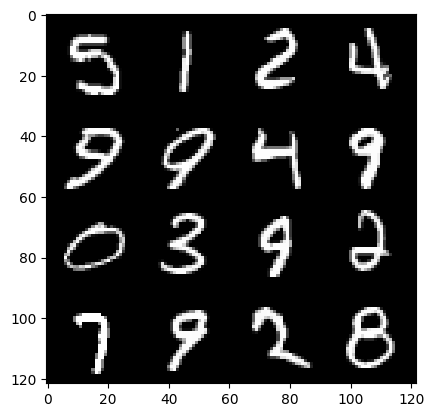

21: step 29700 / Gen loss: 3.866415923436483 / Disc loss: 0.12447632392247507


  0%|          | 0/469 [00:00<?, ?it/s]

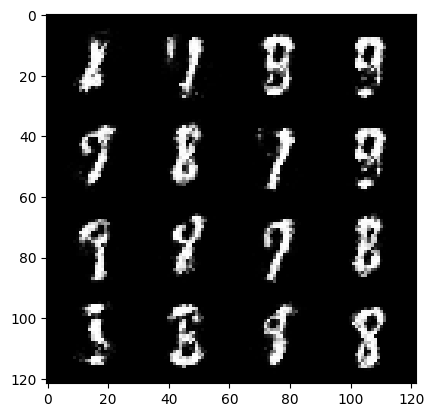

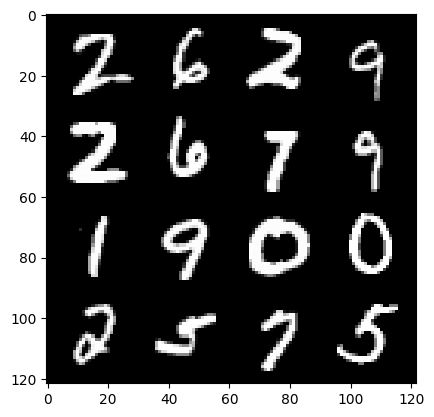

22: step 30000 / Gen loss: 3.8502470604578645 / Disc loss: 0.11615207495788737


  0%|          | 0/469 [00:00<?, ?it/s]

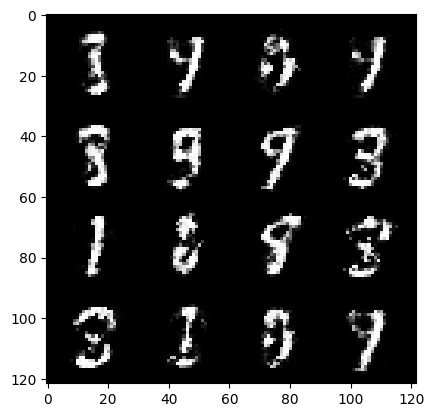

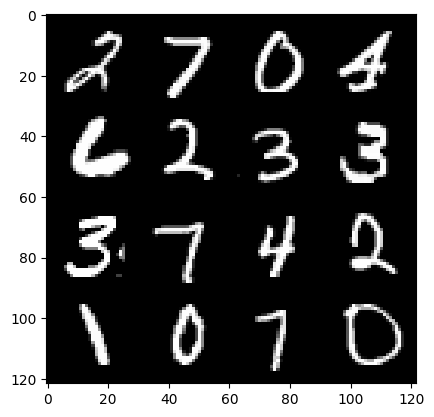

23: step 30300 / Gen loss: 3.893563445409143 / Disc loss: 0.11498779972394312


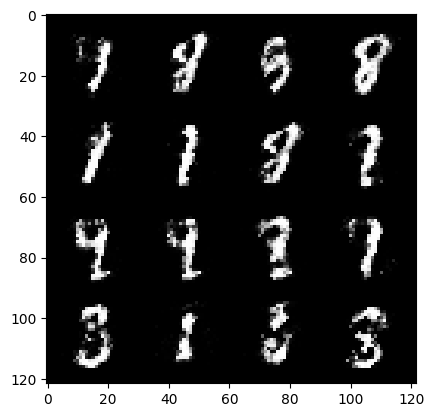

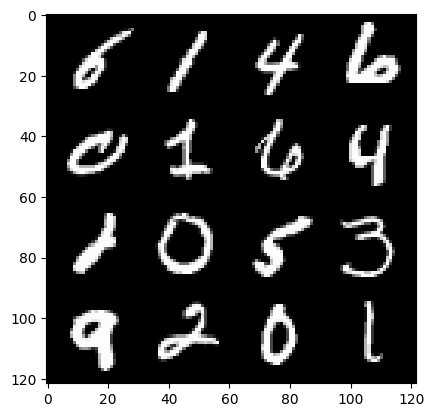

23: step 30600 / Gen loss: 3.7460926342010517 / Disc loss: 0.12795433046917123


  0%|          | 0/469 [00:00<?, ?it/s]

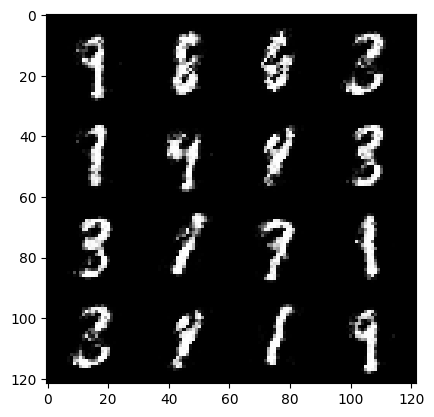

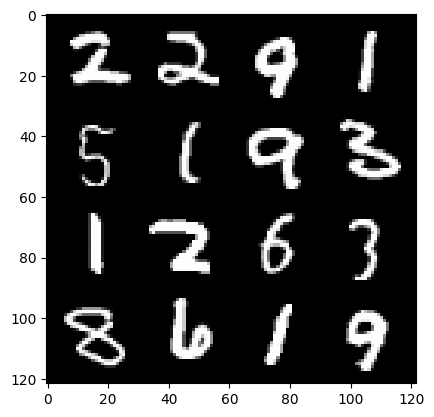

24: step 30900 / Gen loss: 3.7433144315083826 / Disc loss: 0.11961485038201015


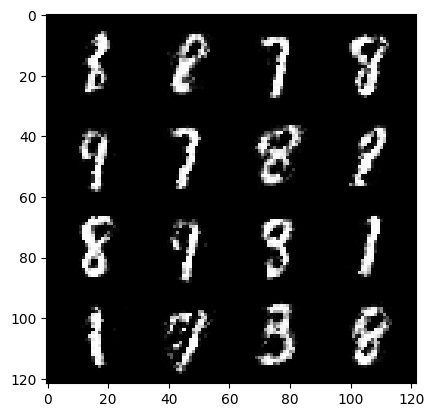

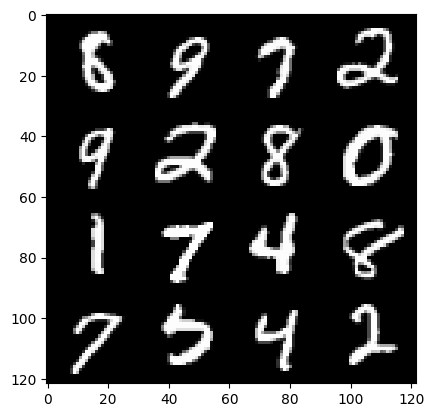

24: step 31200 / Gen loss: 3.703272761503856 / Disc loss: 0.13409222779174645


  0%|          | 0/469 [00:00<?, ?it/s]

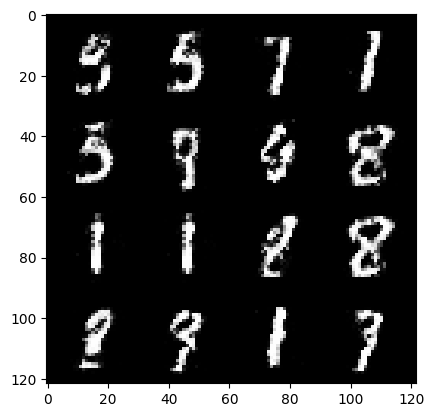

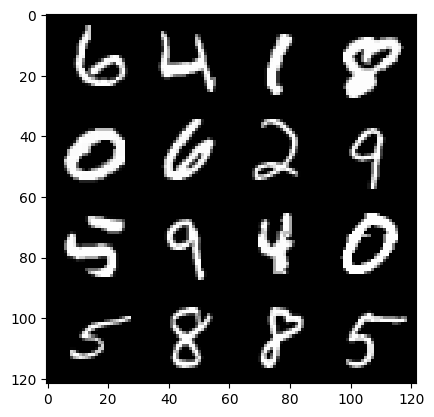

25: step 31500 / Gen loss: 3.6333905386924705 / Disc loss: 0.1465525243555506


  0%|          | 0/469 [00:00<?, ?it/s]

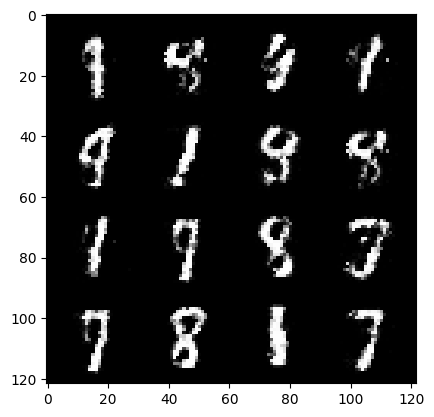

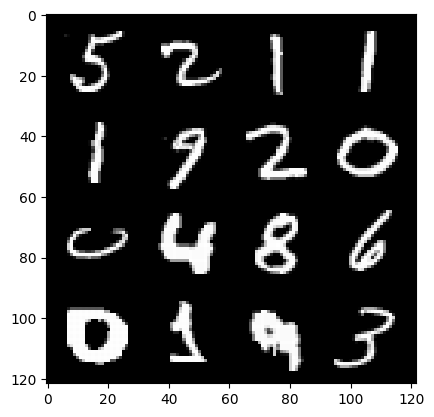

26: step 31800 / Gen loss: 3.516905698776244 / Disc loss: 0.16794326230883608


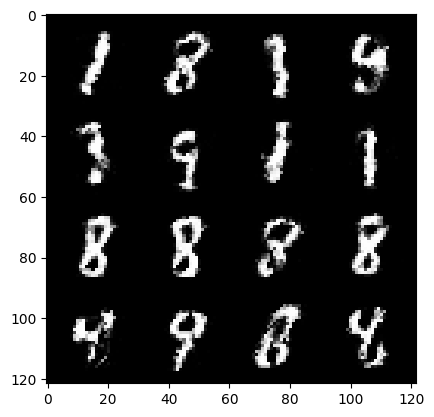

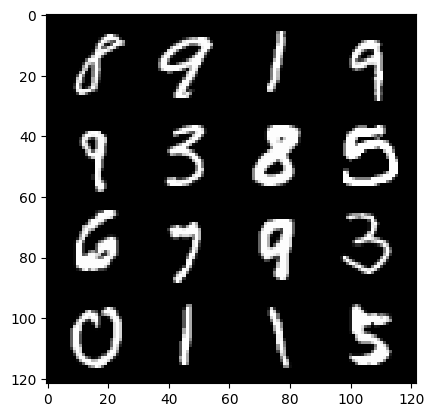

26: step 32100 / Gen loss: 3.3953905248641987 / Disc loss: 0.159500447511673


  0%|          | 0/469 [00:00<?, ?it/s]

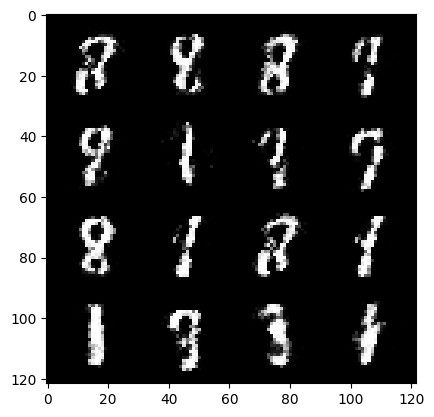

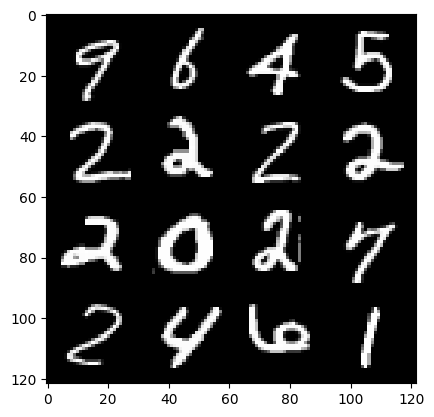

27: step 32400 / Gen loss: 3.3278538608551043 / Disc loss: 0.16022485877076795


  0%|          | 0/469 [00:00<?, ?it/s]

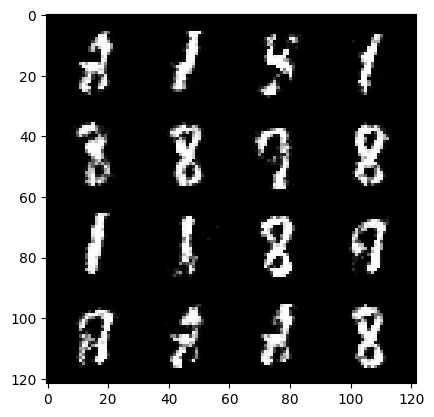

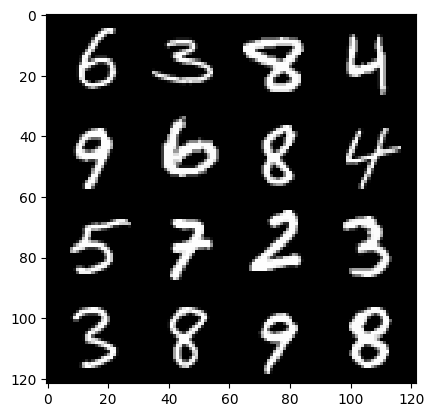

28: step 32700 / Gen loss: 3.370422045389813 / Disc loss: 0.16029777236282833


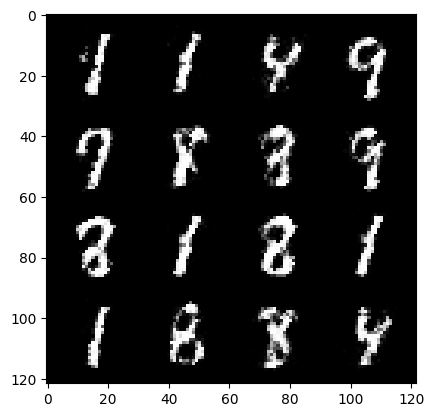

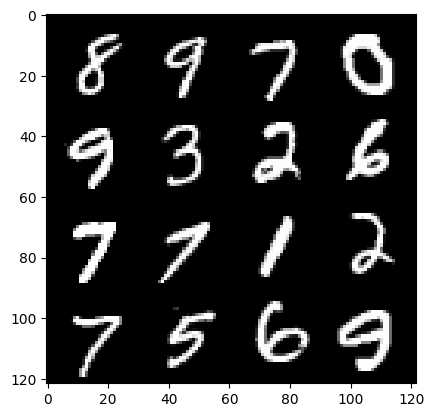

28: step 33000 / Gen loss: 3.485013572374981 / Disc loss: 0.14830743275582786


  0%|          | 0/469 [00:00<?, ?it/s]

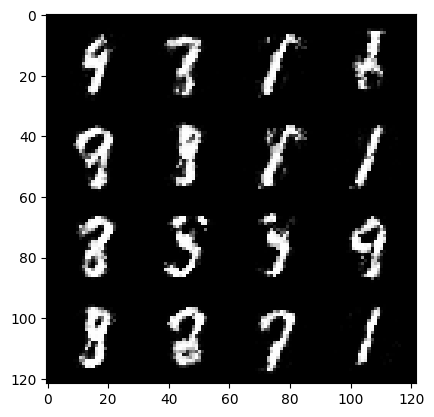

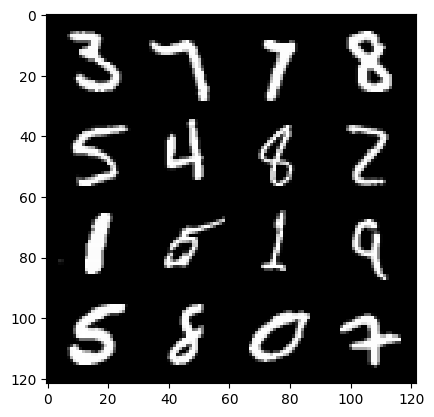

29: step 33300 / Gen loss: 3.298495093186694 / Disc loss: 0.17600734184185662


  0%|          | 0/469 [00:00<?, ?it/s]

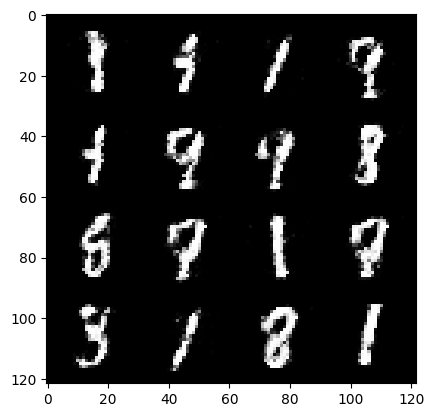

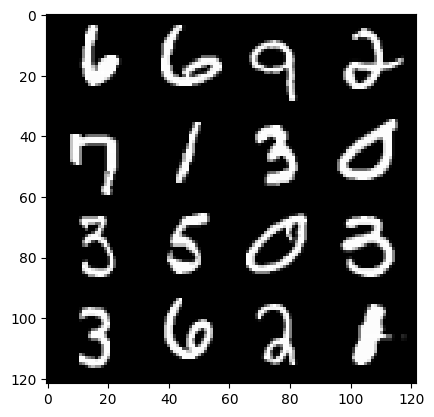

30: step 33600 / Gen loss: 3.1421933102607724 / Disc loss: 0.17749375758071737


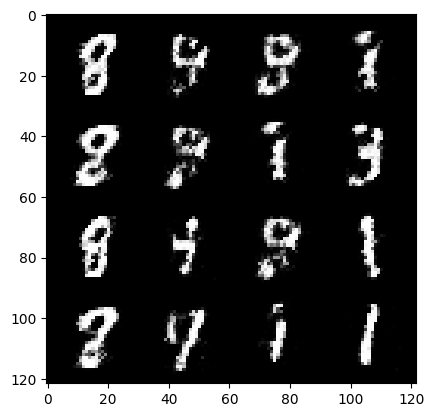

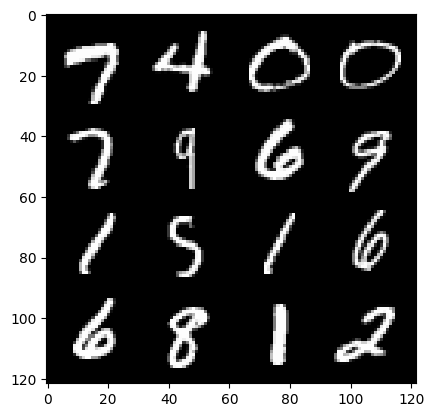

30: step 33900 / Gen loss: 3.1505674783388775 / Disc loss: 0.1786297223965326


  0%|          | 0/469 [00:00<?, ?it/s]

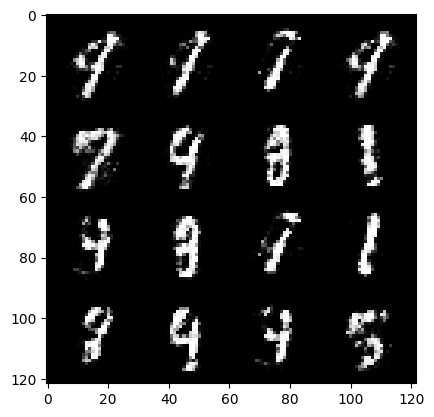

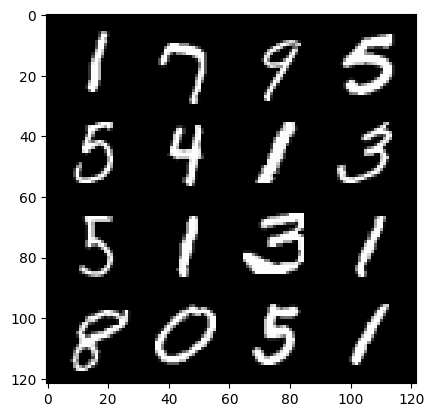

31: step 34200 / Gen loss: 3.1852543505032864 / Disc loss: 0.18116847435633346


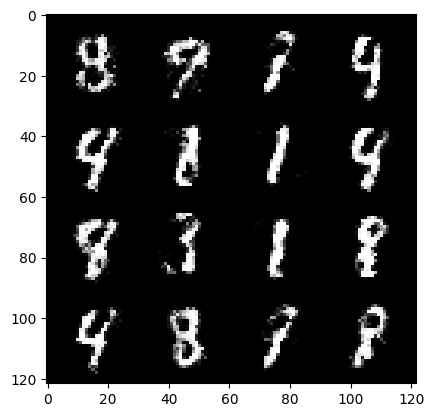

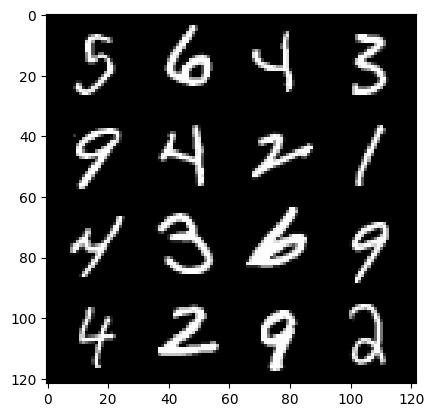

31: step 34500 / Gen loss: 3.1530016167958563 / Disc loss: 0.1769132124632596


  0%|          | 0/469 [00:00<?, ?it/s]

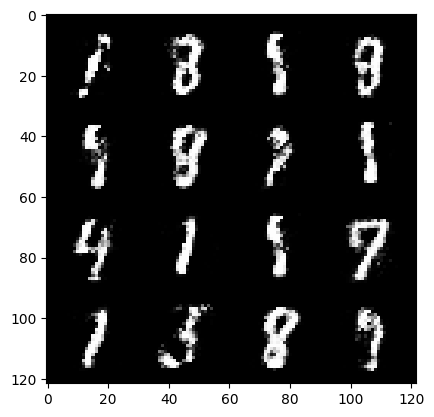

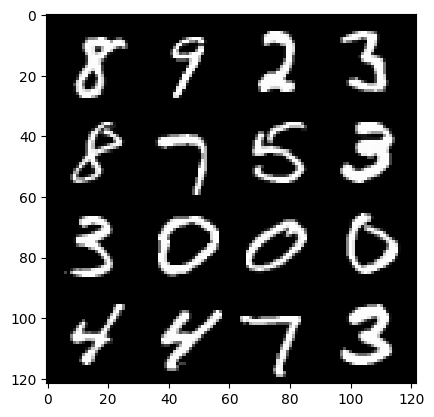

32: step 34800 / Gen loss: 3.1773961178461696 / Disc loss: 0.16525299934049456


  0%|          | 0/469 [00:00<?, ?it/s]

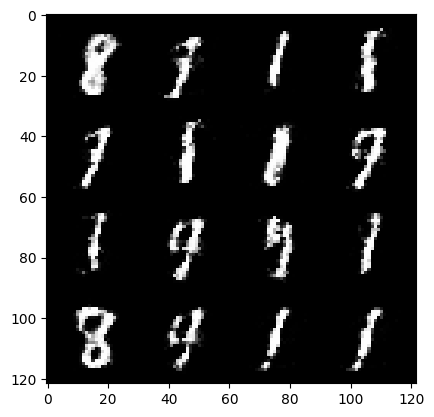

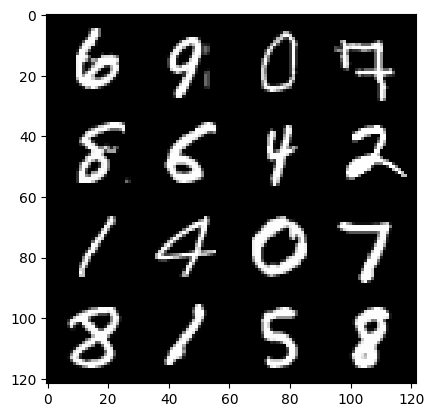

33: step 35100 / Gen loss: 3.103281236489613 / Disc loss: 0.16806906975805766


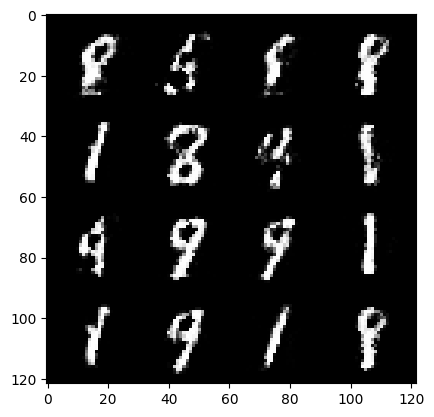

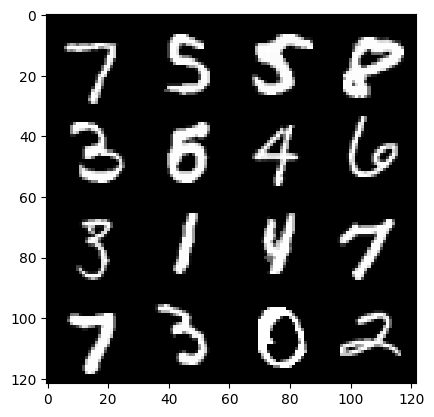

33: step 35400 / Gen loss: 3.1079706851641338 / Disc loss: 0.1766850617527961


  0%|          | 0/469 [00:00<?, ?it/s]

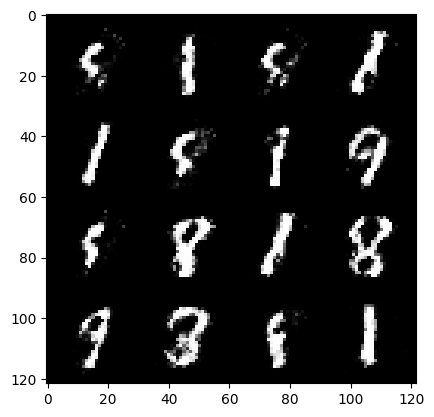

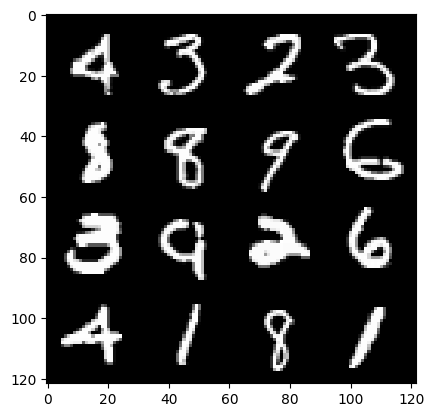

34: step 35700 / Gen loss: 2.9246444559097298 / Disc loss: 0.19503644029299413


  0%|          | 0/469 [00:00<?, ?it/s]

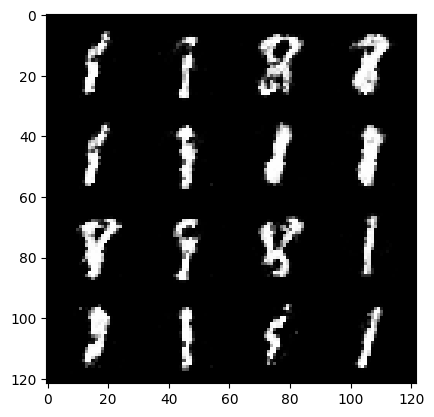

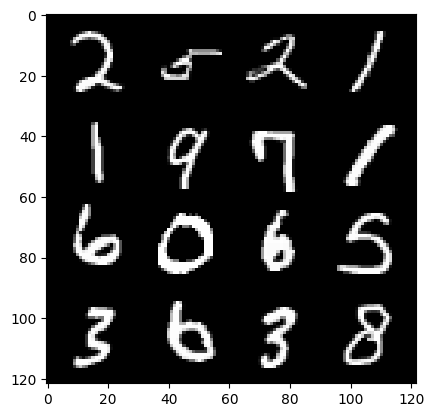

35: step 36000 / Gen loss: 2.8715811069806416 / Disc loss: 0.20376159749925155


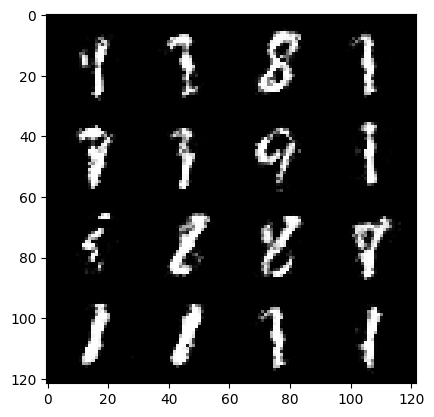

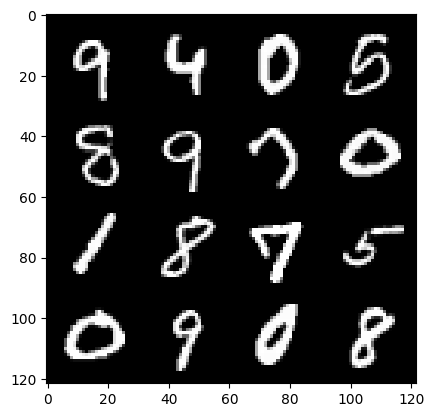

35: step 36300 / Gen loss: 2.7851459757486983 / Disc loss: 0.21982583577434223


  0%|          | 0/469 [00:00<?, ?it/s]

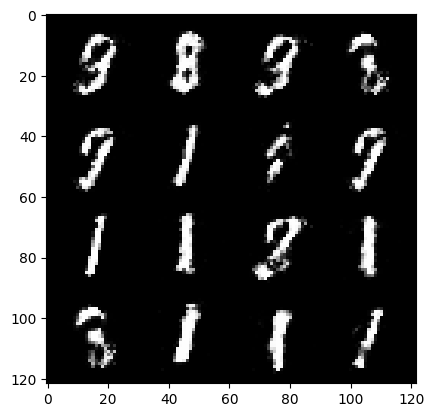

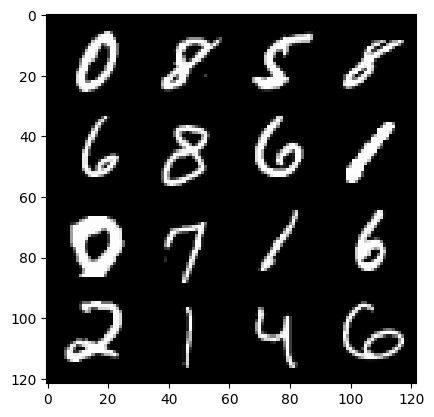

36: step 36600 / Gen loss: 2.7042500019073477 / Disc loss: 0.21994039021432393


  0%|          | 0/469 [00:00<?, ?it/s]

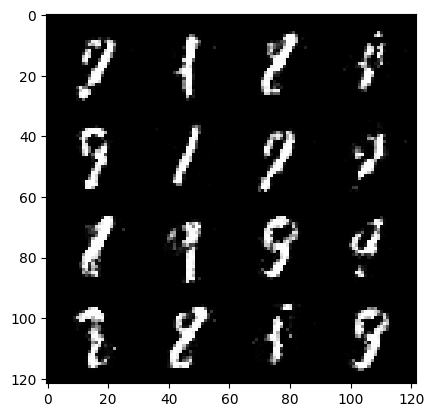

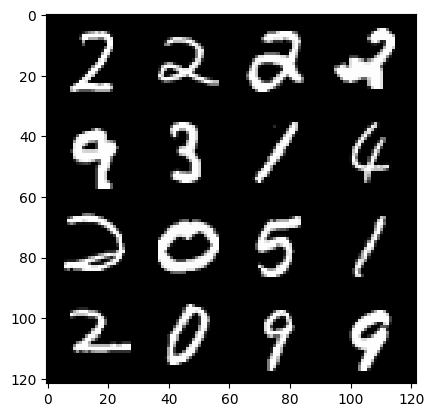

37: step 36900 / Gen loss: 2.7860262449582445 / Disc loss: 0.20364509977400302


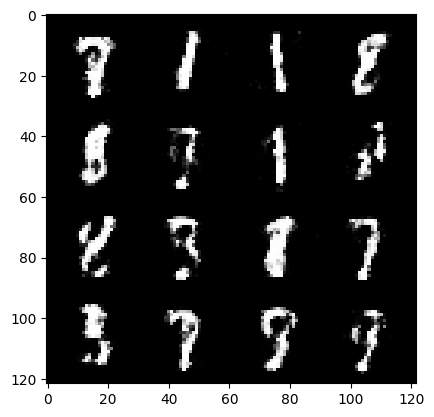

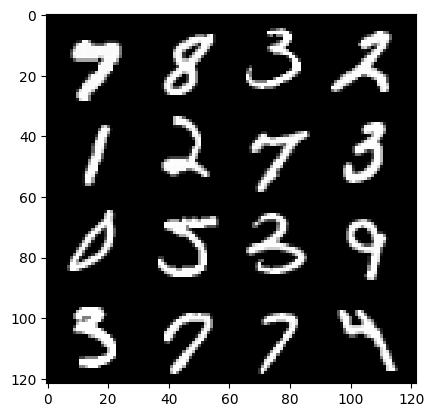

37: step 37200 / Gen loss: 2.8309648482004794 / Disc loss: 0.1939443284273148


  0%|          | 0/469 [00:00<?, ?it/s]

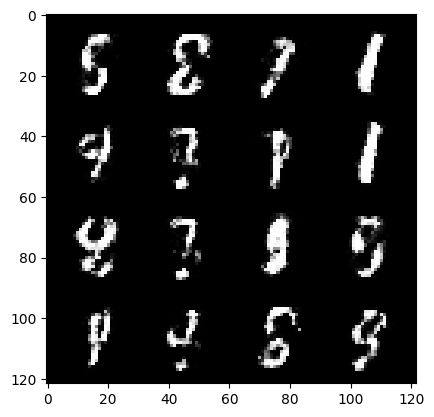

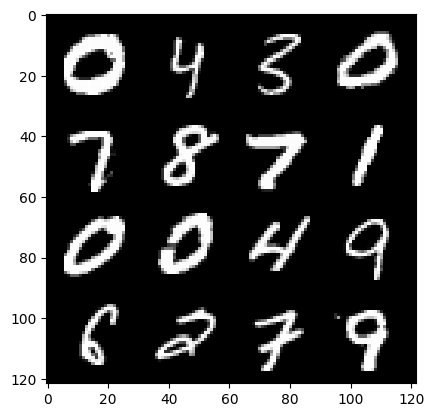

38: step 37500 / Gen loss: 2.750071107546487 / Disc loss: 0.20295967082182556


  0%|          | 0/469 [00:00<?, ?it/s]

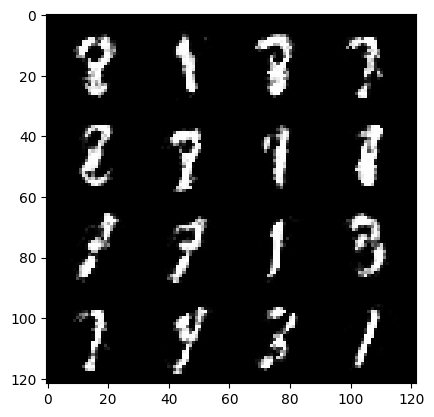

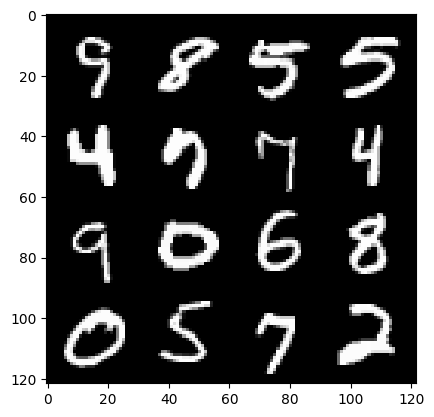

39: step 37800 / Gen loss: 2.730535009702046 / Disc loss: 0.20946977816522122


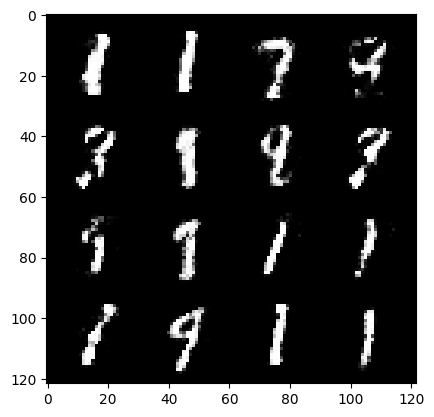

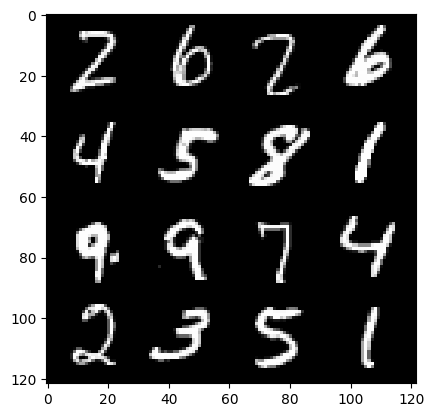

39: step 38100 / Gen loss: 2.7237256026267973 / Disc loss: 0.21438820985456294


  0%|          | 0/469 [00:00<?, ?it/s]

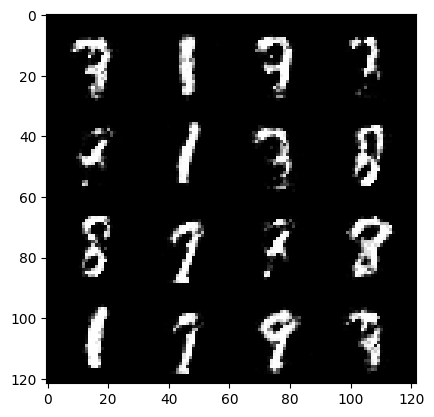

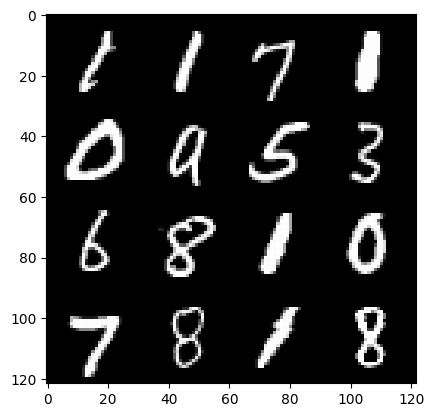

40: step 38400 / Gen loss: 2.7171045764287296 / Disc loss: 0.21723153869310996


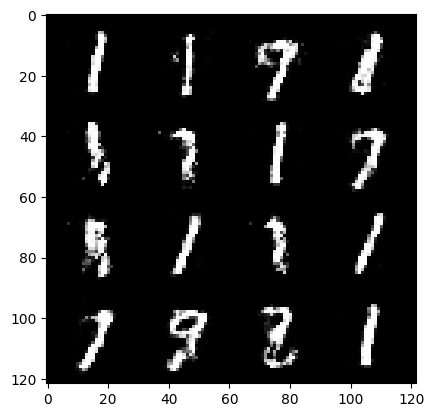

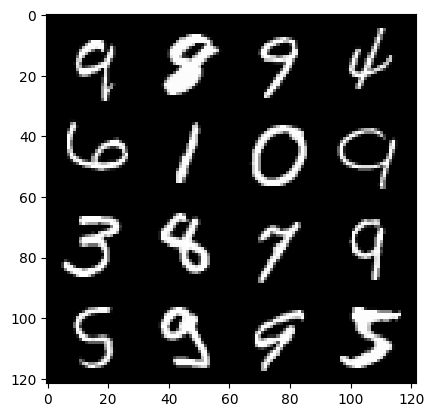

40: step 38700 / Gen loss: 2.6383288105328875 / Disc loss: 0.22916806787252403


  0%|          | 0/469 [00:00<?, ?it/s]

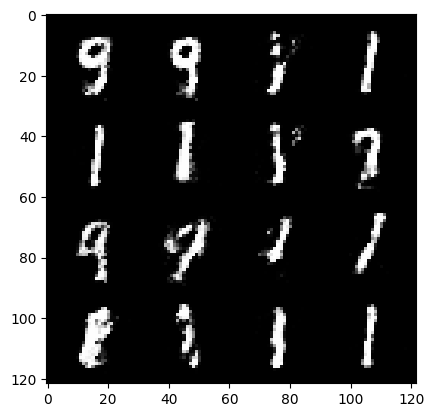

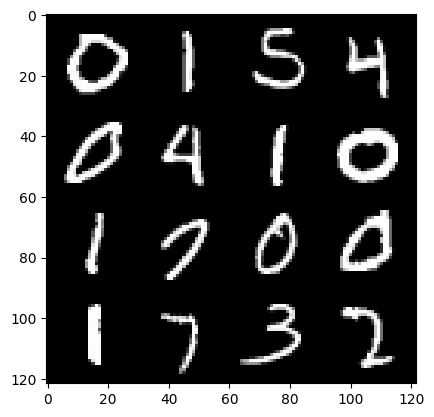

41: step 39000 / Gen loss: 2.5025269405047097 / Disc loss: 0.24717542365193362


  0%|          | 0/469 [00:00<?, ?it/s]

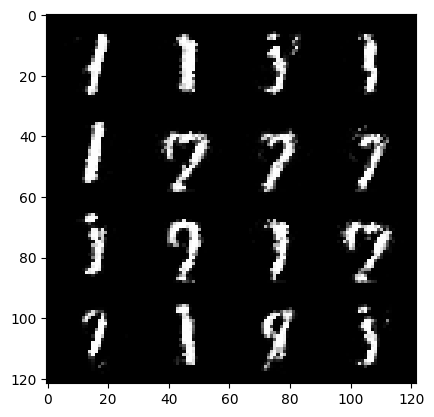

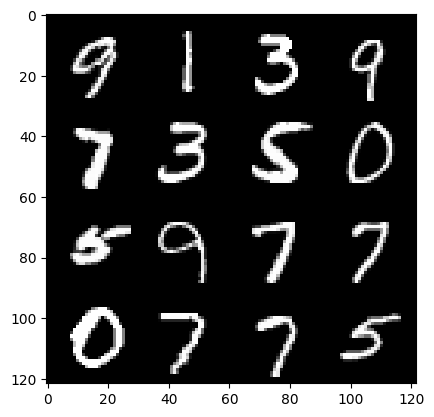

42: step 39300 / Gen loss: 2.496317299207053 / Disc loss: 0.23523121843735378


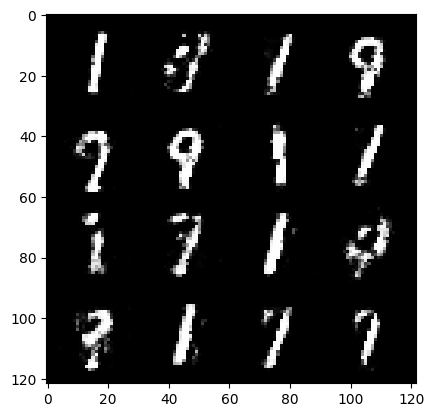

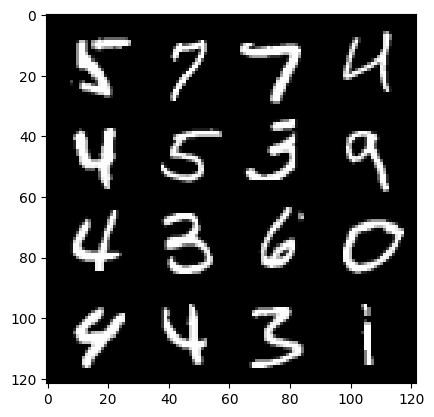

42: step 39600 / Gen loss: 2.591125107208889 / Disc loss: 0.2222374931971231


  0%|          | 0/469 [00:00<?, ?it/s]

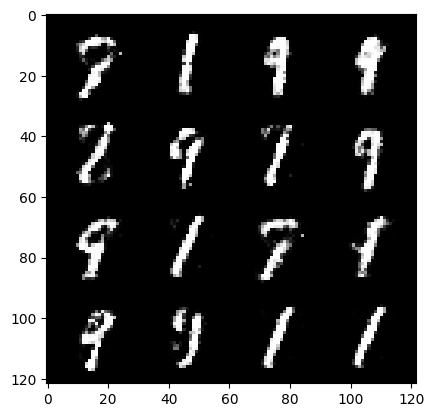

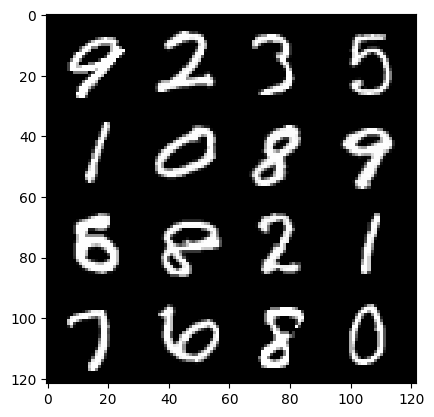

43: step 39900 / Gen loss: 2.60182136933009 / Disc loss: 0.21887474278608948


  0%|          | 0/469 [00:00<?, ?it/s]

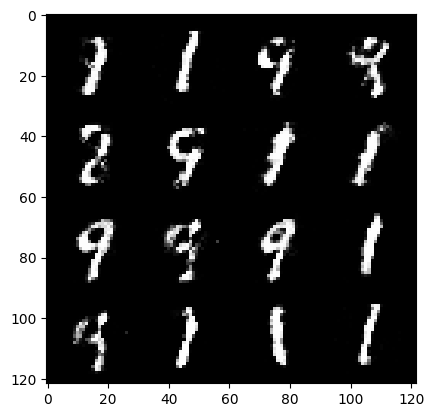

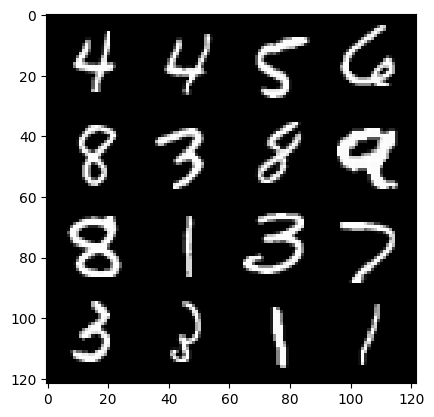

44: step 40200 / Gen loss: 2.554369908571243 / Disc loss: 0.232648981710275


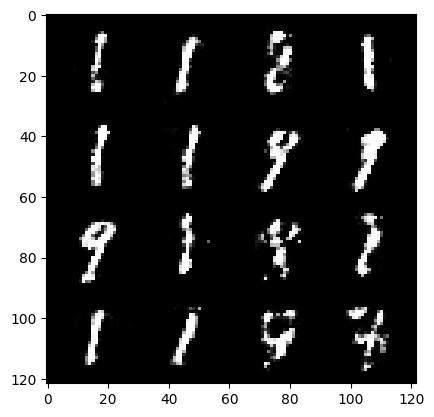

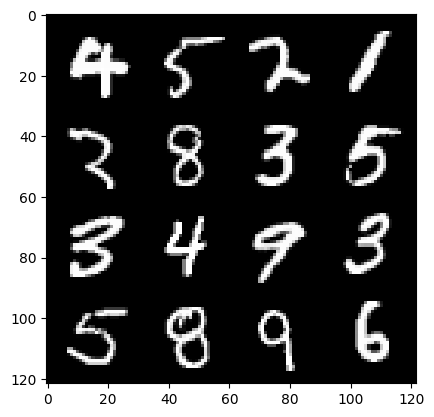

44: step 40500 / Gen loss: 2.5448857641220104 / Disc loss: 0.22560146952668825


  0%|          | 0/469 [00:00<?, ?it/s]

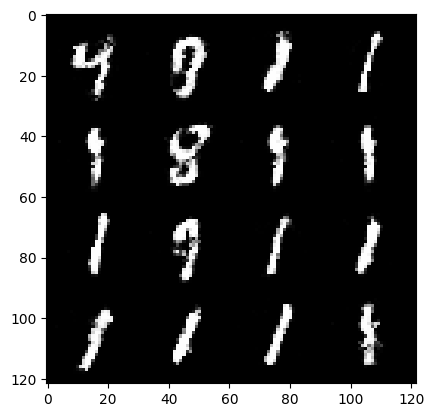

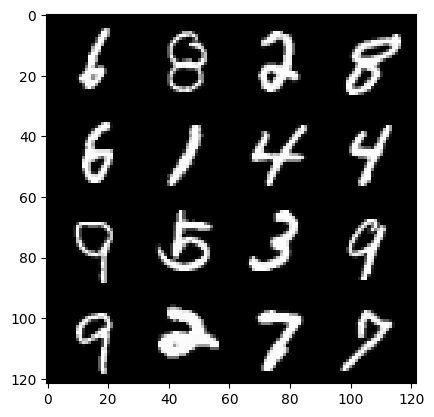

45: step 40800 / Gen loss: 2.5470246330897 / Disc loss: 0.22113404537240672


  0%|          | 0/469 [00:00<?, ?it/s]

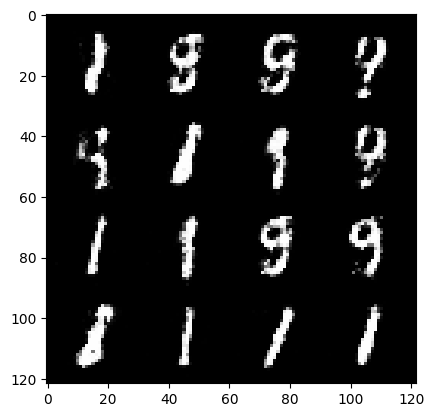

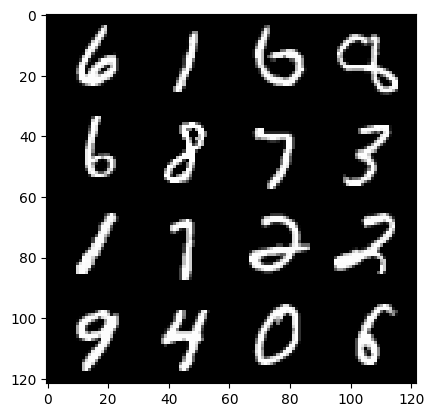

46: step 41100 / Gen loss: 2.52590475320816 / Disc loss: 0.23836408942937845


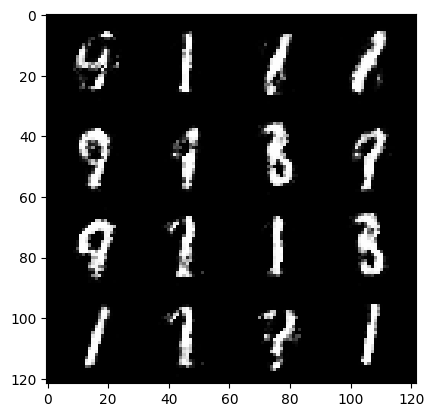

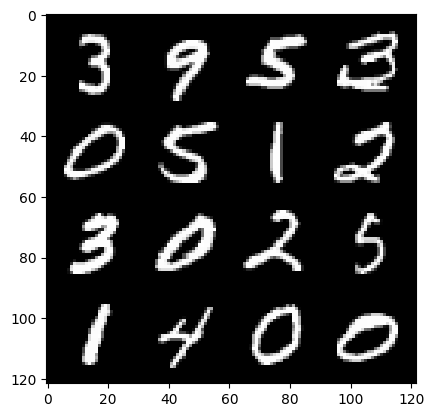

46: step 41400 / Gen loss: 2.4385331439971925 / Disc loss: 0.25531729161739347


  0%|          | 0/469 [00:00<?, ?it/s]

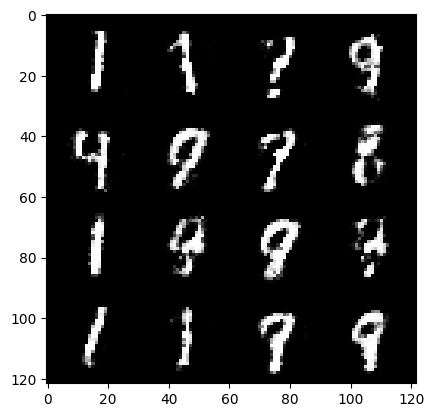

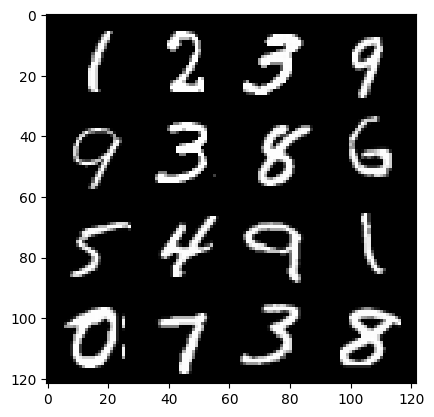

47: step 41700 / Gen loss: 2.5035088833173114 / Disc loss: 0.2246075388789176


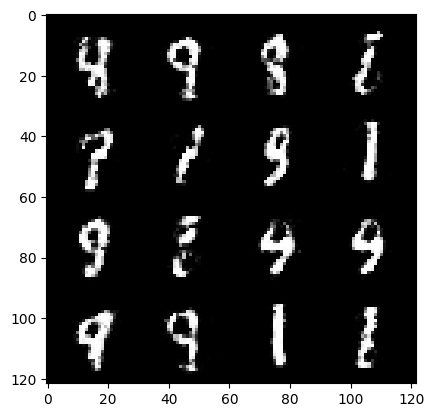

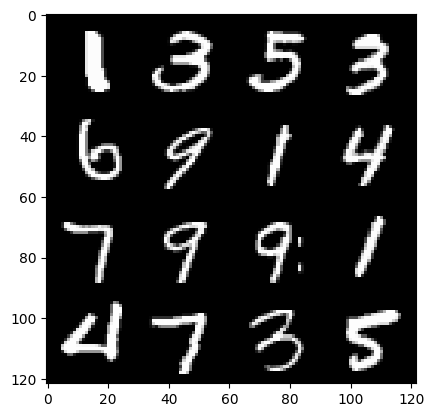

47: step 42000 / Gen loss: 2.4226472727457686 / Disc loss: 0.2294610391308863


  0%|          | 0/469 [00:00<?, ?it/s]

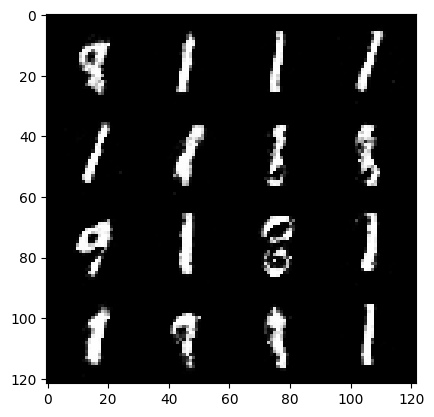

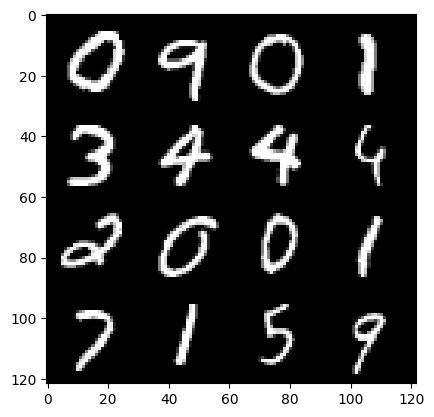

48: step 42300 / Gen loss: 2.4316631984710697 / Disc loss: 0.23697158023715015


  0%|          | 0/469 [00:00<?, ?it/s]

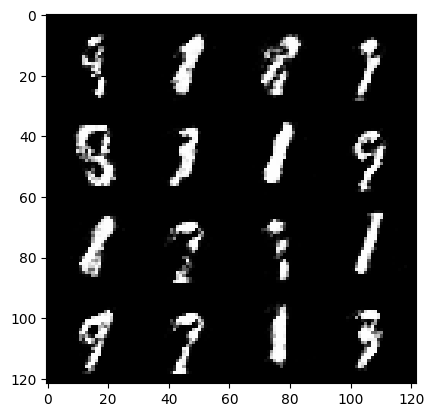

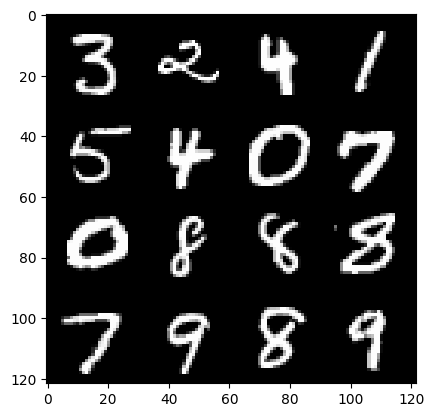

49: step 42600 / Gen loss: 2.3440234029293068 / Disc loss: 0.24559703076879189


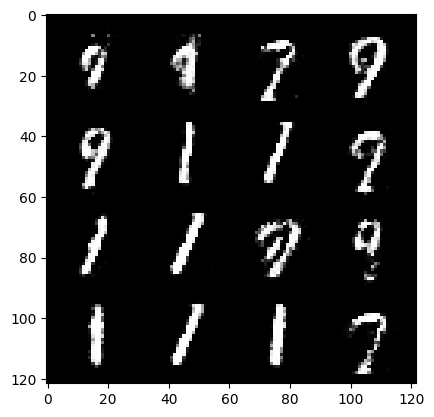

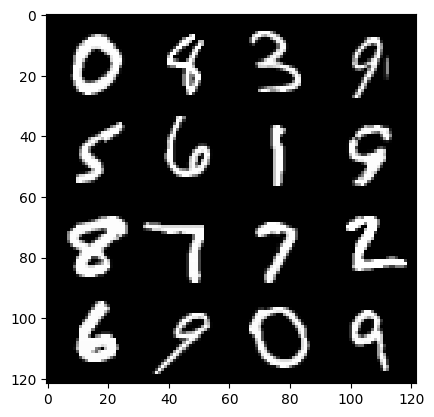

49: step 42900 / Gen loss: 2.3888388895988486 / Disc loss: 0.23246546030044538


  0%|          | 0/469 [00:00<?, ?it/s]

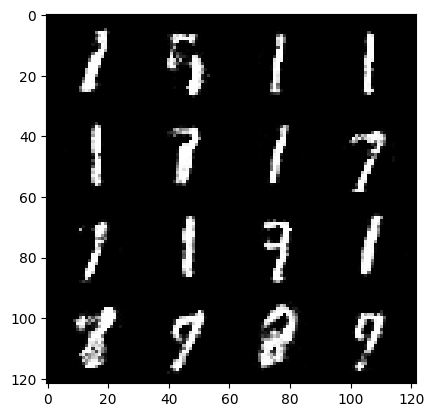

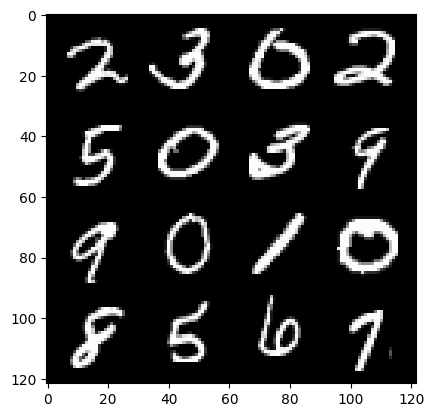

50: step 43200 / Gen loss: 2.3847701334953317 / Disc loss: 0.24906070681909717


  0%|          | 0/469 [00:00<?, ?it/s]

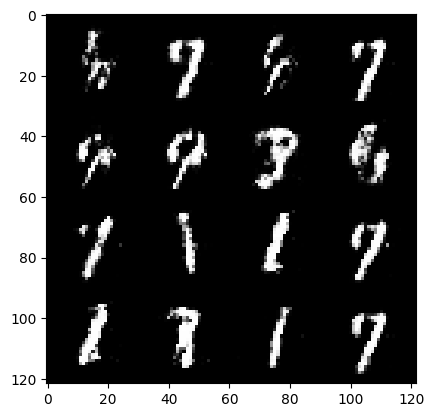

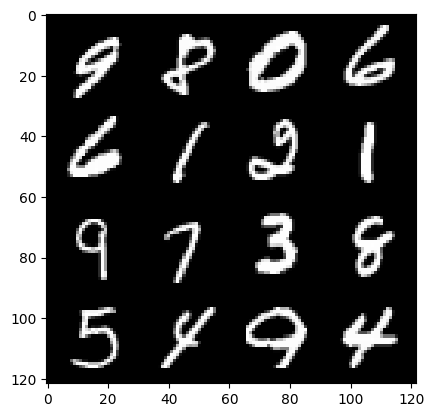

51: step 43500 / Gen loss: 2.3565626494089753 / Disc loss: 0.2516688039898874


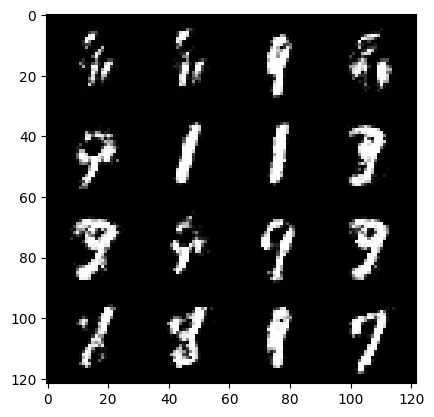

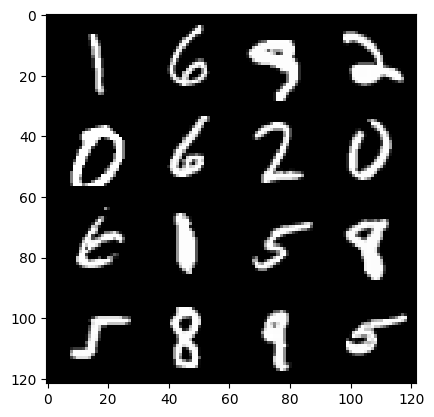

51: step 43800 / Gen loss: 2.4639867337544747 / Disc loss: 0.21910572469234482


  0%|          | 0/469 [00:00<?, ?it/s]

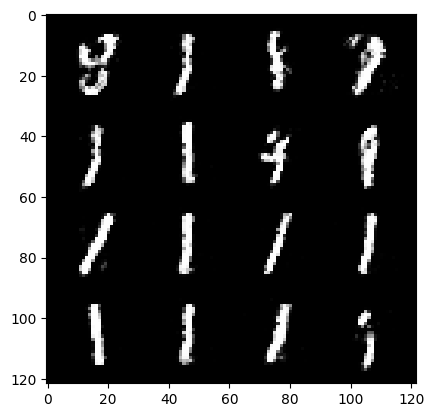

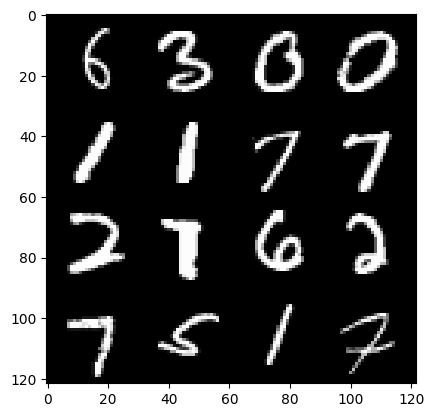

52: step 44100 / Gen loss: 2.418395989735921 / Disc loss: 0.24013909533619884


  0%|          | 0/469 [00:00<?, ?it/s]

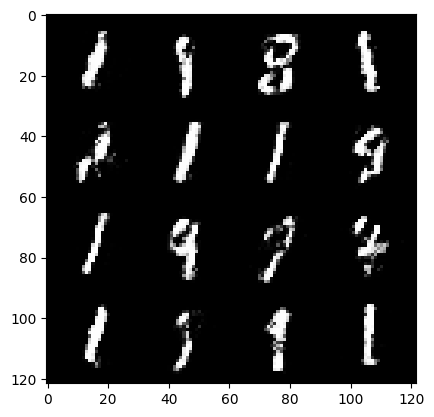

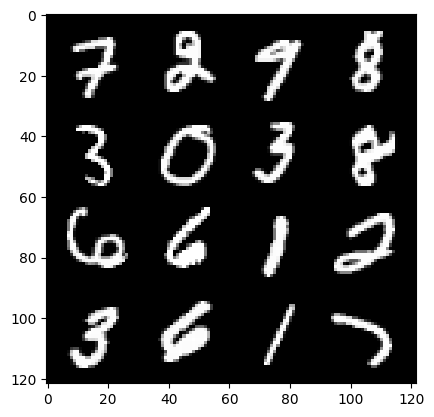

53: step 44400 / Gen loss: 2.326914480527242 / Disc loss: 0.244887038220962


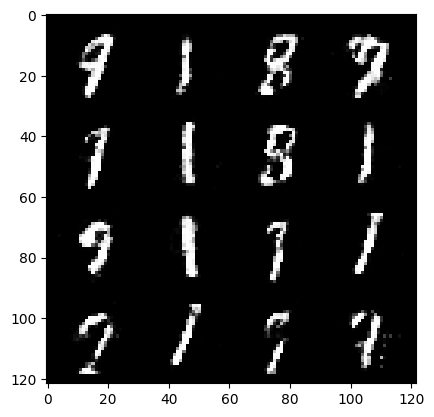

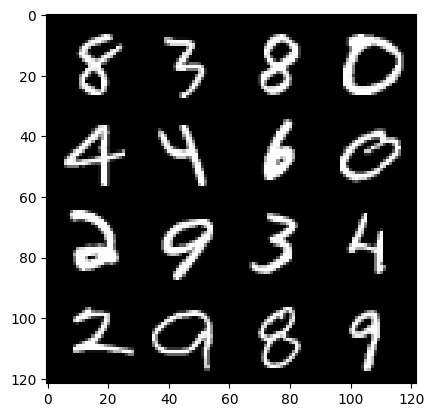

53: step 44700 / Gen loss: 2.323899035056432 / Disc loss: 0.24889239609241467


  0%|          | 0/469 [00:00<?, ?it/s]

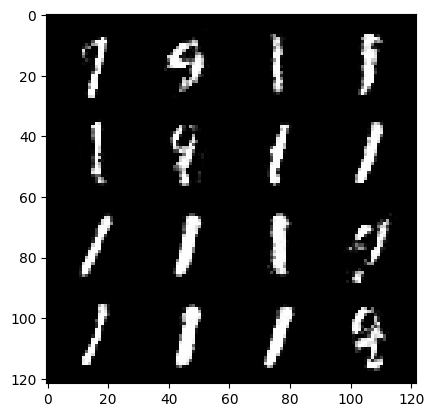

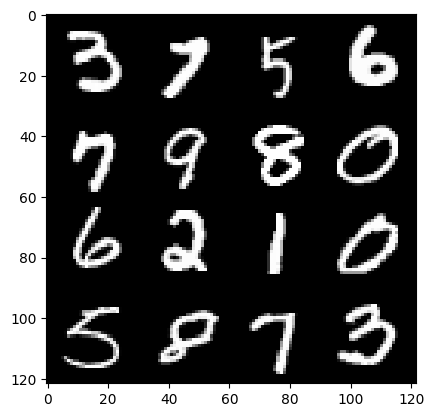

54: step 45000 / Gen loss: 2.3178171885013583 / Disc loss: 0.24190690904855736


  0%|          | 0/469 [00:00<?, ?it/s]

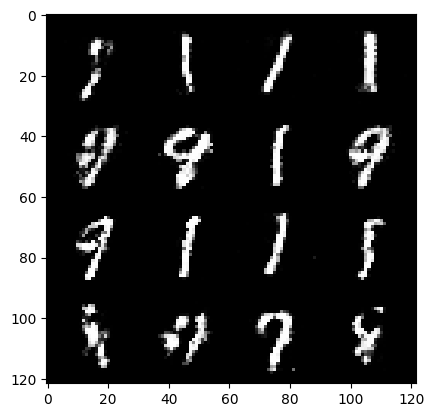

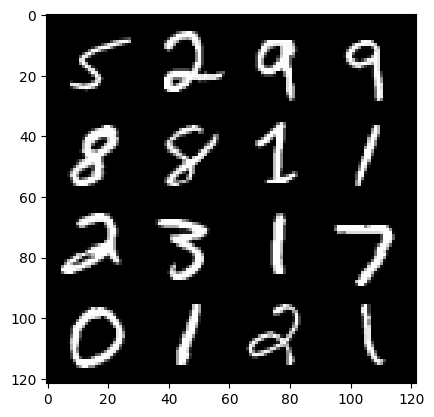

55: step 45300 / Gen loss: 2.289953386386235 / Disc loss: 0.2519537469247978


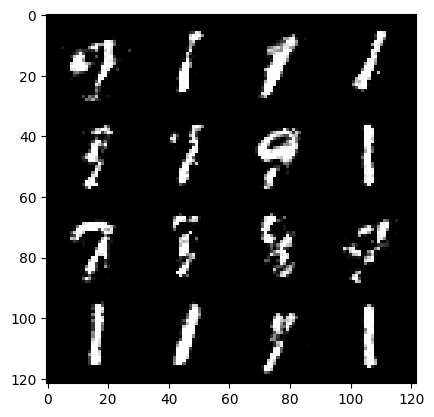

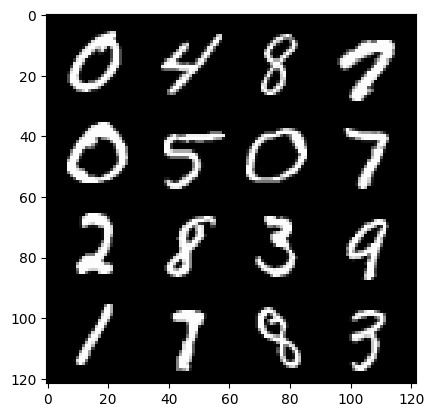

55: step 45600 / Gen loss: 2.3232651396592456 / Disc loss: 0.24393355314930285


  0%|          | 0/469 [00:00<?, ?it/s]

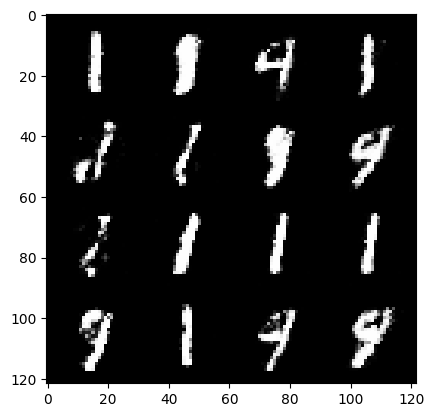

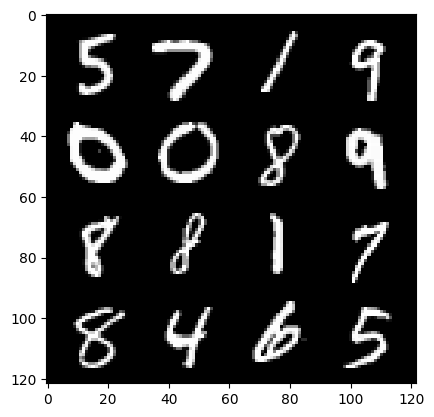

56: step 45900 / Gen loss: 2.310841301282247 / Disc loss: 0.2466969684759775


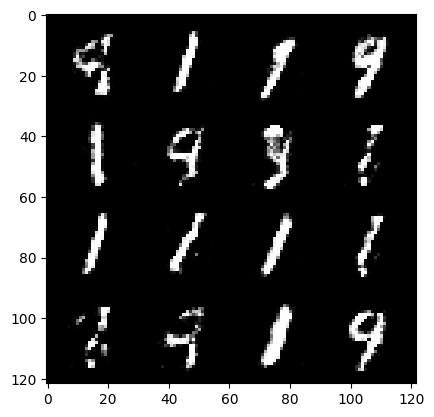

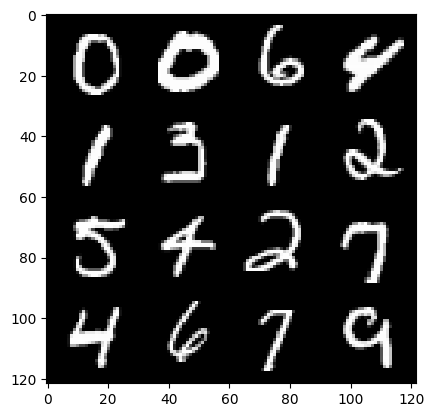

56: step 46200 / Gen loss: 2.2207824230194104 / Disc loss: 0.2650814183056354


  0%|          | 0/469 [00:00<?, ?it/s]

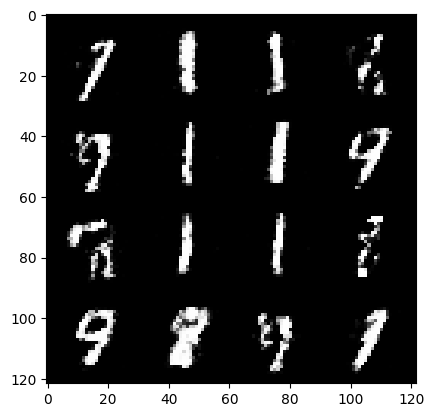

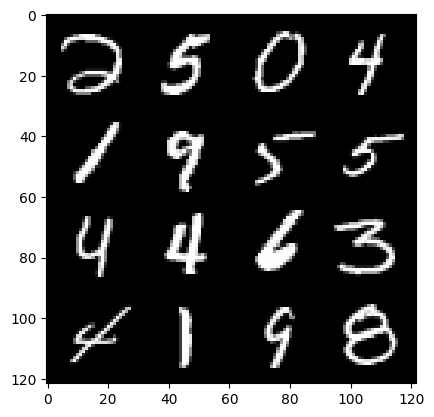

57: step 46500 / Gen loss: 2.26164649128914 / Disc loss: 0.25769279718399035


  0%|          | 0/469 [00:00<?, ?it/s]

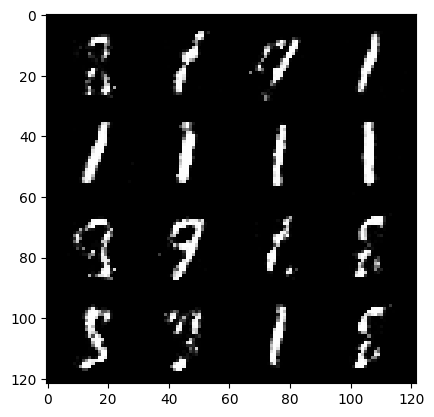

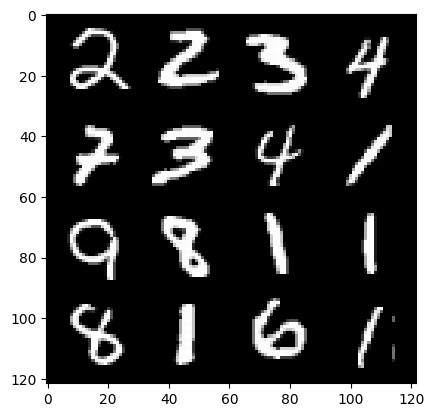

58: step 46800 / Gen loss: 2.2158466176191958 / Disc loss: 0.25383328214287765


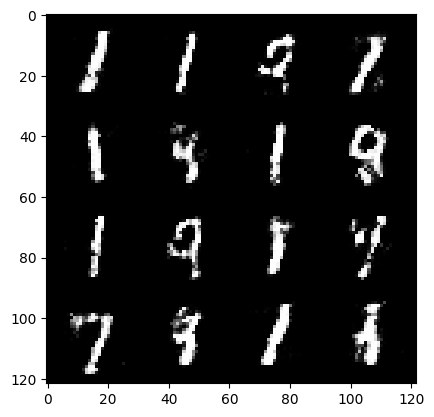

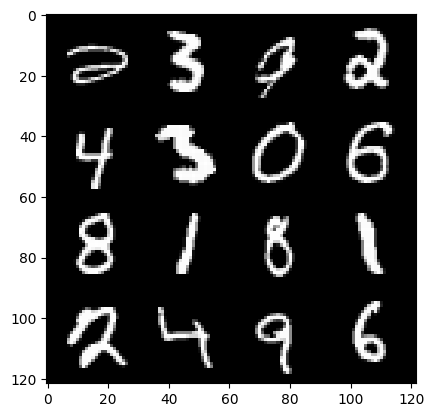

58: step 47100 / Gen loss: 2.188813885450362 / Disc loss: 0.2582209119697412


  0%|          | 0/469 [00:00<?, ?it/s]

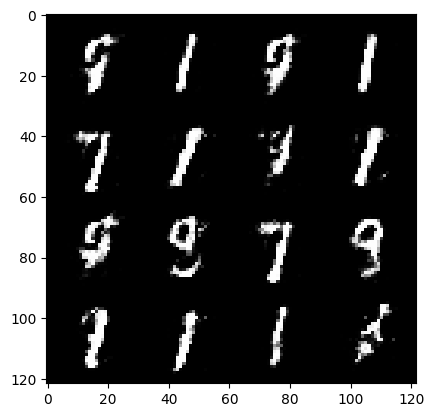

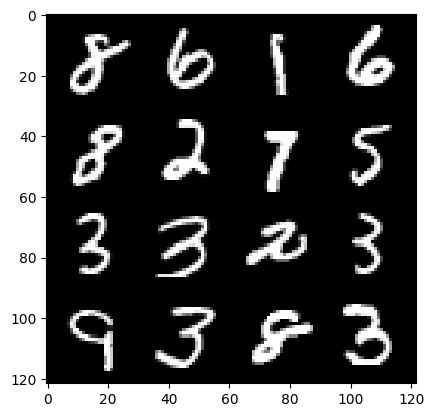

59: step 47400 / Gen loss: 2.22579527457555 / Disc loss: 0.25312084237734467


  0%|          | 0/469 [00:00<?, ?it/s]

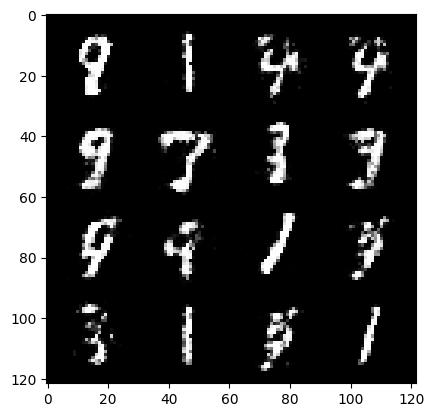

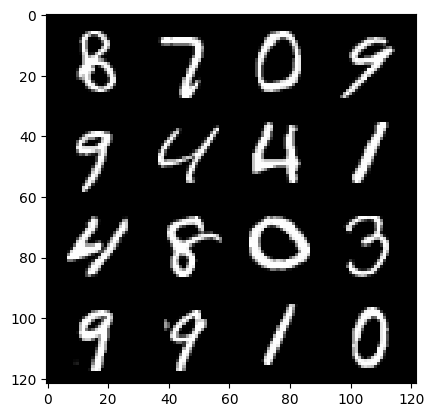

60: step 47700 / Gen loss: 2.267859271764755 / Disc loss: 0.2543524457514285


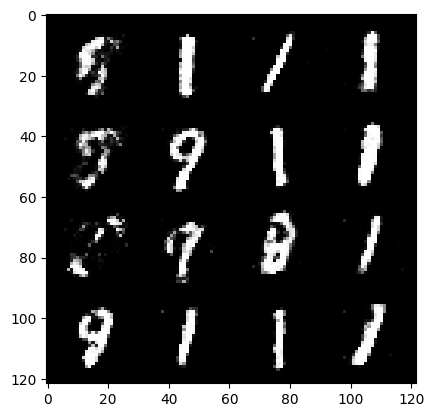

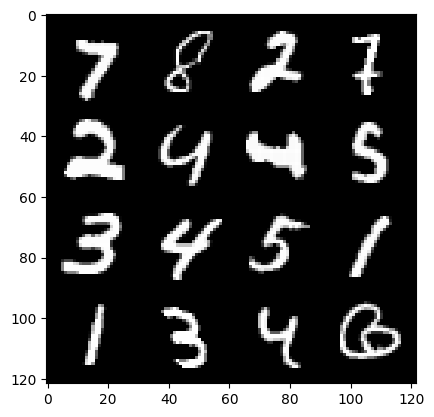

60: step 48000 / Gen loss: 2.185627553065618 / Disc loss: 0.2888678993284702


  0%|          | 0/469 [00:00<?, ?it/s]

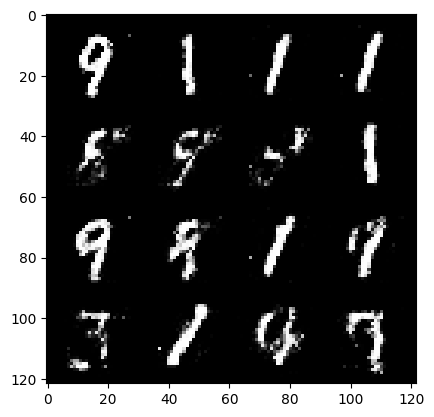

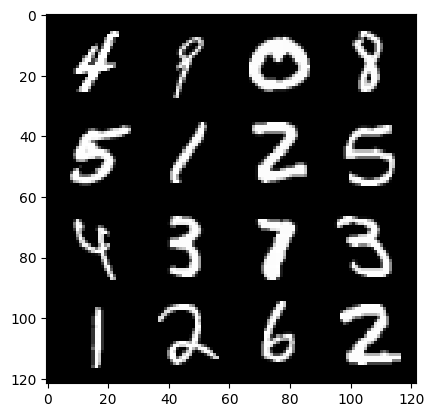

61: step 48300 / Gen loss: 2.052477369705835 / Disc loss: 0.2983353223899999


  0%|          | 0/469 [00:00<?, ?it/s]

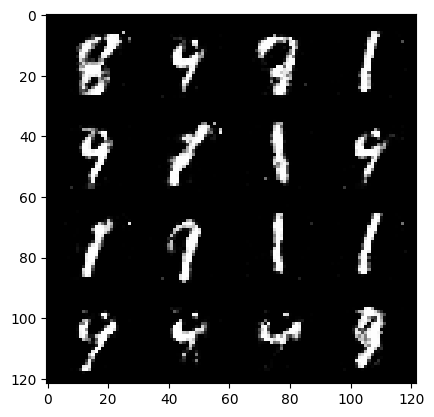

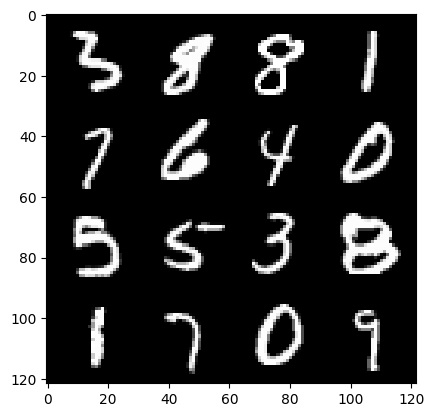

62: step 48600 / Gen loss: 2.189467246929804 / Disc loss: 0.2673123383522033


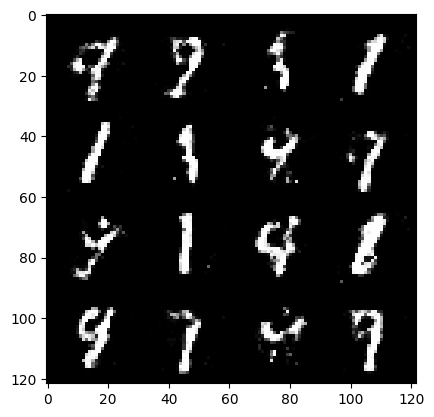

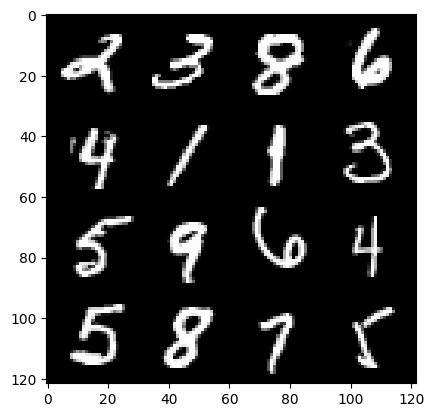

62: step 48900 / Gen loss: 2.133319488763807 / Disc loss: 0.25734260862072333


  0%|          | 0/469 [00:00<?, ?it/s]

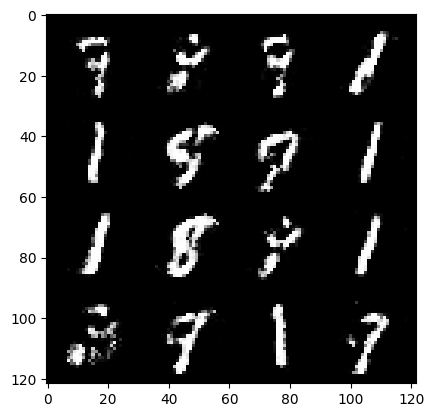

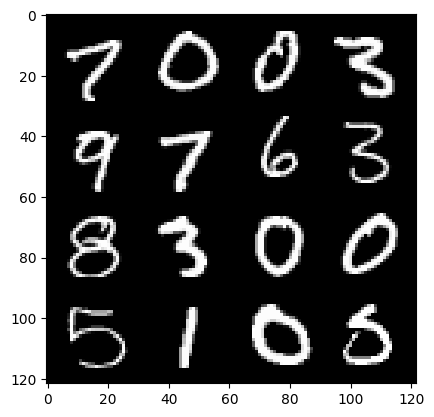

63: step 49200 / Gen loss: 2.2122350966930395 / Disc loss: 0.2689322972297668


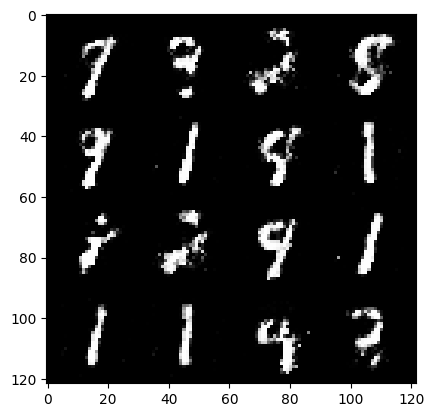

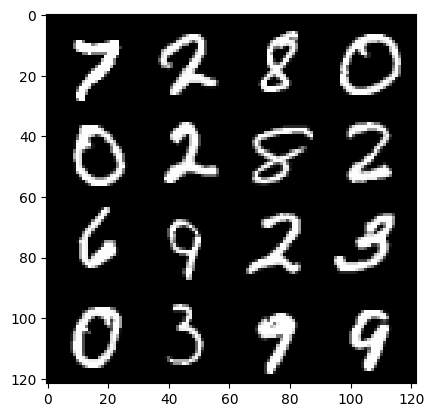

63: step 49500 / Gen loss: 2.22079567035039 / Disc loss: 0.24730755880475042


  0%|          | 0/469 [00:00<?, ?it/s]

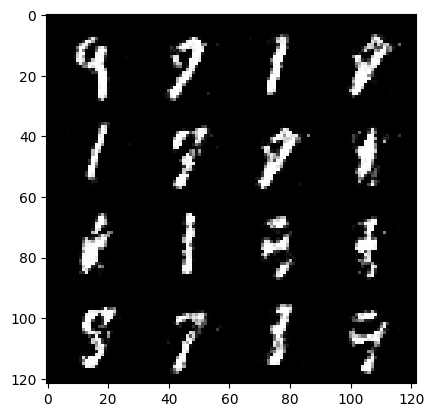

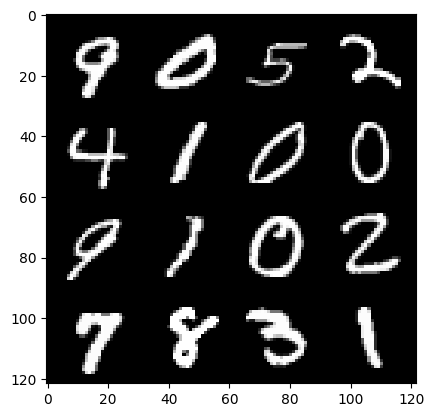

64: step 49800 / Gen loss: 2.3683197212219236 / Disc loss: 0.23500448519984882


  0%|          | 0/469 [00:00<?, ?it/s]

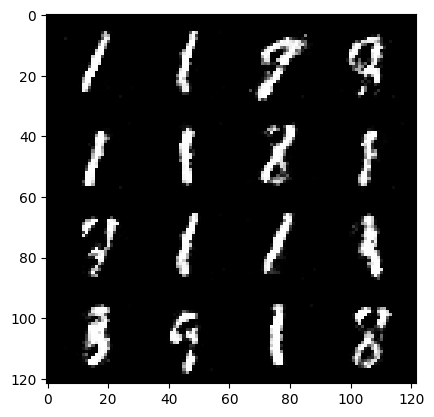

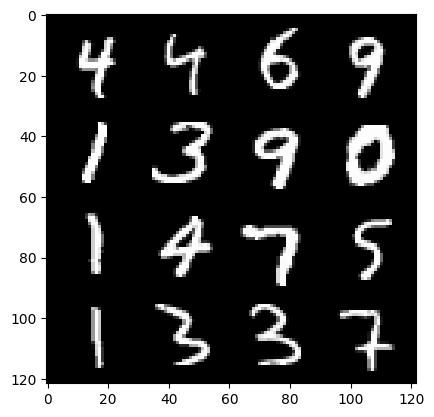

65: step 50100 / Gen loss: 2.126104596853256 / Disc loss: 0.2751836943626404


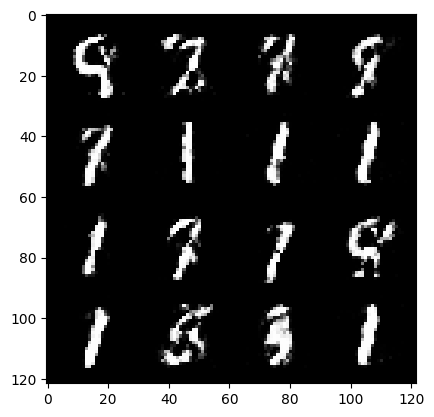

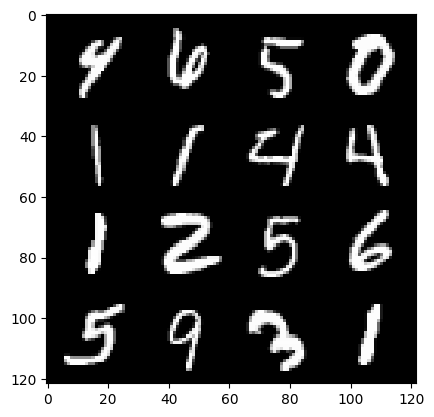

65: step 50400 / Gen loss: 2.199400390386583 / Disc loss: 0.2623934290806452


  0%|          | 0/469 [00:00<?, ?it/s]

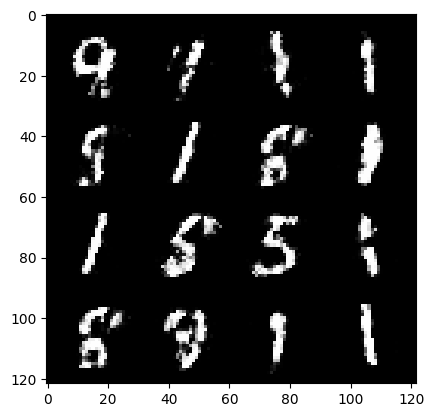

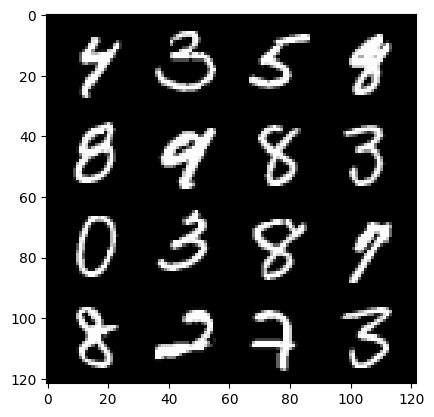

66: step 50700 / Gen loss: 2.203147097826005 / Disc loss: 0.25818844427665066


  0%|          | 0/469 [00:00<?, ?it/s]

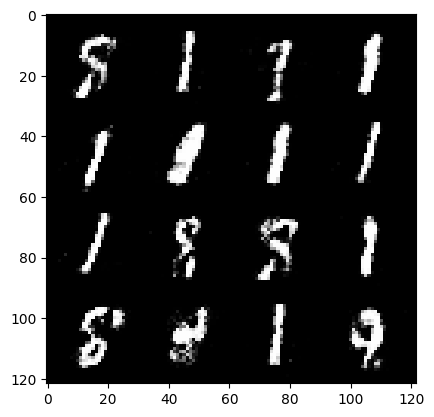

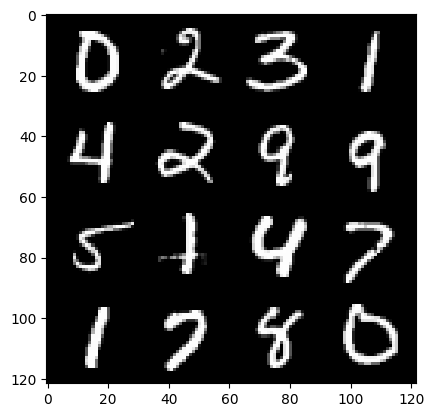

67: step 51000 / Gen loss: 2.1129539104302717 / Disc loss: 0.27385840316613486


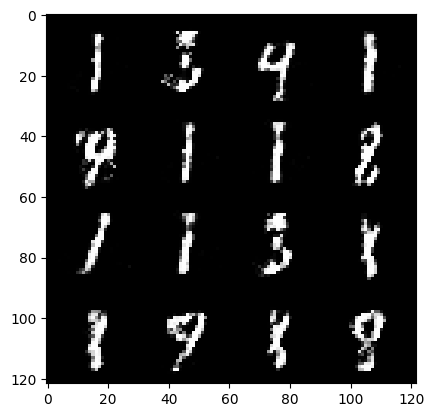

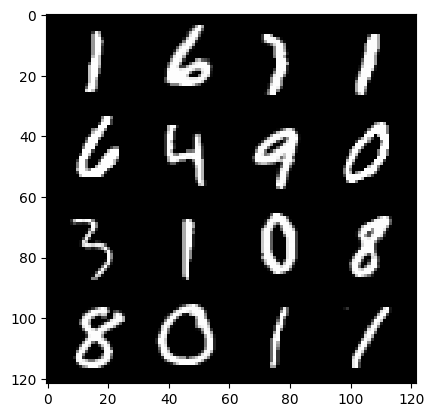

67: step 51300 / Gen loss: 1.996324251890183 / Disc loss: 0.29132957294583317


  0%|          | 0/469 [00:00<?, ?it/s]

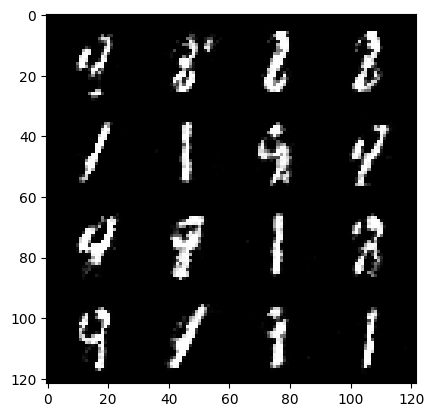

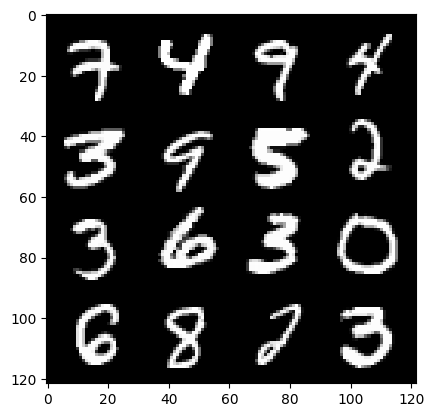

68: step 51600 / Gen loss: 2.0591820903619156 / Disc loss: 0.27380127474665655


  0%|          | 0/469 [00:00<?, ?it/s]

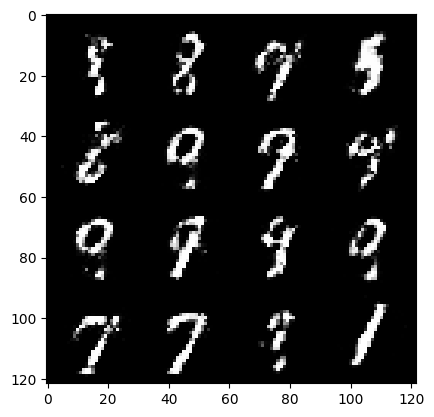

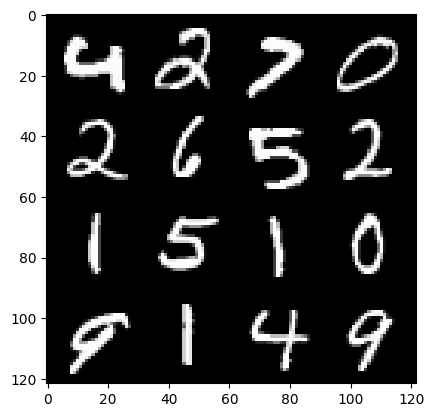

69: step 51900 / Gen loss: 1.9956767694155366 / Disc loss: 0.28345173617204045


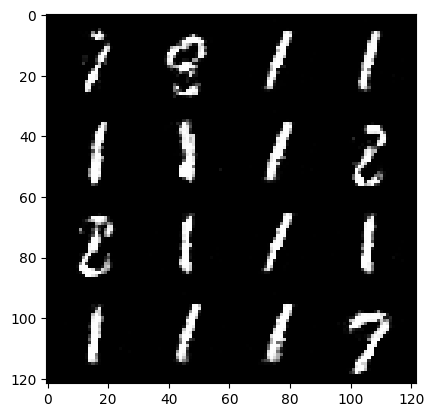

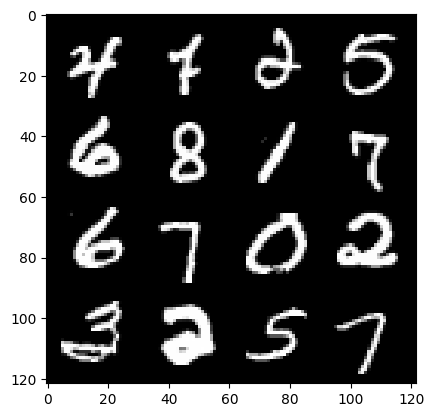

69: step 52200 / Gen loss: 2.044220951000851 / Disc loss: 0.2836189068357149


  0%|          | 0/469 [00:00<?, ?it/s]

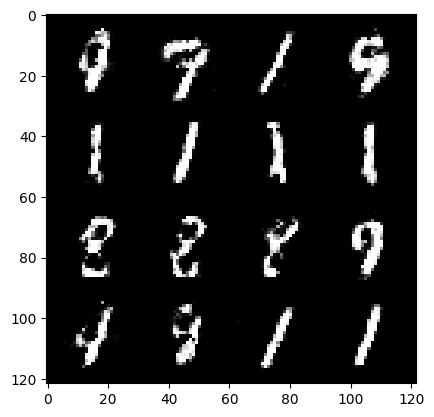

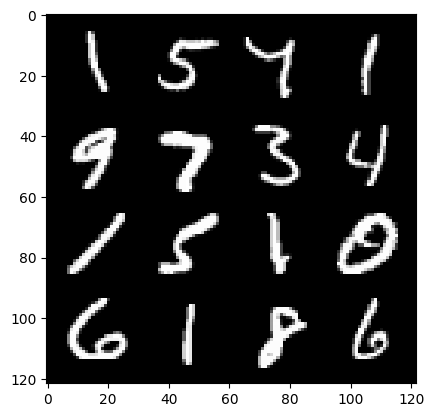

70: step 52500 / Gen loss: 2.053382974068323 / Disc loss: 0.27189343790213266


  0%|          | 0/469 [00:00<?, ?it/s]

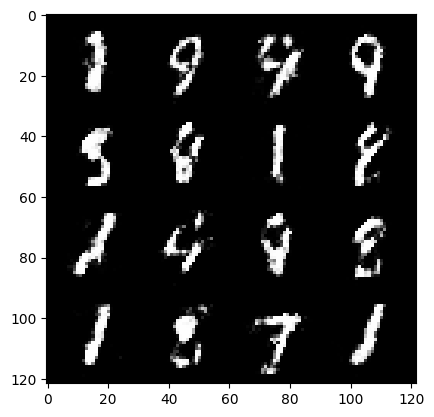

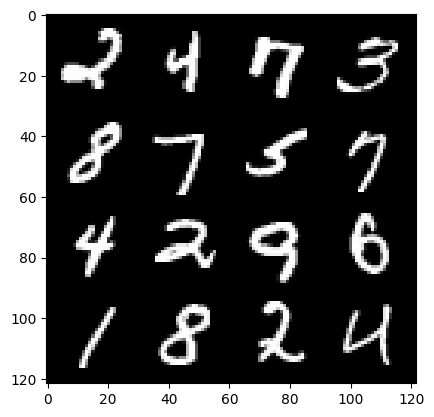

71: step 52800 / Gen loss: 2.0823692345619174 / Disc loss: 0.2712271260221798


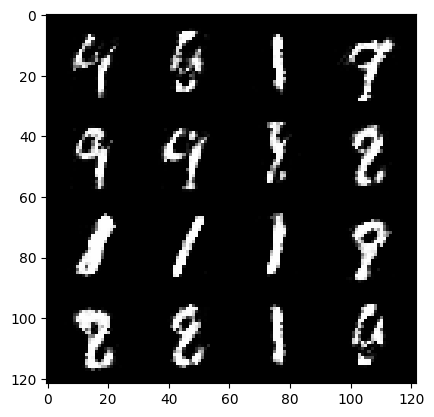

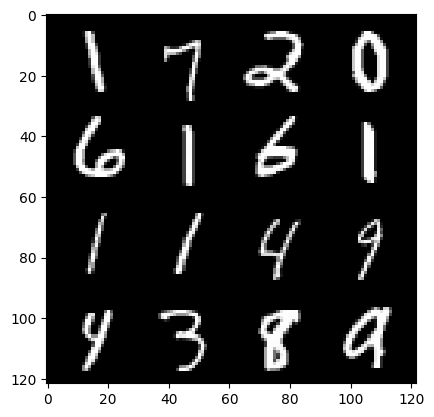

71: step 53100 / Gen loss: 2.1060178705056494 / Disc loss: 0.2758528914550939


  0%|          | 0/469 [00:00<?, ?it/s]

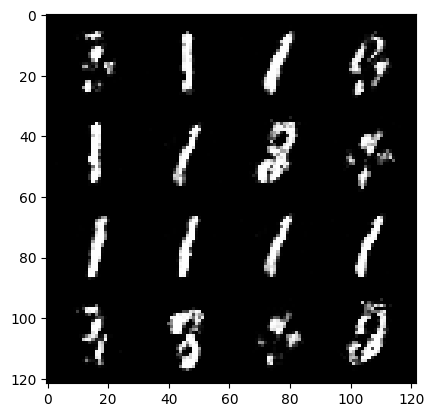

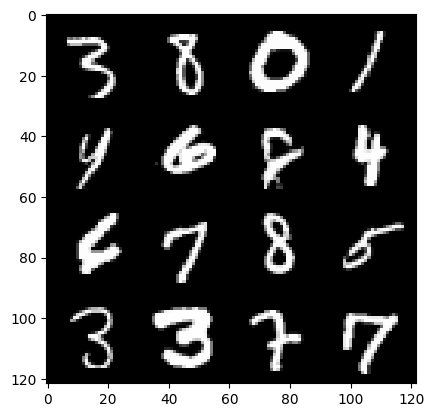

72: step 53400 / Gen loss: 2.0215942819913217 / Disc loss: 0.3034904293715953


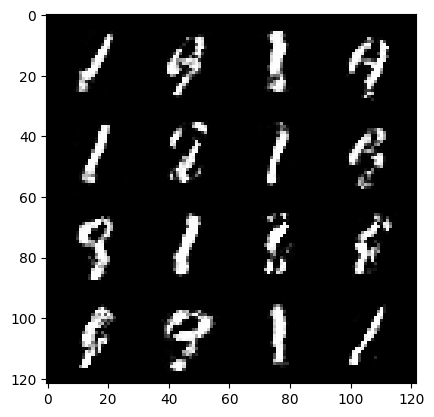

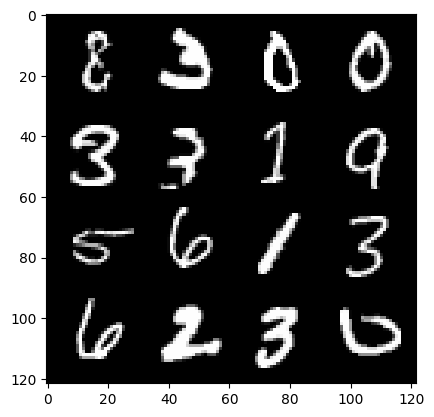

72: step 53700 / Gen loss: 2.033593530654907 / Disc loss: 0.27890950952967003


  0%|          | 0/469 [00:00<?, ?it/s]

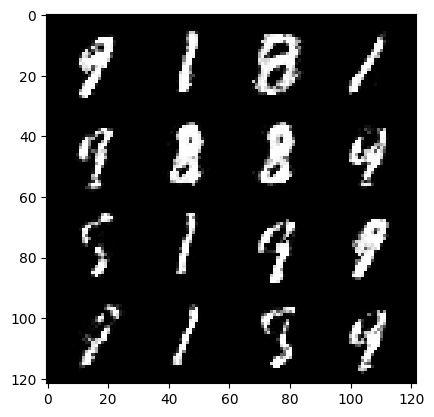

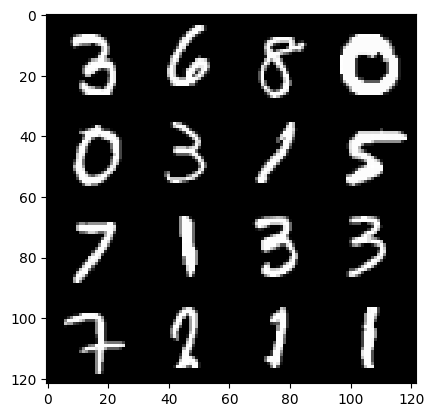

73: step 54000 / Gen loss: 2.024664769967395 / Disc loss: 0.28834620510538395


  0%|          | 0/469 [00:00<?, ?it/s]

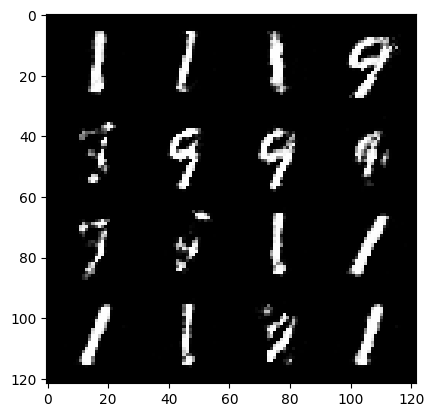

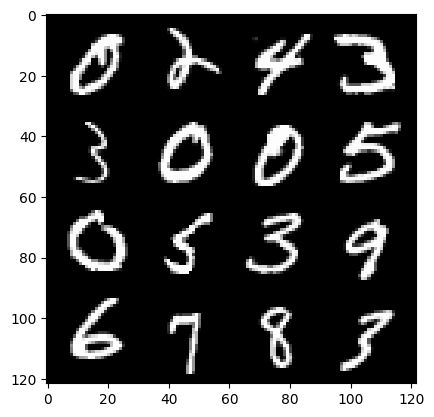

74: step 54300 / Gen loss: 1.924847333431244 / Disc loss: 0.29061936954657247


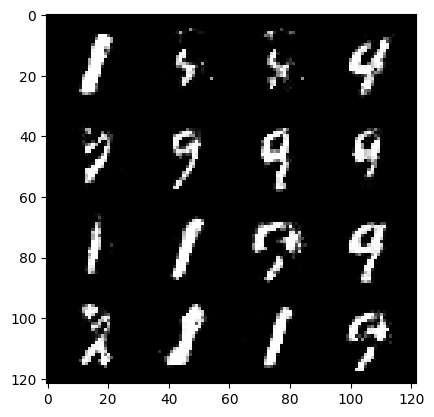

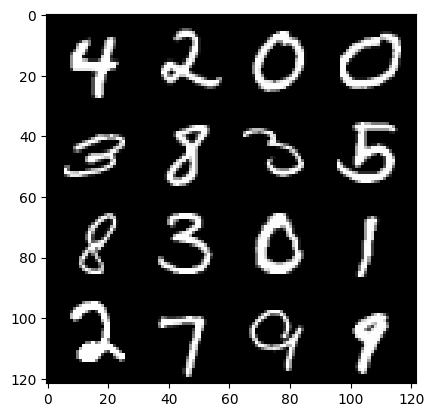

74: step 54600 / Gen loss: 1.944109899997712 / Disc loss: 0.29225847512483605


  0%|          | 0/469 [00:00<?, ?it/s]

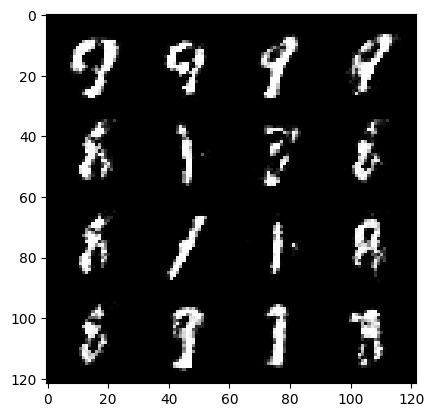

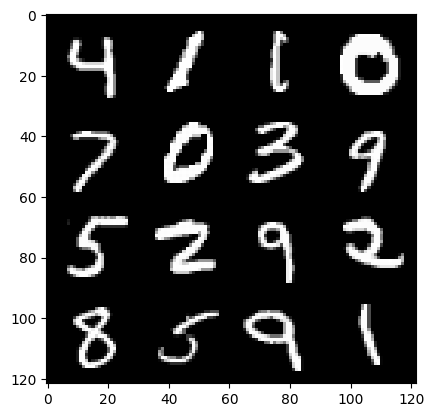

75: step 54900 / Gen loss: 1.9088967776298529 / Disc loss: 0.31143259505430854


  0%|          | 0/469 [00:00<?, ?it/s]

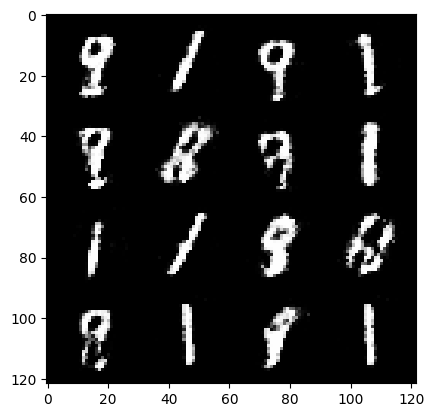

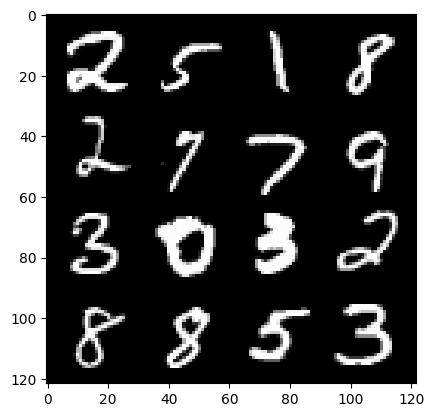

76: step 55200 / Gen loss: 1.8462525248527535 / Disc loss: 0.3160721437633037


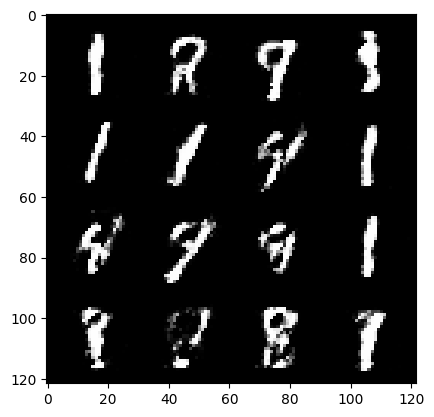

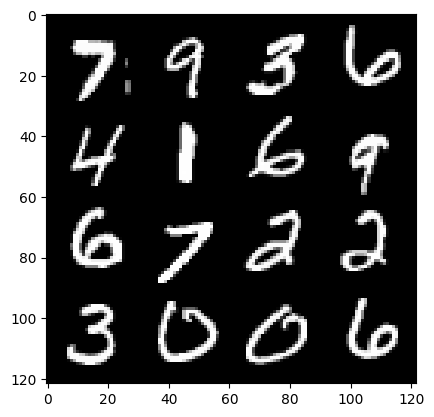

76: step 55500 / Gen loss: 1.882778098185858 / Disc loss: 0.3181719990571338


  0%|          | 0/469 [00:00<?, ?it/s]

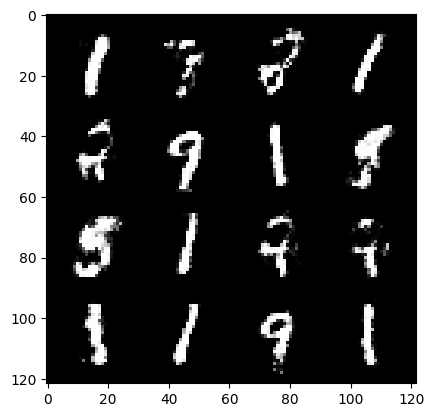

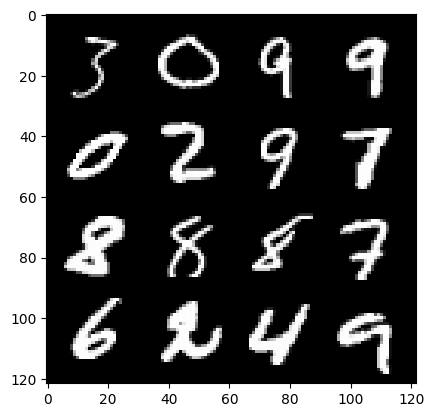

77: step 55800 / Gen loss: 1.8324106975396472 / Disc loss: 0.3221712935964266


  0%|          | 0/469 [00:00<?, ?it/s]

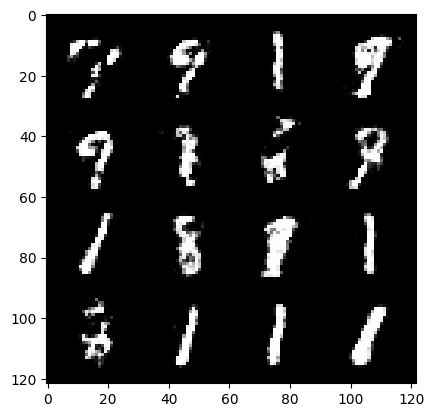

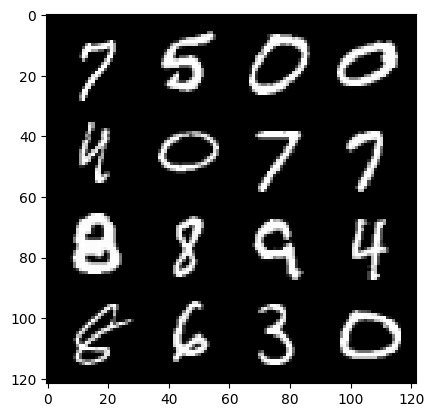

78: step 56100 / Gen loss: 1.9298165063063293 / Disc loss: 0.2993283143639564


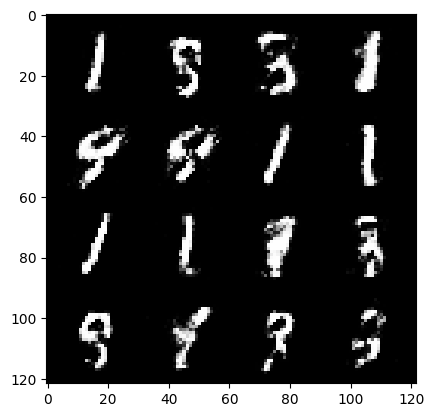

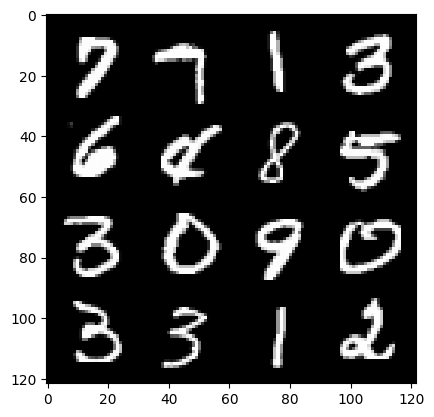

78: step 56400 / Gen loss: 1.9807785582542428 / Disc loss: 0.29167022277911503


  0%|          | 0/469 [00:00<?, ?it/s]

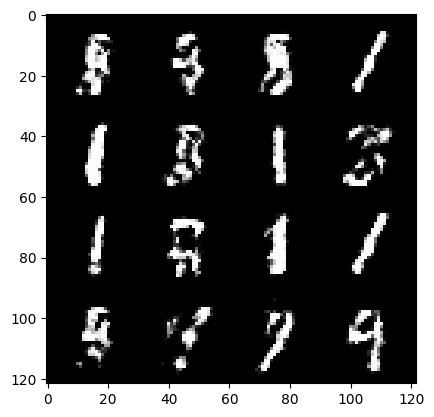

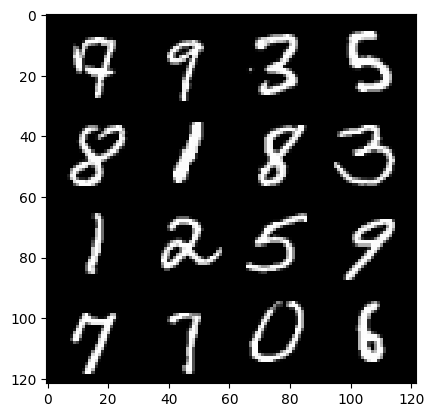

79: step 56700 / Gen loss: 1.861194779078165 / Disc loss: 0.31698141177495315


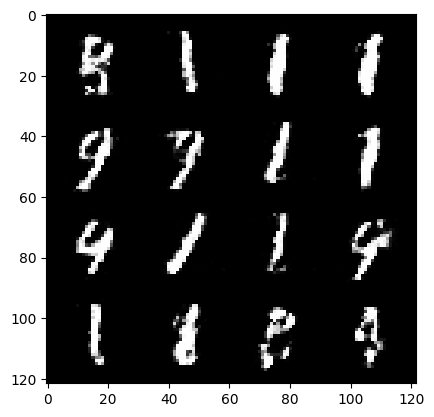

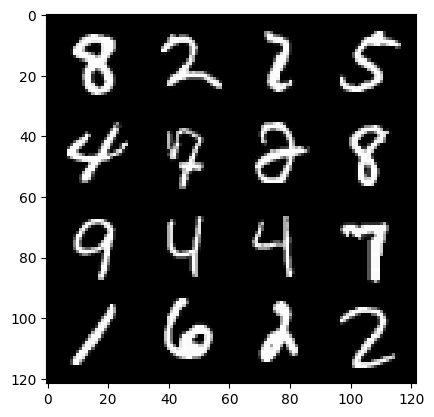

79: step 57000 / Gen loss: 1.8243405342102055 / Disc loss: 0.3213083753486473


  0%|          | 0/469 [00:00<?, ?it/s]

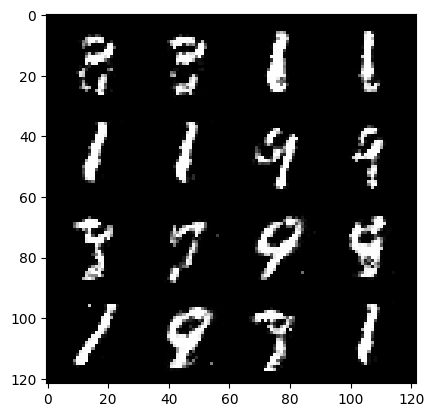

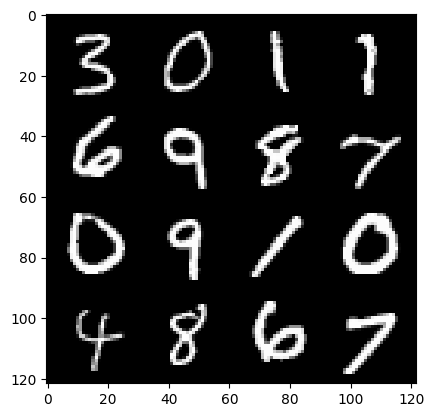

80: step 57300 / Gen loss: 1.8909740114212035 / Disc loss: 0.30182392562429133


  0%|          | 0/469 [00:00<?, ?it/s]

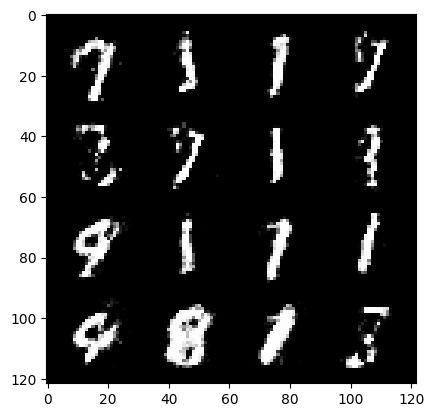

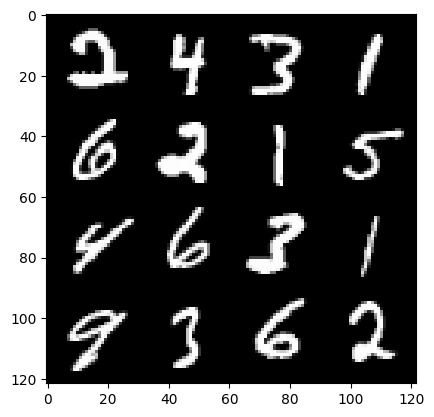

81: step 57600 / Gen loss: 1.8890646560986837 / Disc loss: 0.3099195509155591


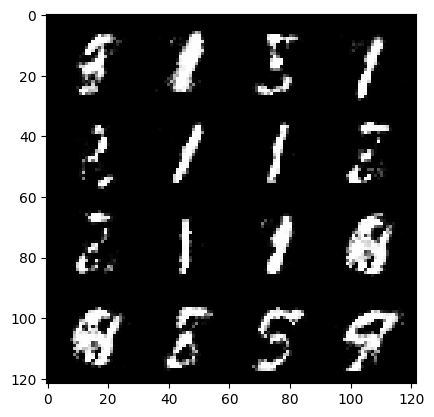

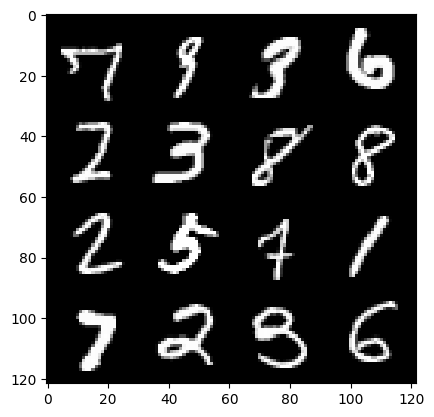

81: step 57900 / Gen loss: 1.8320500747362767 / Disc loss: 0.31196895182132717


  0%|          | 0/469 [00:00<?, ?it/s]

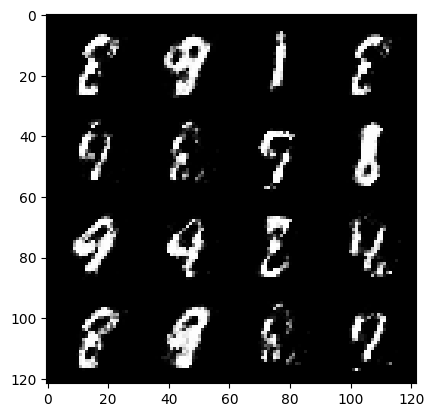

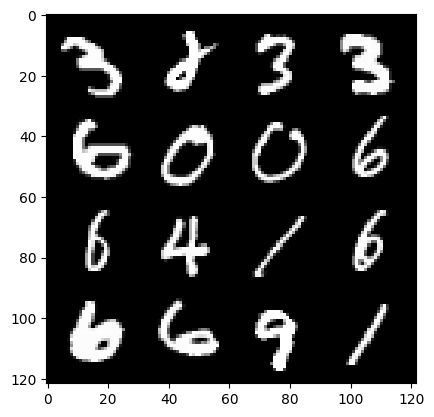

82: step 58200 / Gen loss: 1.9276031188170117 / Disc loss: 0.29920970181624096


  0%|          | 0/469 [00:00<?, ?it/s]

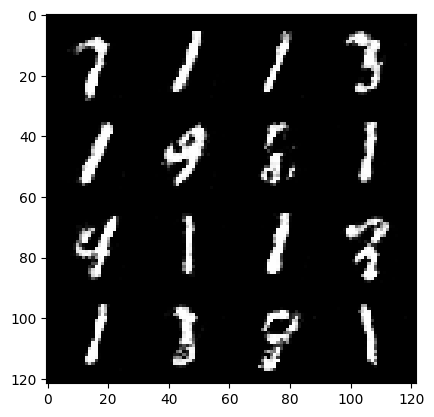

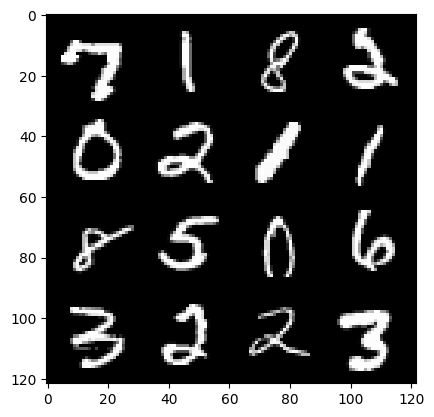

83: step 58500 / Gen loss: 1.9051336940129602 / Disc loss: 0.3041749705870946


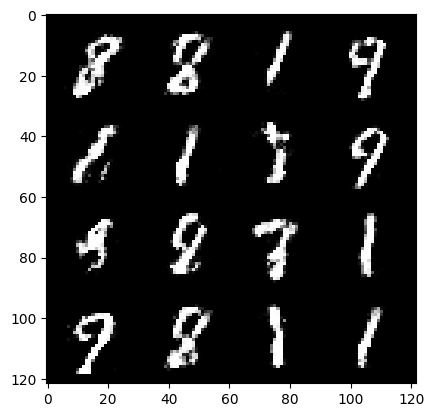

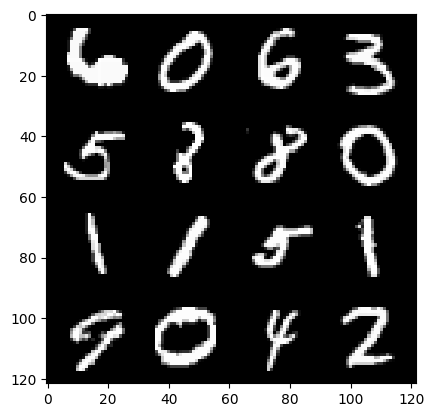

83: step 58800 / Gen loss: 1.8310117709636697 / Disc loss: 0.32372913296024


  0%|          | 0/469 [00:00<?, ?it/s]

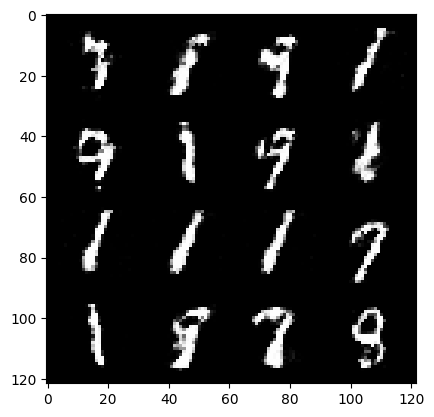

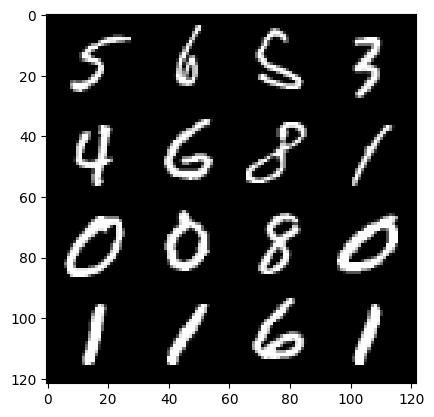

84: step 59100 / Gen loss: 1.9435521300633742 / Disc loss: 0.294466618647178


  0%|          | 0/469 [00:00<?, ?it/s]

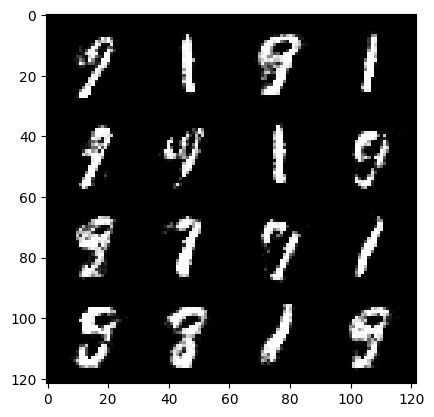

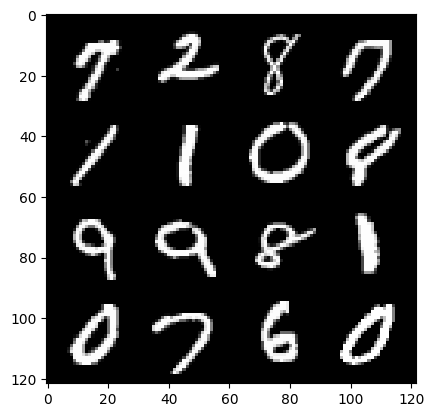

85: step 59400 / Gen loss: 1.9683084917068483 / Disc loss: 0.29482858493924147


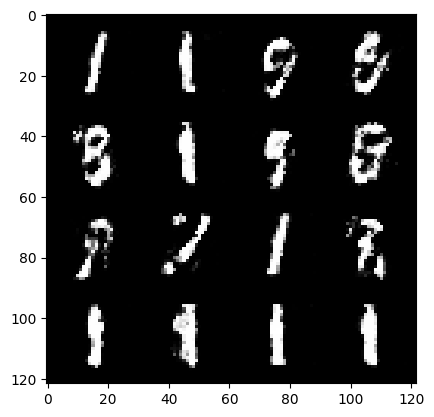

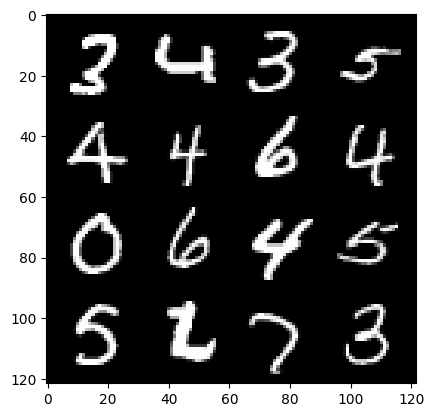

85: step 59700 / Gen loss: 1.9019805304209394 / Disc loss: 0.3053946284949779


  0%|          | 0/469 [00:00<?, ?it/s]

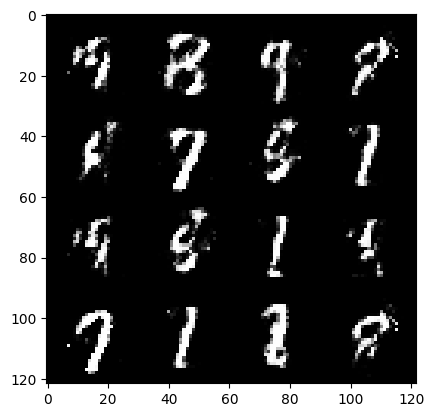

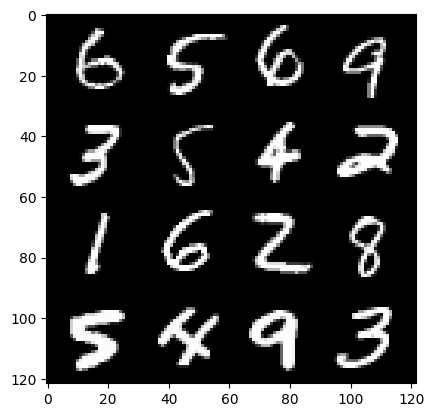

86: step 60000 / Gen loss: 1.9594953668117527 / Disc loss: 0.30919345706701296


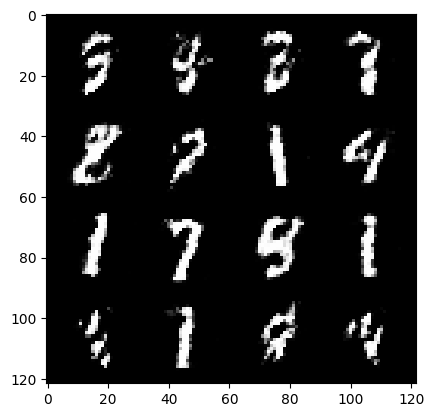

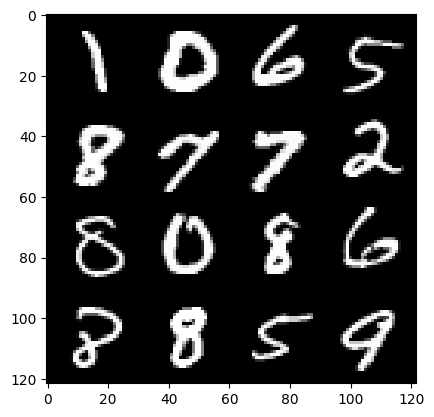

86: step 60300 / Gen loss: 1.8963752921422317 / Disc loss: 0.3020843780040741


  0%|          | 0/469 [00:00<?, ?it/s]

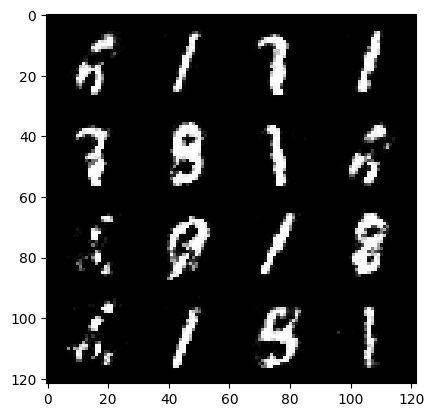

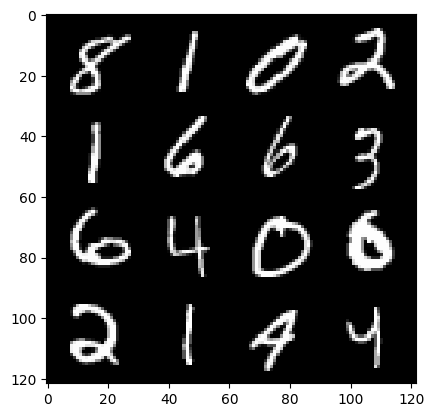

87: step 60600 / Gen loss: 1.854023038943609 / Disc loss: 0.30404173076152813


  0%|          | 0/469 [00:00<?, ?it/s]

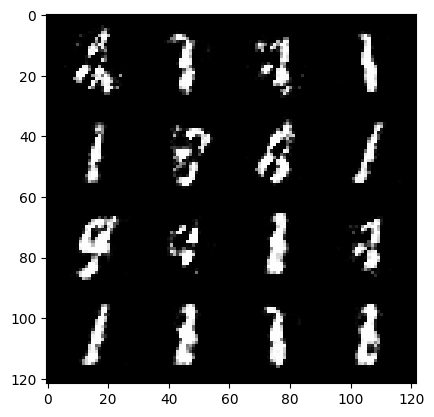

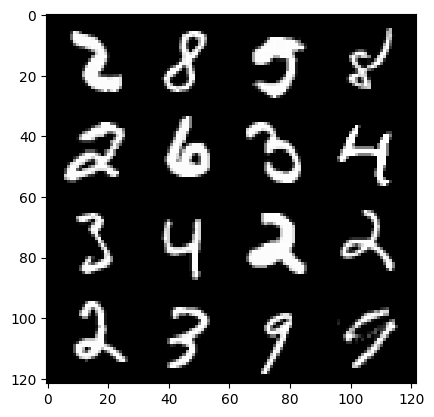

88: step 60900 / Gen loss: 1.859978331724804 / Disc loss: 0.3077638425429663


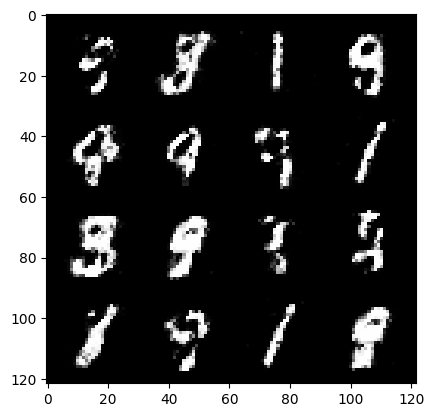

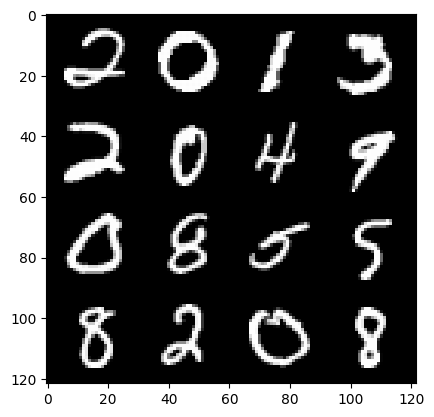

88: step 61200 / Gen loss: 1.8907827023665102 / Disc loss: 0.30104230294624956


  0%|          | 0/469 [00:00<?, ?it/s]

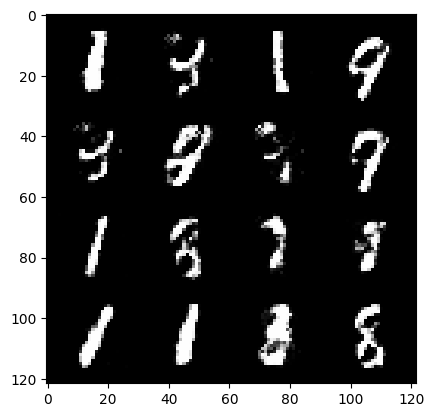

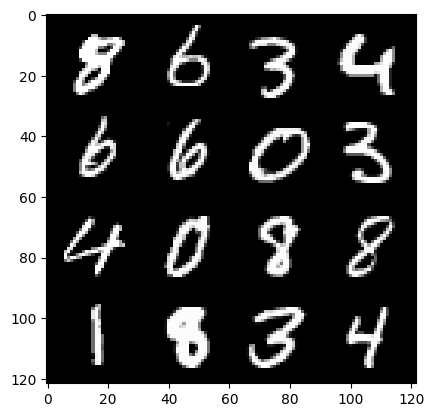

89: step 61500 / Gen loss: 1.840662210385004 / Disc loss: 0.314418888290723


  0%|          | 0/469 [00:00<?, ?it/s]

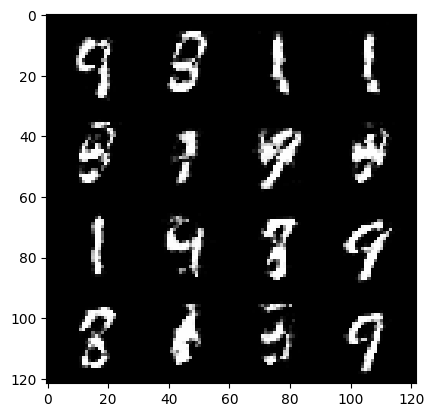

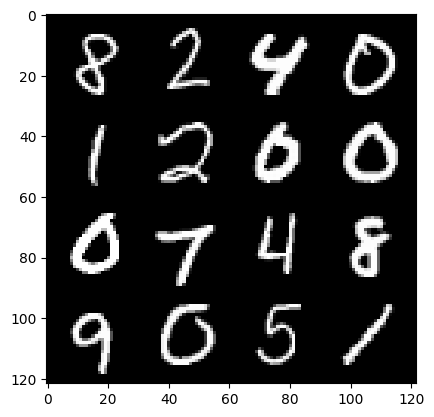

90: step 61800 / Gen loss: 1.7518485768636065 / Disc loss: 0.3312457463641961


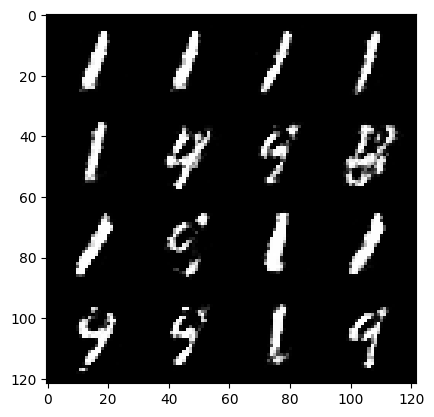

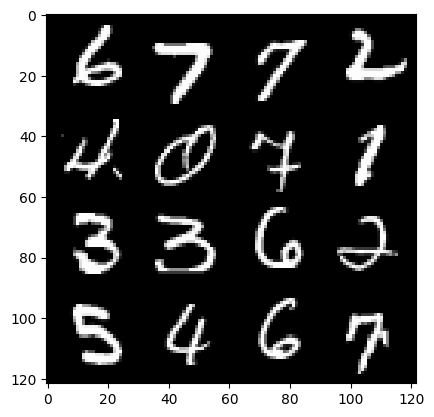

90: step 62100 / Gen loss: 1.769098519881564 / Disc loss: 0.31976692472894985


  0%|          | 0/469 [00:00<?, ?it/s]

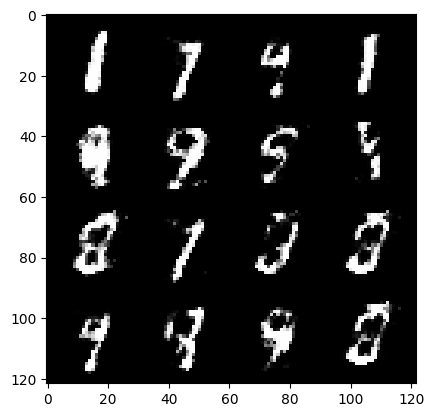

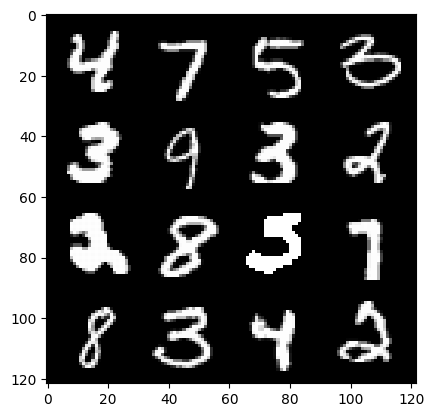

91: step 62400 / Gen loss: 1.8344519333044687 / Disc loss: 0.31399828876058244


  0%|          | 0/469 [00:00<?, ?it/s]

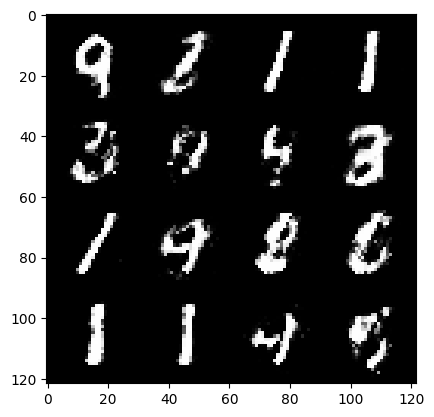

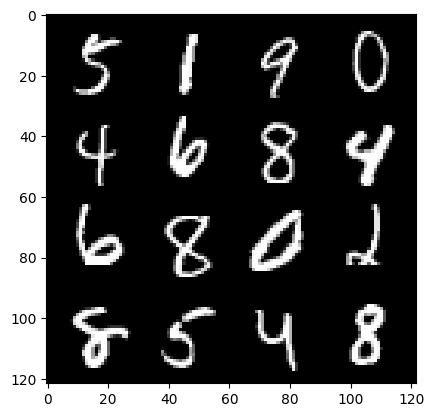

92: step 62700 / Gen loss: 1.8096199683348346 / Disc loss: 0.3337256159881752


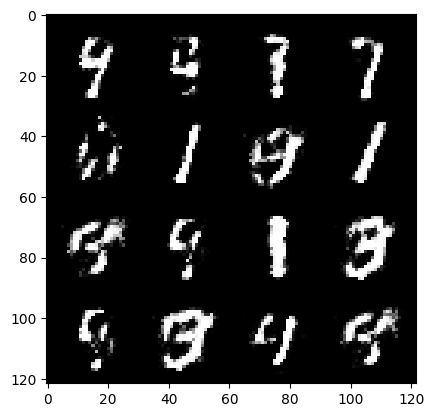

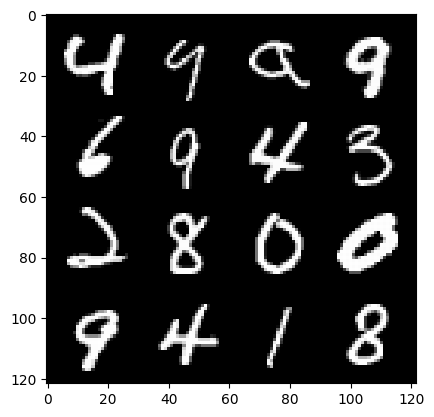

92: step 63000 / Gen loss: 1.7977452850341809 / Disc loss: 0.3257722956935566


  0%|          | 0/469 [00:00<?, ?it/s]

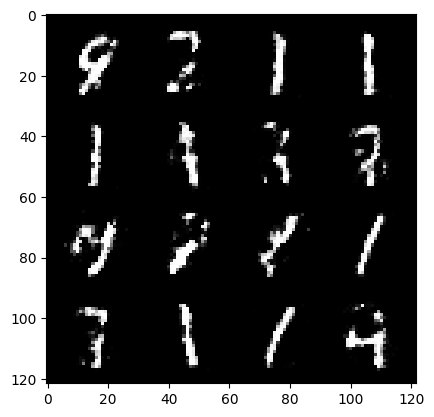

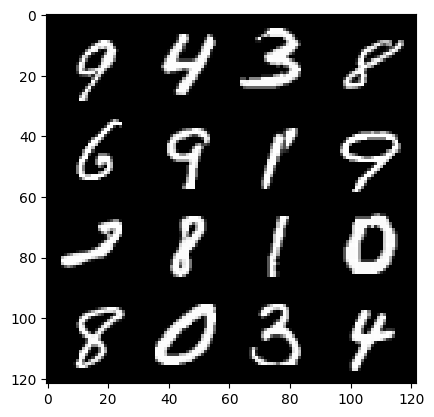

93: step 63300 / Gen loss: 1.810002133448919 / Disc loss: 0.31892018556594864


  0%|          | 0/469 [00:00<?, ?it/s]

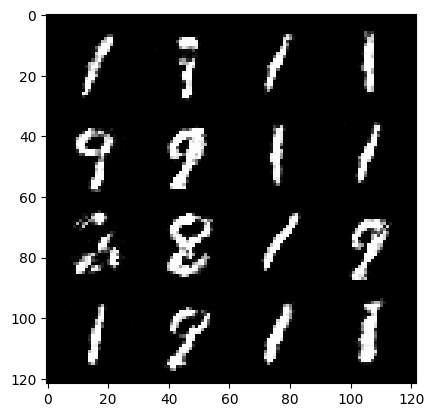

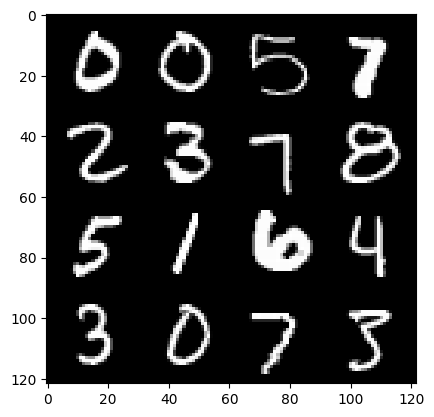

94: step 63600 / Gen loss: 1.8598433613777168 / Disc loss: 0.31009005437294646


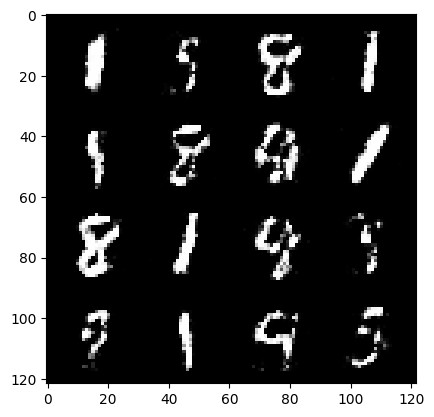

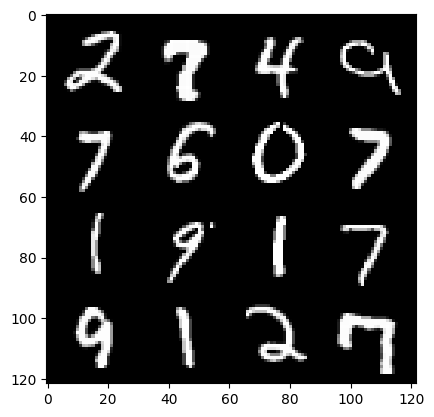

94: step 63900 / Gen loss: 1.7802419785658512 / Disc loss: 0.32436531151334447


  0%|          | 0/469 [00:00<?, ?it/s]

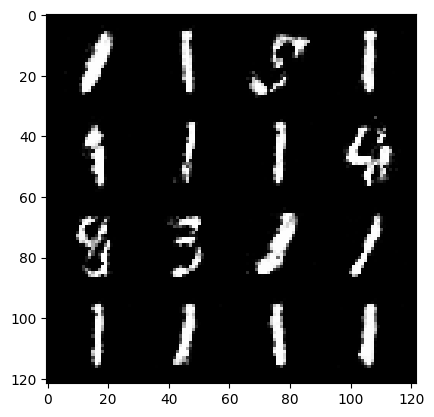

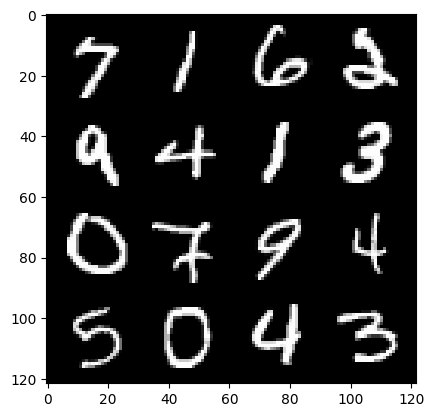

95: step 64200 / Gen loss: 1.8015337395668047 / Disc loss: 0.3269631891946


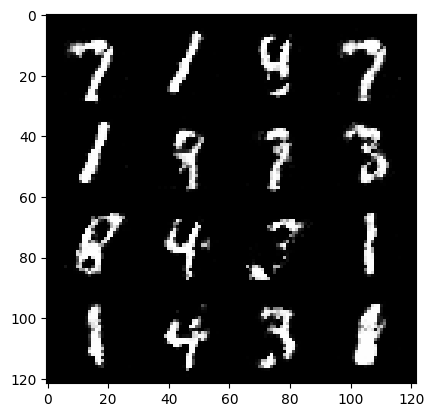

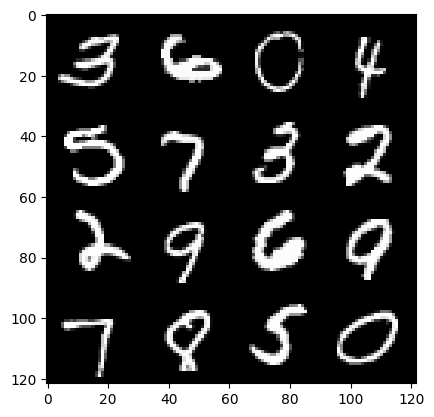

95: step 64500 / Gen loss: 1.7273497772216815 / Disc loss: 0.34038244624932584


  0%|          | 0/469 [00:00<?, ?it/s]

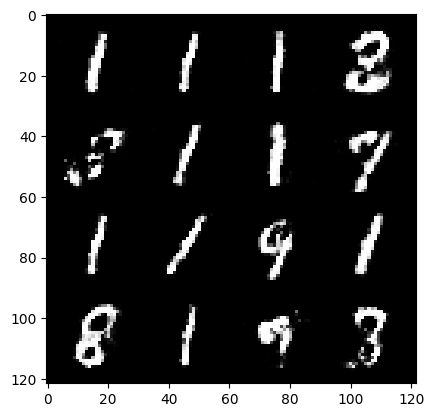

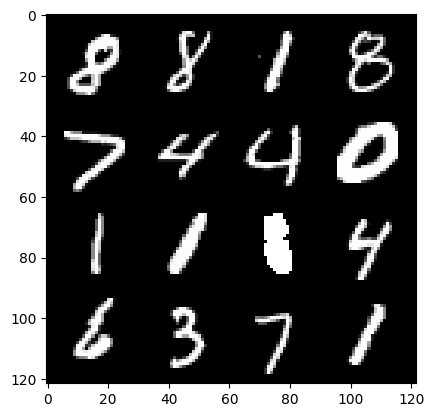

96: step 64800 / Gen loss: 1.7589093740781139 / Disc loss: 0.3342392434676487


  0%|          | 0/469 [00:00<?, ?it/s]

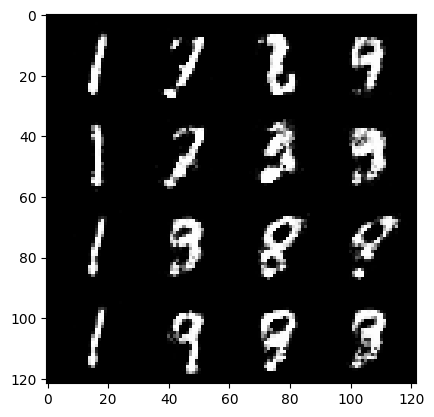

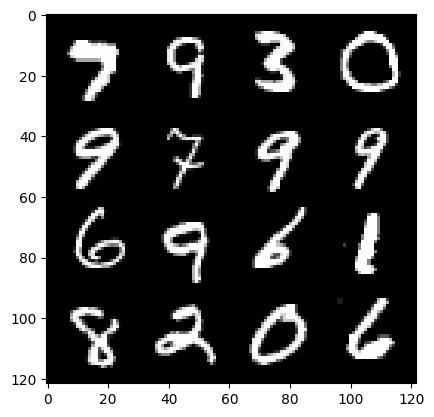

97: step 65100 / Gen loss: 1.734312838315964 / Disc loss: 0.3337193360924721


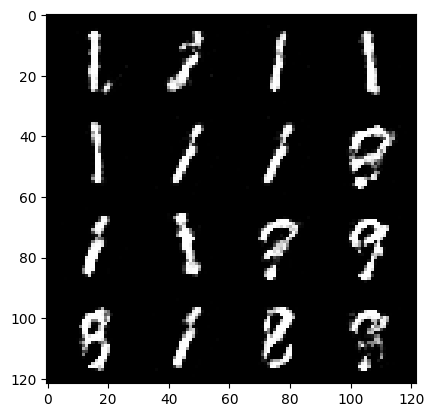

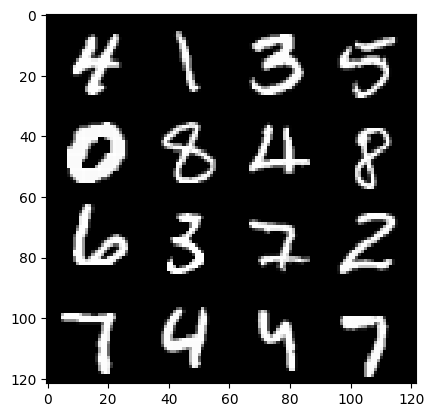

97: step 65400 / Gen loss: 1.7705334703127547 / Disc loss: 0.32261026948690413


  0%|          | 0/469 [00:00<?, ?it/s]

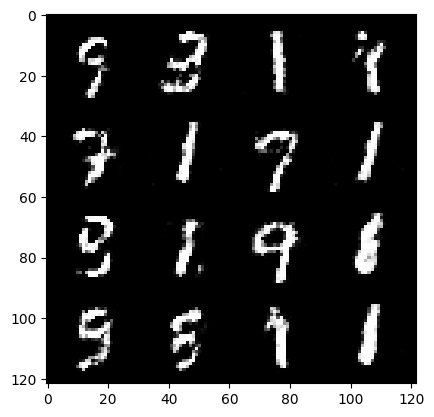

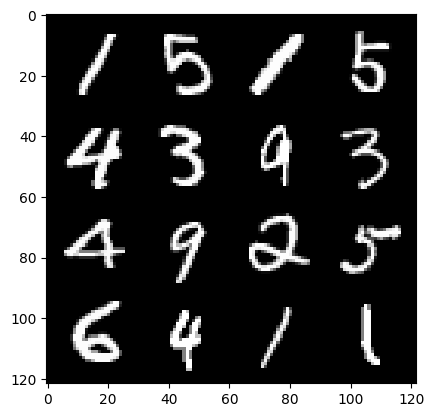

98: step 65700 / Gen loss: 1.8030705531438198 / Disc loss: 0.31883438547452275


  0%|          | 0/469 [00:00<?, ?it/s]

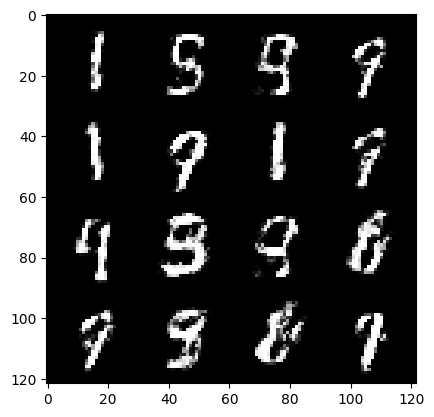

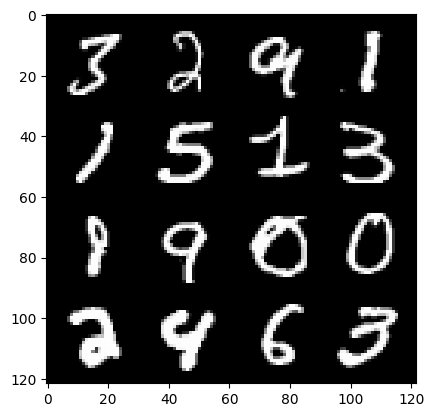

99: step 66000 / Gen loss: 1.773865345716477 / Disc loss: 0.33503810798128464


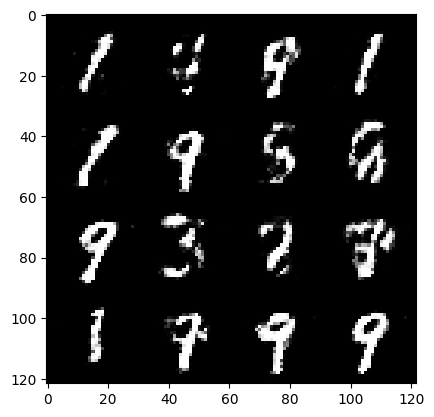

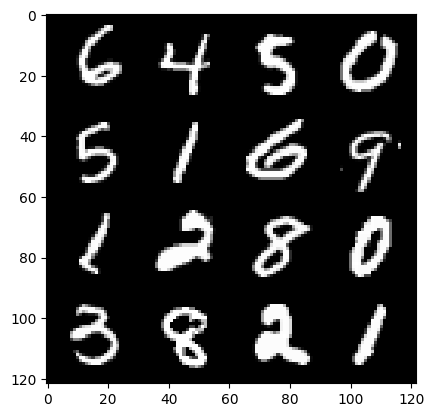

99: step 66300 / Gen loss: 1.7227428114414216 / Disc loss: 0.3399849700431027


  0%|          | 0/469 [00:00<?, ?it/s]

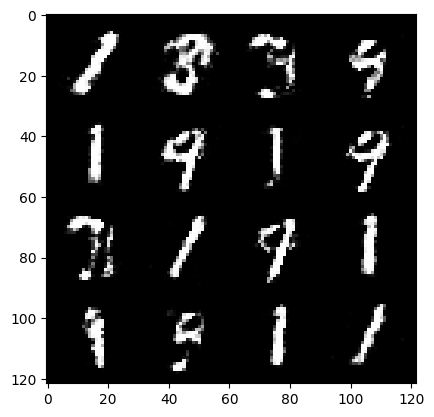

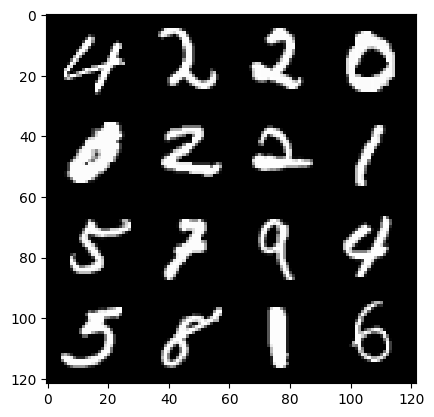

100: step 66600 / Gen loss: 1.686658471425374 / Disc loss: 0.33096352775891613


  0%|          | 0/469 [00:00<?, ?it/s]

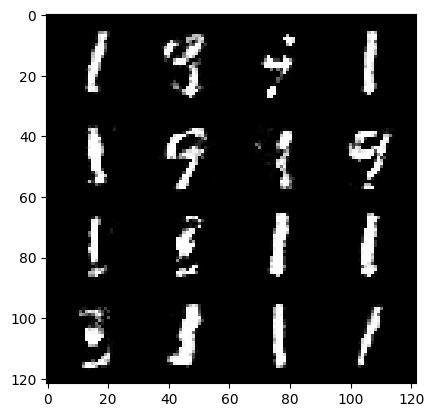

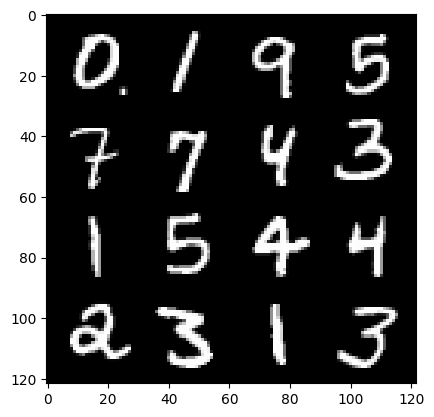

101: step 66900 / Gen loss: 1.754964733521144 / Disc loss: 0.3331003087759015


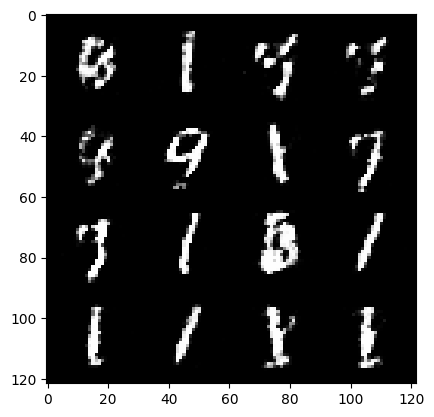

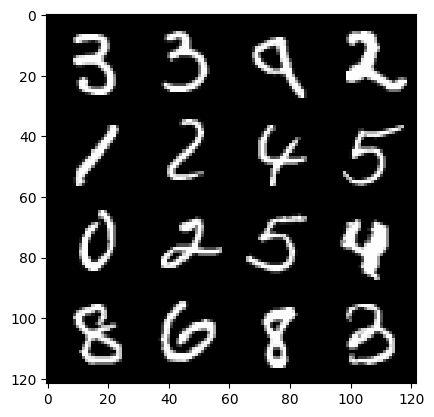

101: step 67200 / Gen loss: 1.7148683758576713 / Disc loss: 0.3303993355731166


  0%|          | 0/469 [00:00<?, ?it/s]

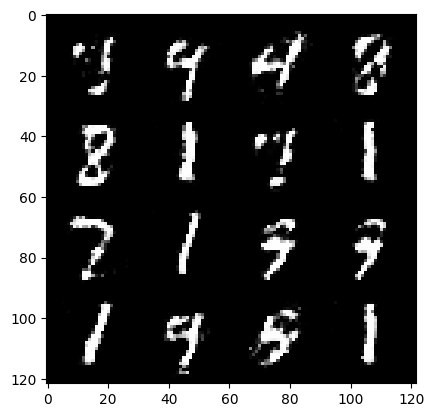

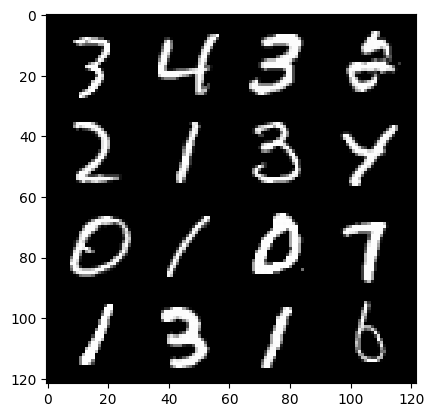

102: step 67500 / Gen loss: 1.7671846151351933 / Disc loss: 0.321688511321942


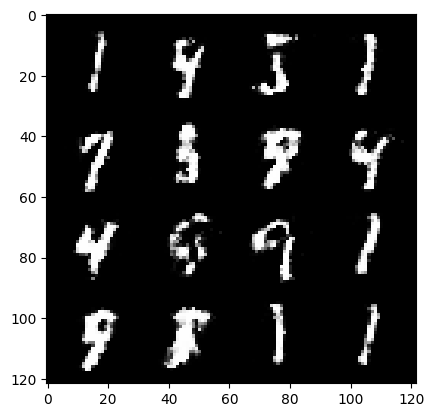

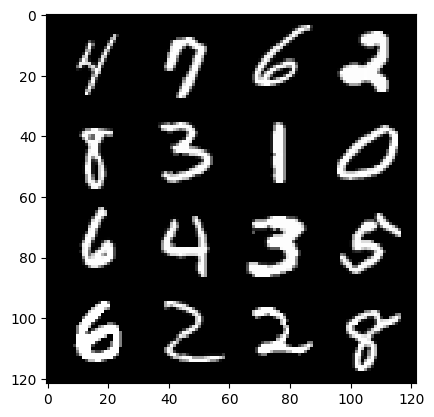

102: step 67800 / Gen loss: 1.773377070426941 / Disc loss: 0.31895514865716285


  0%|          | 0/469 [00:00<?, ?it/s]

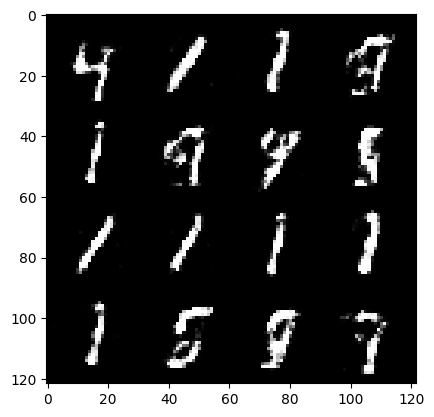

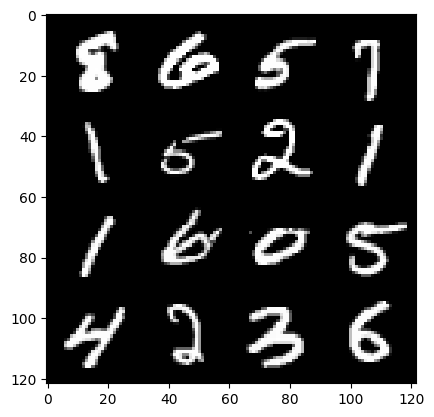

103: step 68100 / Gen loss: 1.7102580598990127 / Disc loss: 0.3350109623869262


  0%|          | 0/469 [00:00<?, ?it/s]

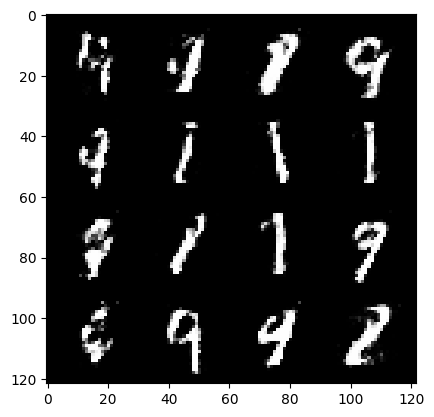

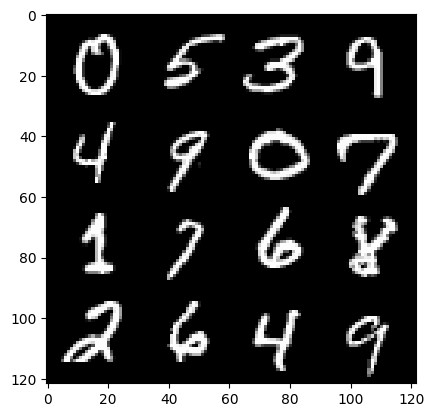

104: step 68400 / Gen loss: 1.7327606689929973 / Disc loss: 0.32512135058641434


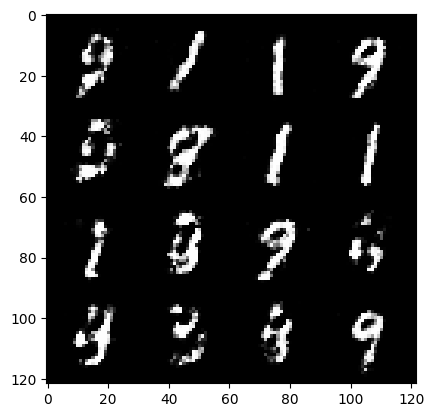

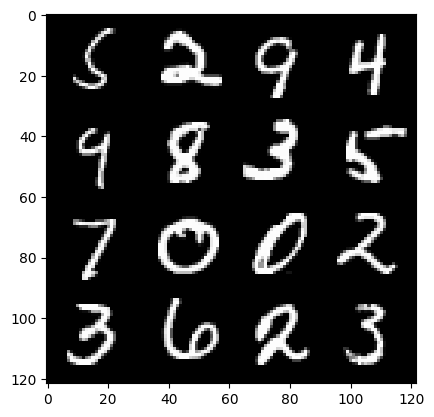

104: step 68700 / Gen loss: 1.7016730741659825 / Disc loss: 0.3211408717930315


  0%|          | 0/469 [00:00<?, ?it/s]

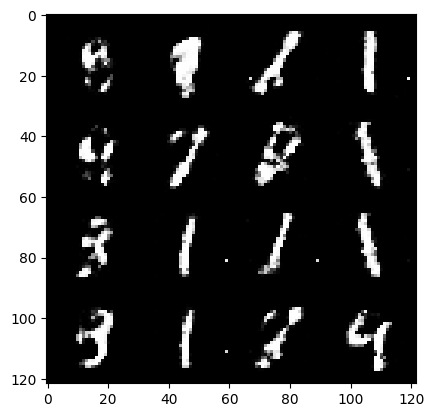

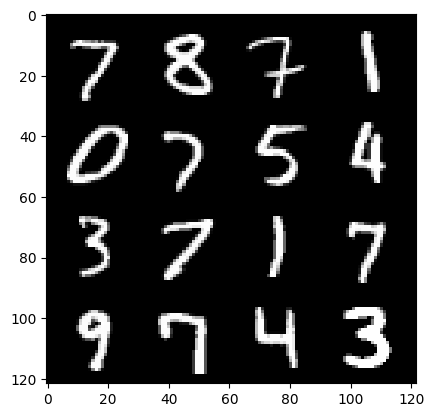

105: step 69000 / Gen loss: 1.7352936200300864 / Disc loss: 0.3533028339346256


  0%|          | 0/469 [00:00<?, ?it/s]

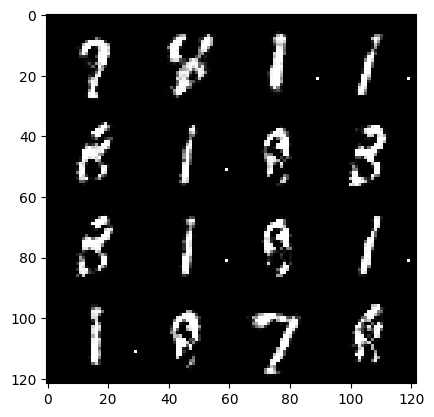

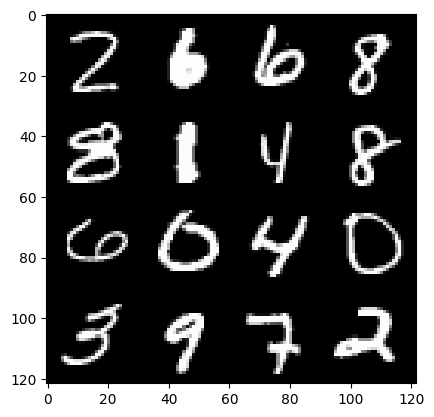

106: step 69300 / Gen loss: 1.4870713961124429 / Disc loss: 0.4432360038161277


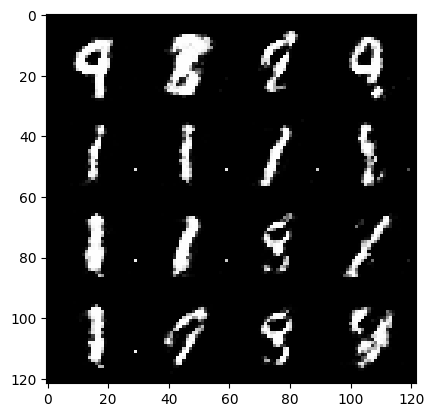

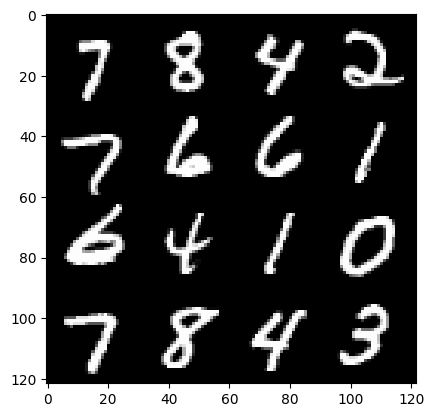

106: step 69600 / Gen loss: 1.62591848095258 / Disc loss: 0.3662630364298822


  0%|          | 0/469 [00:00<?, ?it/s]

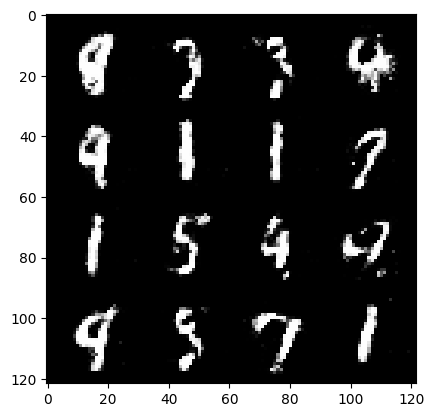

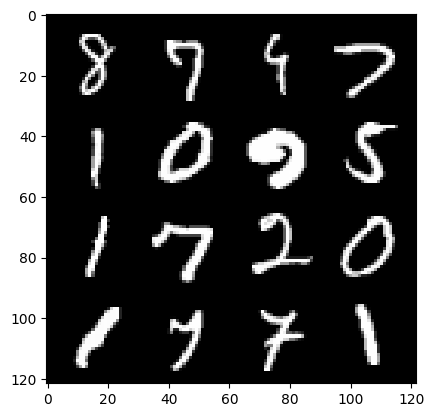

107: step 69900 / Gen loss: 1.6396503349145244 / Disc loss: 0.34473687986532847


  0%|          | 0/469 [00:00<?, ?it/s]

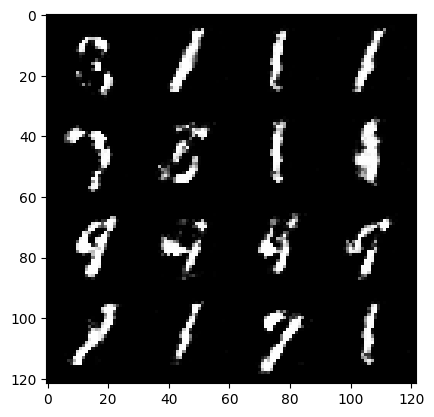

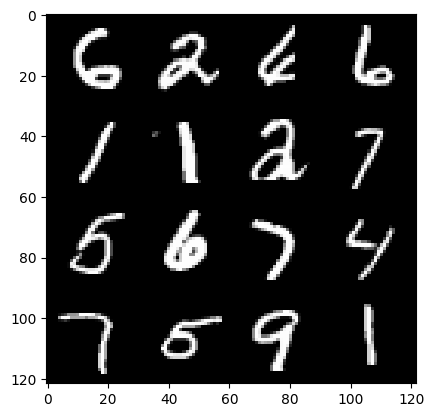

108: step 70200 / Gen loss: 1.7158575145403545 / Disc loss: 0.3290258113046486


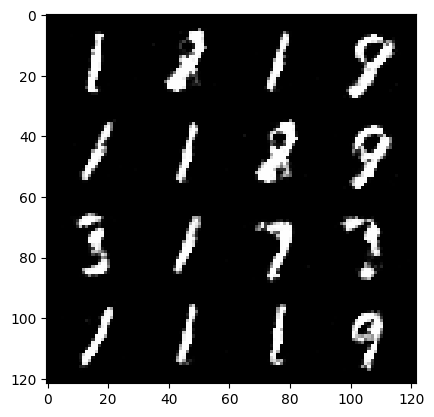

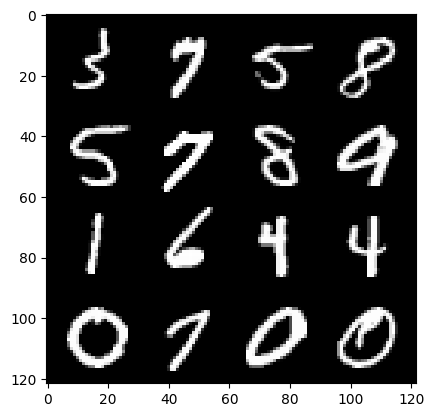

108: step 70500 / Gen loss: 1.7342145729064944 / Disc loss: 0.33827004700899127


  0%|          | 0/469 [00:00<?, ?it/s]

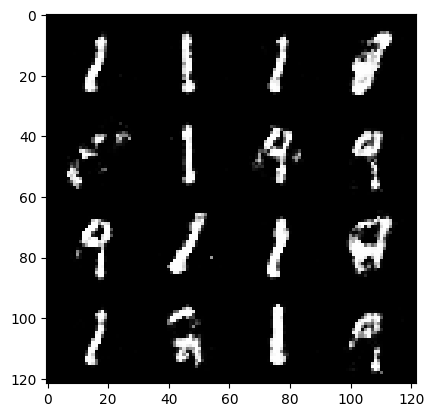

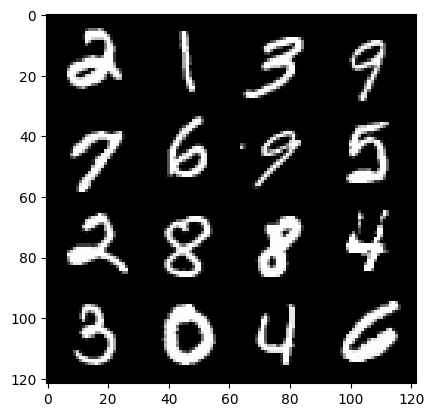

109: step 70800 / Gen loss: 1.620928786595663 / Disc loss: 0.3651048041383425


  0%|          | 0/469 [00:00<?, ?it/s]

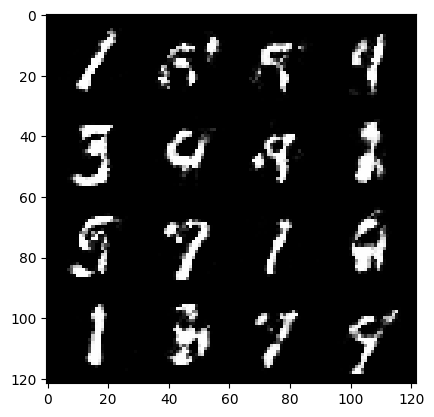

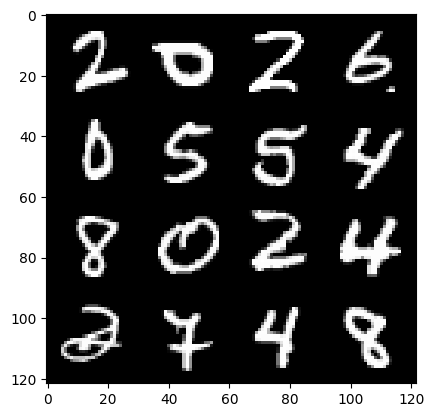

110: step 71100 / Gen loss: 1.657431448698044 / Disc loss: 0.3478421256442868


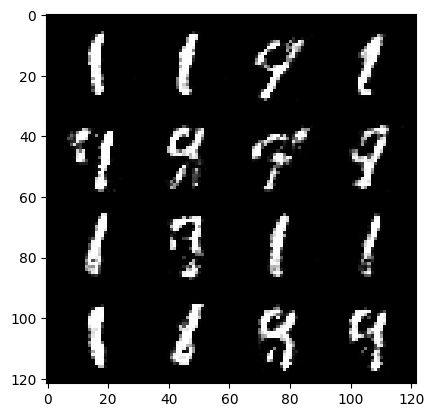

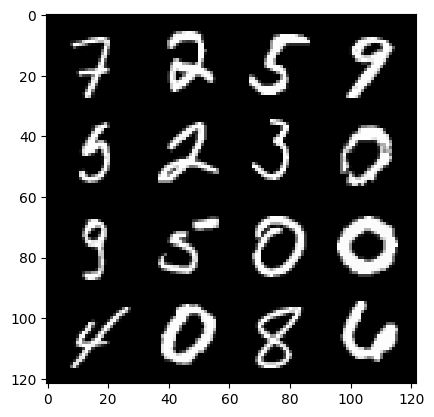

110: step 71400 / Gen loss: 1.7329928096135472 / Disc loss: 0.33410369684298846


  0%|          | 0/469 [00:00<?, ?it/s]

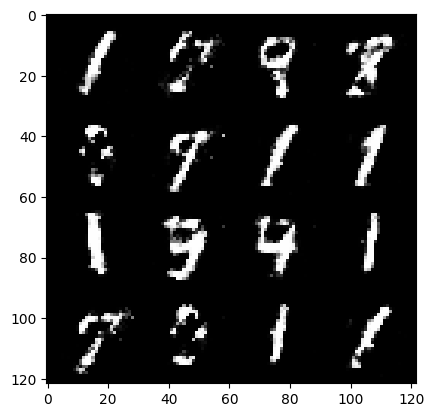

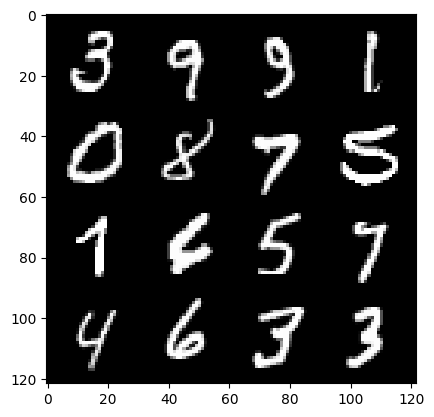

111: step 71700 / Gen loss: 1.7216656498114267 / Disc loss: 0.34725093096494675


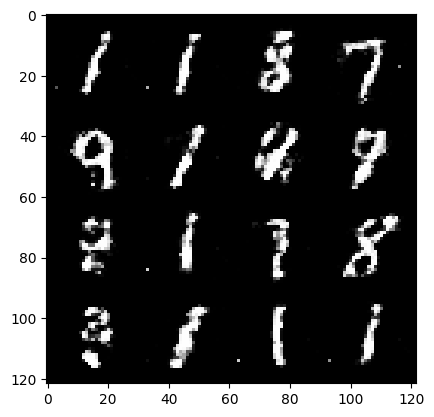

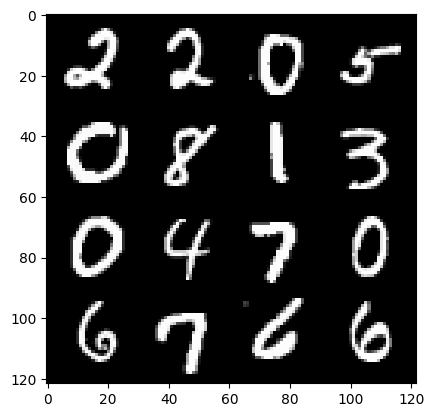

111: step 72000 / Gen loss: 1.632638663053513 / Disc loss: 0.3602954226732252


  0%|          | 0/469 [00:00<?, ?it/s]

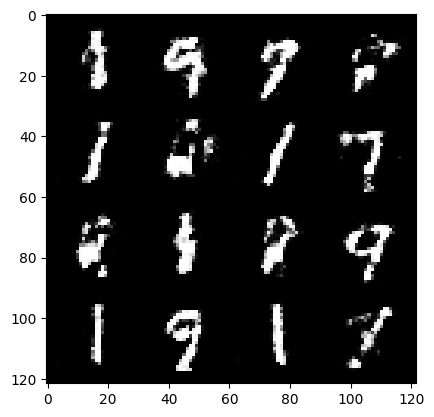

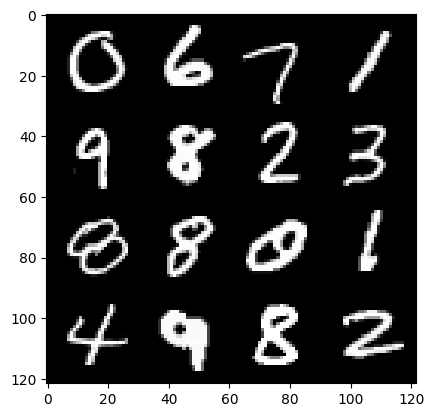

112: step 72300 / Gen loss: 1.610526041984559 / Disc loss: 0.3519138524929683


  0%|          | 0/469 [00:00<?, ?it/s]

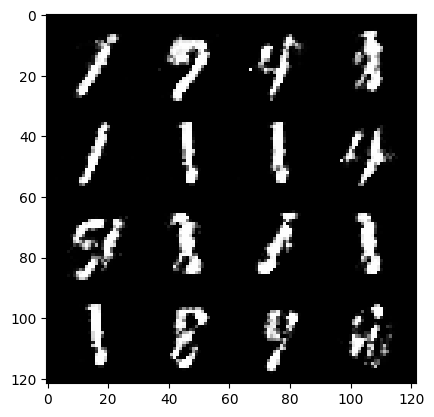

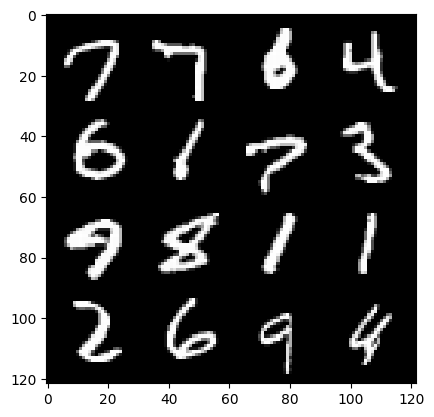

113: step 72600 / Gen loss: 1.5847573828697208 / Disc loss: 0.3722141140699382


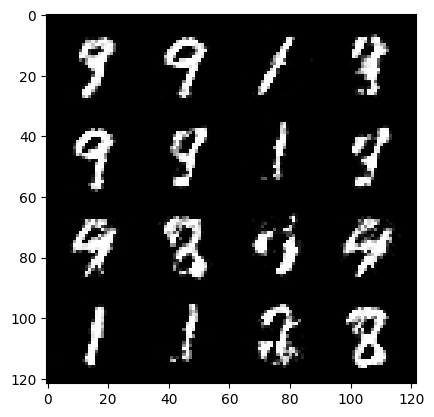

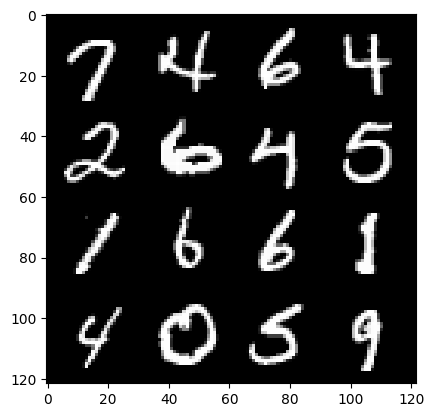

113: step 72900 / Gen loss: 1.7122929755846665 / Disc loss: 0.33397320275505404


  0%|          | 0/469 [00:00<?, ?it/s]

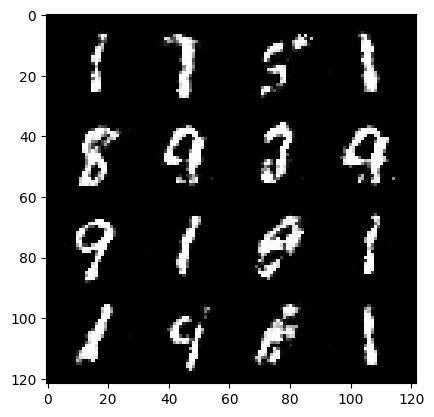

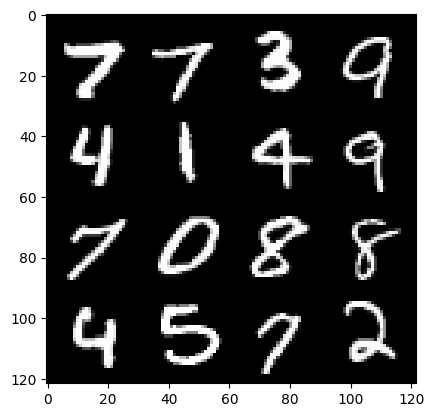

114: step 73200 / Gen loss: 1.6962797458966563 / Disc loss: 0.3454474513729415


  0%|          | 0/469 [00:00<?, ?it/s]

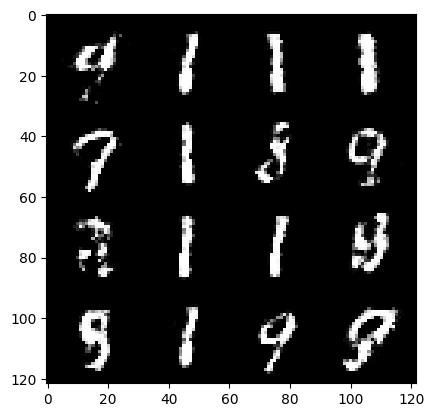

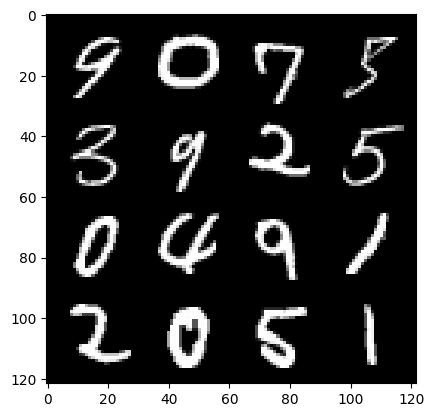

115: step 73500 / Gen loss: 1.6358725277582806 / Disc loss: 0.3506633559862773


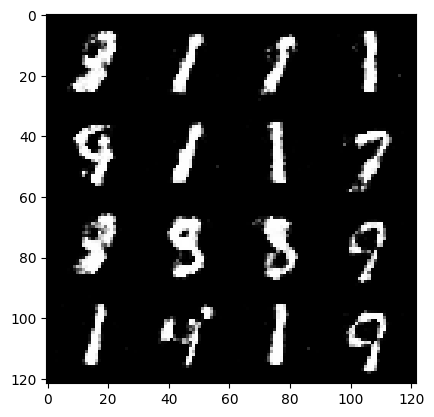

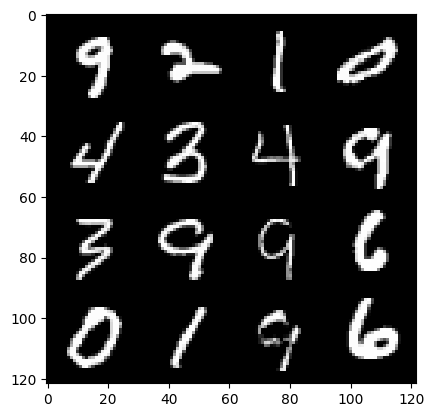

115: step 73800 / Gen loss: 1.58667033513387 / Disc loss: 0.3618336047728858


  0%|          | 0/469 [00:00<?, ?it/s]

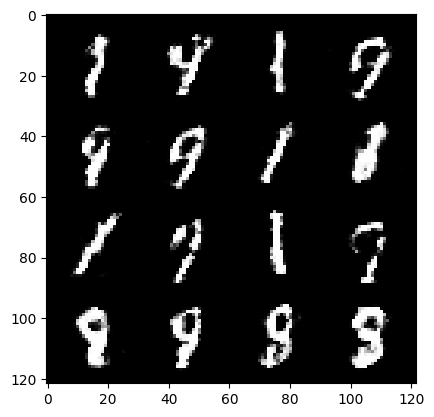

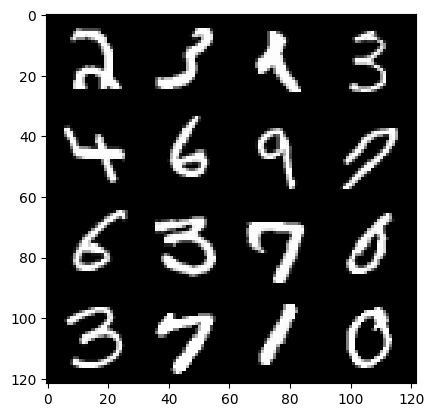

116: step 74100 / Gen loss: 1.6870031710465756 / Disc loss: 0.345144748588403


  0%|          | 0/469 [00:00<?, ?it/s]

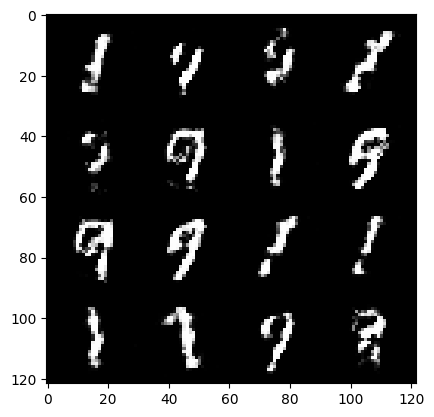

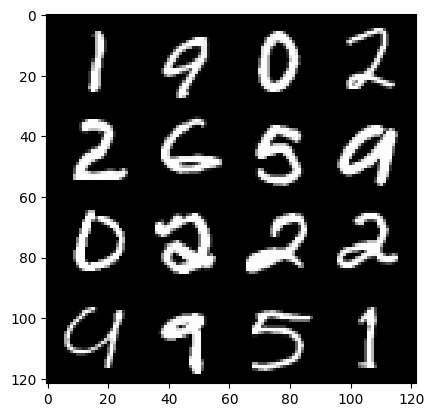

117: step 74400 / Gen loss: 1.6761991059780124 / Disc loss: 0.3367480521897473


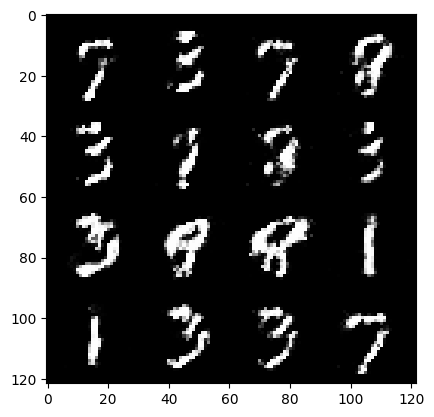

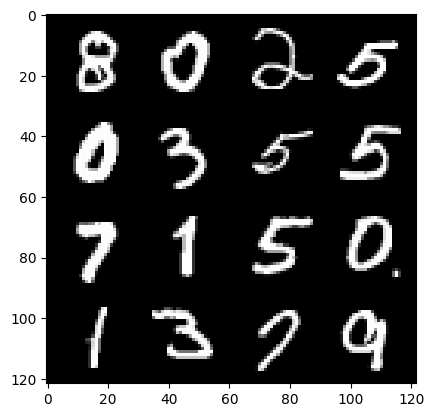

117: step 74700 / Gen loss: 1.7500206426779432 / Disc loss: 0.3184647690256436


  0%|          | 0/469 [00:00<?, ?it/s]

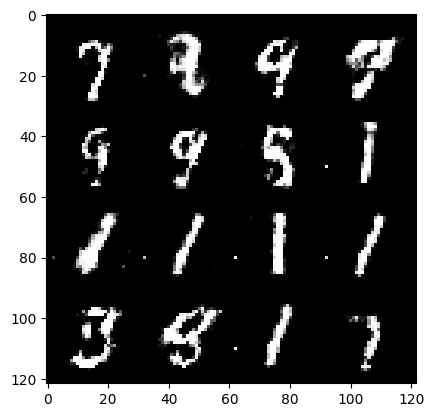

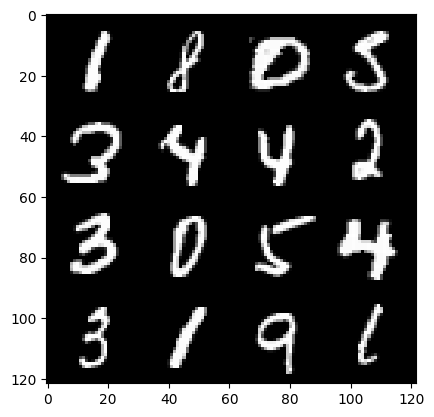

118: step 75000 / Gen loss: 1.6430437386035914 / Disc loss: 0.37343367243806525


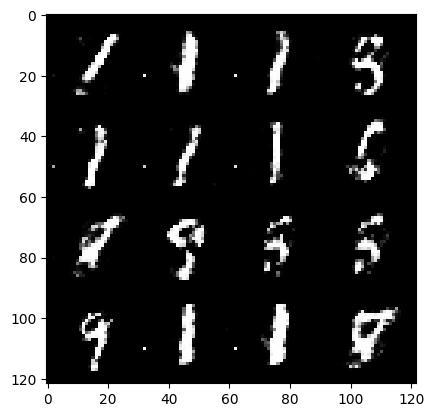

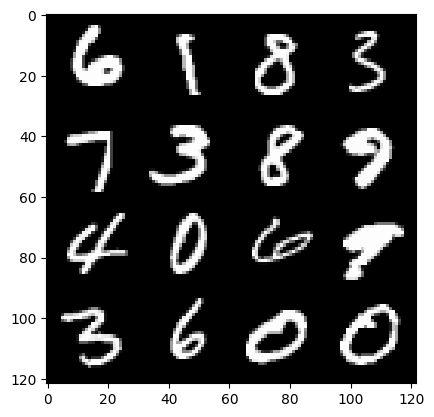

118: step 75300 / Gen loss: 1.53886003057162 / Disc loss: 0.37239837874968823


  0%|          | 0/469 [00:00<?, ?it/s]

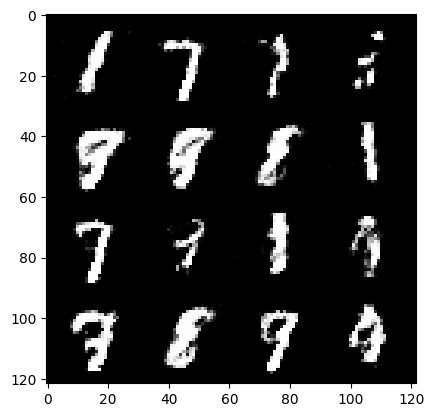

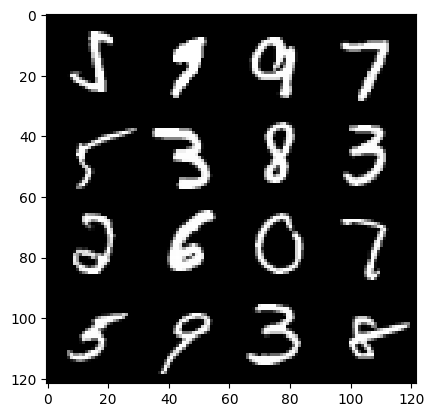

119: step 75600 / Gen loss: 1.6712660018603012 / Disc loss: 0.3346138348678745


  0%|          | 0/469 [00:00<?, ?it/s]

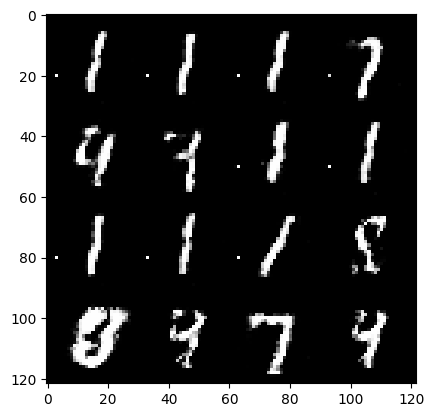

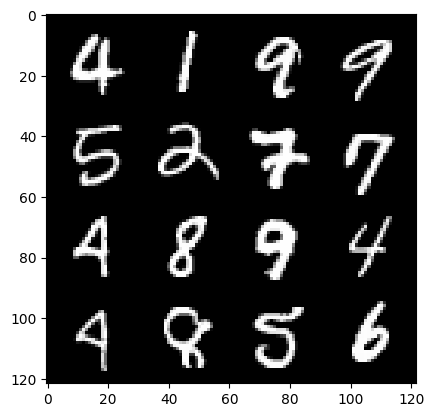

120: step 75900 / Gen loss: 1.4498809870084117 / Disc loss: 0.41579583575328194


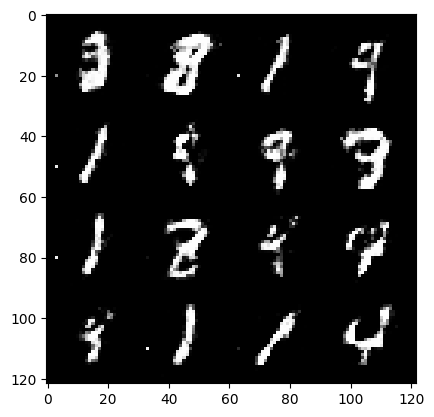

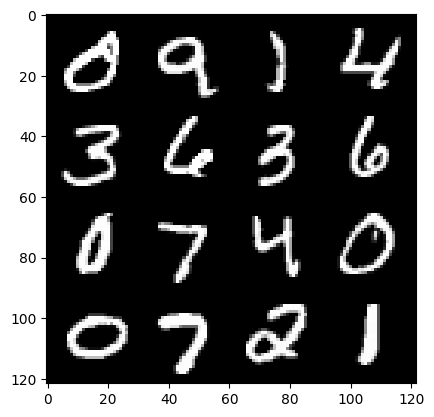

120: step 76200 / Gen loss: 1.6219719858964279 / Disc loss: 0.35322672029336266


  0%|          | 0/469 [00:00<?, ?it/s]

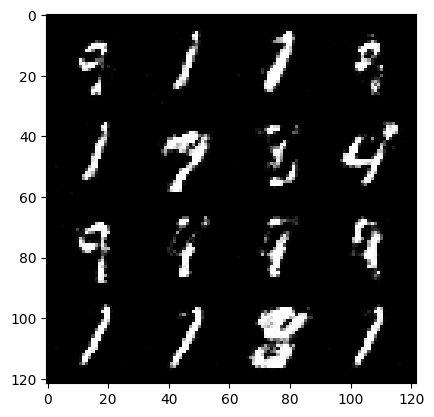

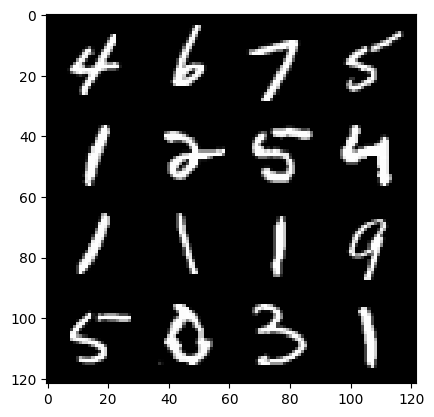

121: step 76500 / Gen loss: 1.4881715750694275 / Disc loss: 0.3748952724536259


  0%|          | 0/469 [00:00<?, ?it/s]

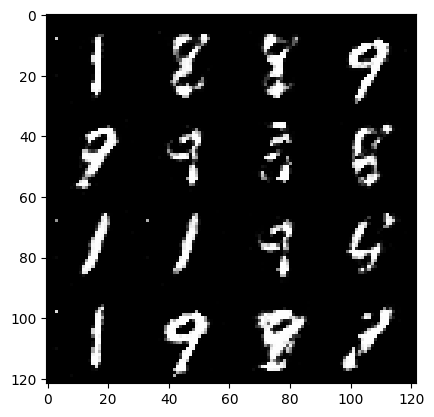

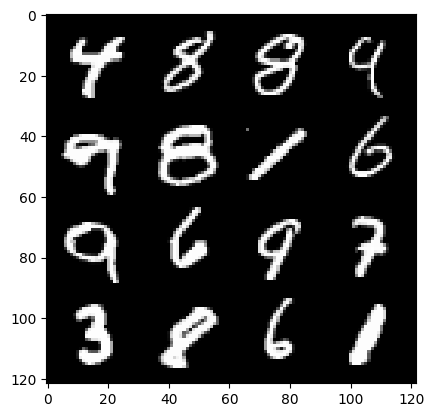

122: step 76800 / Gen loss: 1.4908958009878794 / Disc loss: 0.37489913036425904


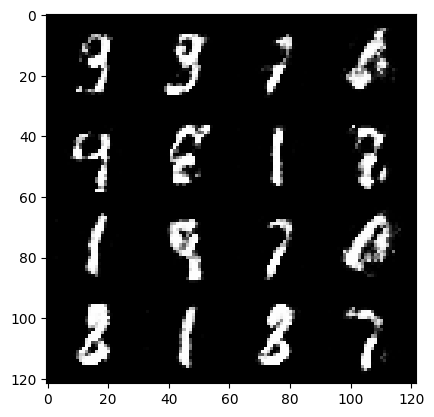

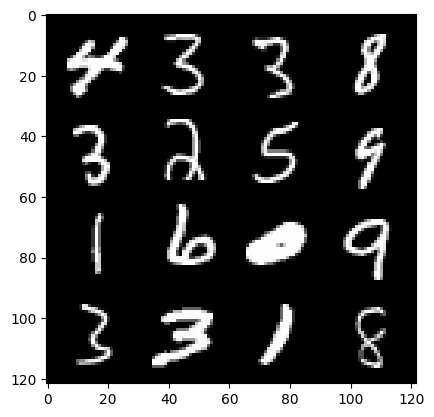

122: step 77100 / Gen loss: 1.6083113133907316 / Disc loss: 0.3614796310663219


  0%|          | 0/469 [00:00<?, ?it/s]

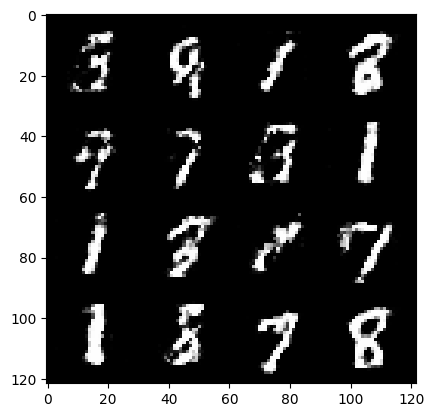

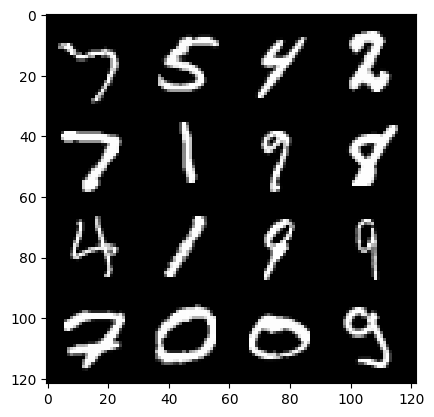

123: step 77400 / Gen loss: 1.5924828743934636 / Disc loss: 0.3623710778355598


  0%|          | 0/469 [00:00<?, ?it/s]

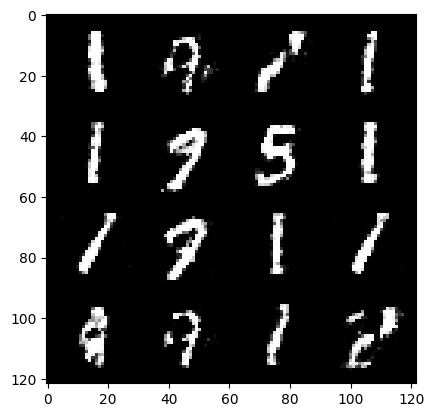

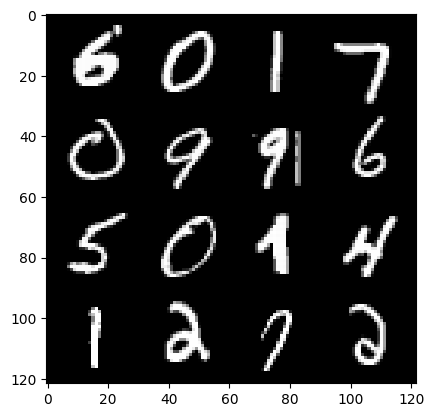

124: step 77700 / Gen loss: 1.685864233970642 / Disc loss: 0.348500046332677


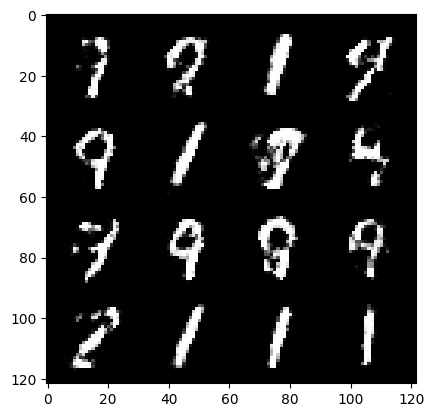

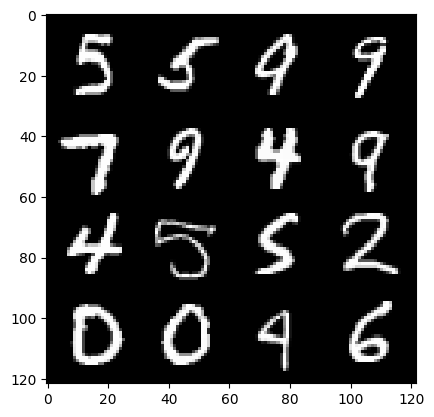

124: step 78000 / Gen loss: 1.65234227736791 / Disc loss: 0.35927656998236956


  0%|          | 0/469 [00:00<?, ?it/s]

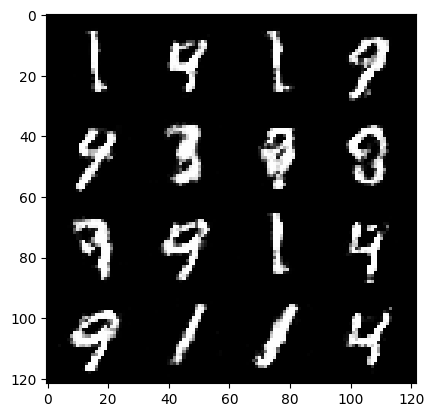

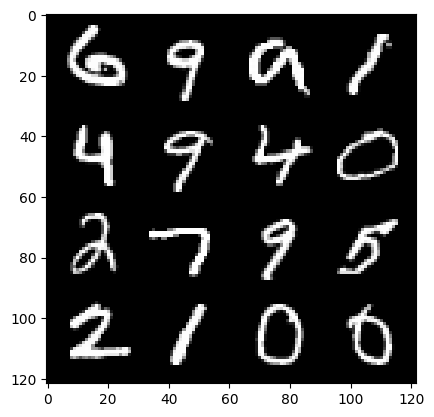

125: step 78300 / Gen loss: 1.590897137721379 / Disc loss: 0.36564421733220437


  0%|          | 0/469 [00:00<?, ?it/s]

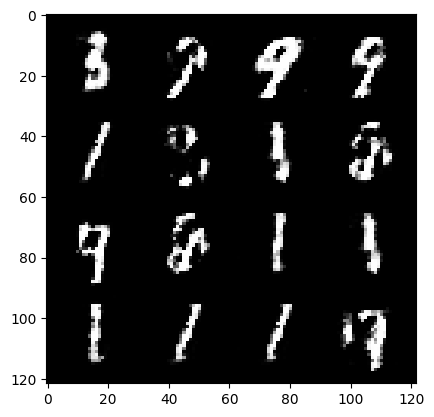

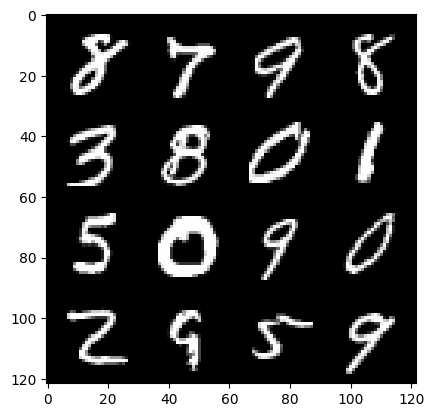

126: step 78600 / Gen loss: 1.5512841443220784 / Disc loss: 0.3703614353140196


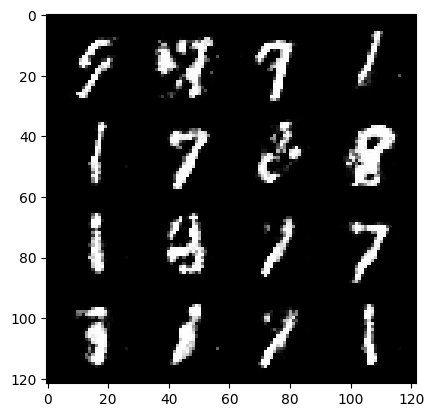

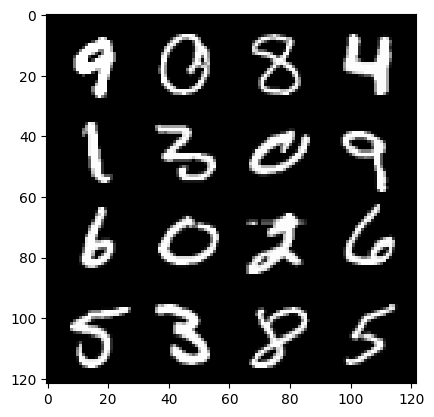

126: step 78900 / Gen loss: 1.5086397949854524 / Disc loss: 0.3637202263871832


  0%|          | 0/469 [00:00<?, ?it/s]

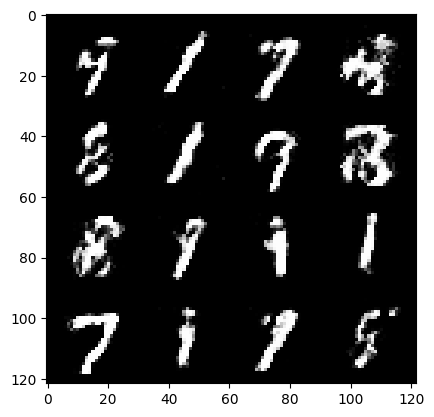

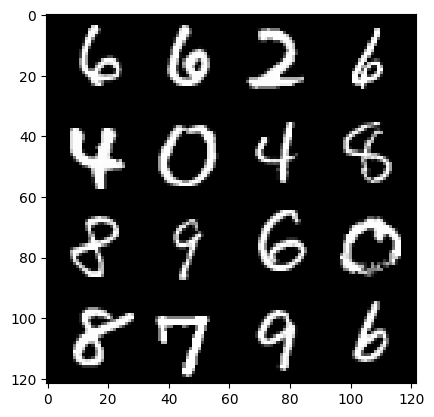

127: step 79200 / Gen loss: 1.5644805630048126 / Disc loss: 0.36298842499653505


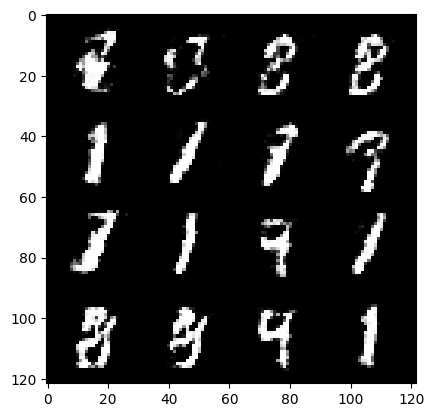

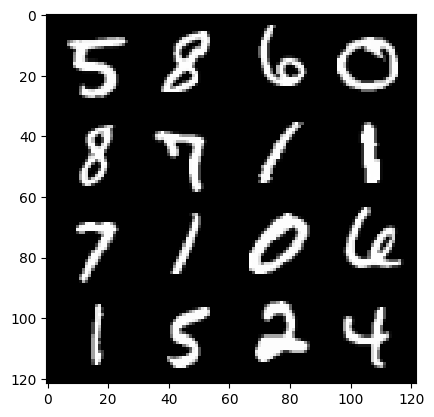

127: step 79500 / Gen loss: 1.590632294813793 / Disc loss: 0.37162680715322505


  0%|          | 0/469 [00:00<?, ?it/s]

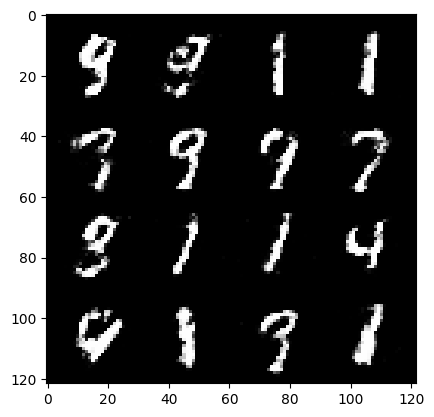

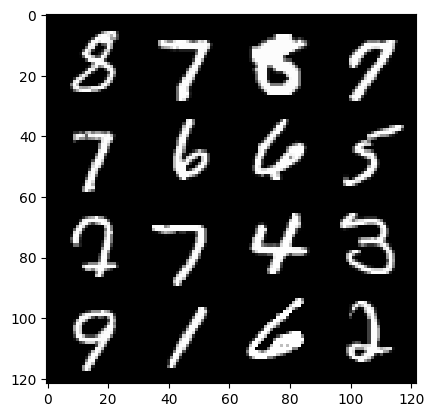

128: step 79800 / Gen loss: 1.5620898540814723 / Disc loss: 0.36844851891199765


  0%|          | 0/469 [00:00<?, ?it/s]

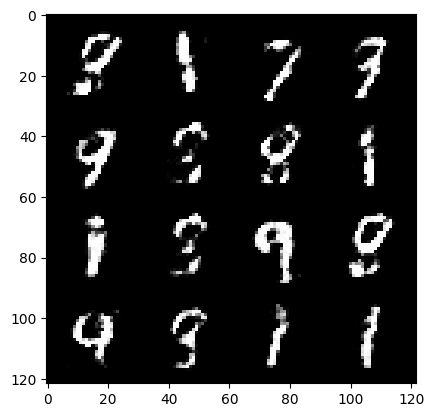

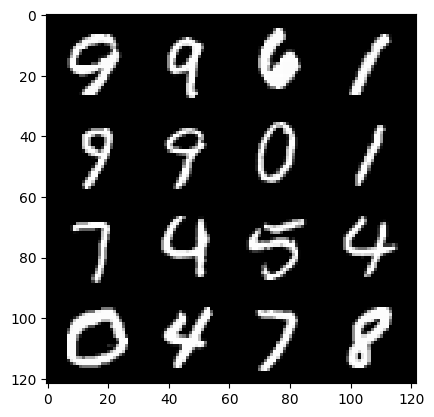

129: step 80100 / Gen loss: 1.5345191558202103 / Disc loss: 0.37631332844495796


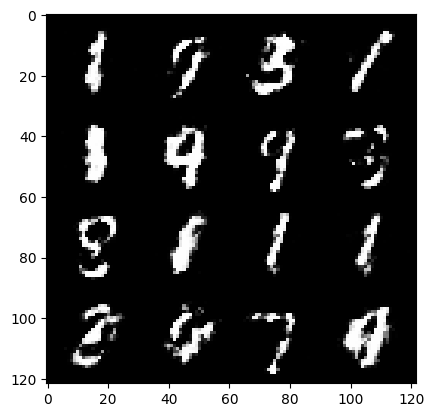

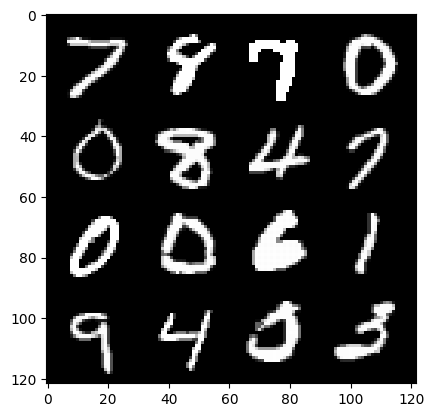

129: step 80400 / Gen loss: 1.5351145641008996 / Disc loss: 0.3816133333245916


  0%|          | 0/469 [00:00<?, ?it/s]

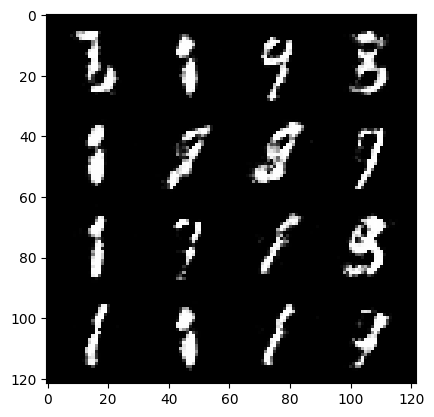

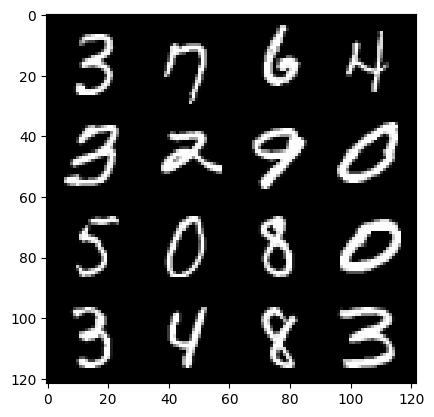

130: step 80700 / Gen loss: 1.5415216302871717 / Disc loss: 0.3611399110158289


  0%|          | 0/469 [00:00<?, ?it/s]

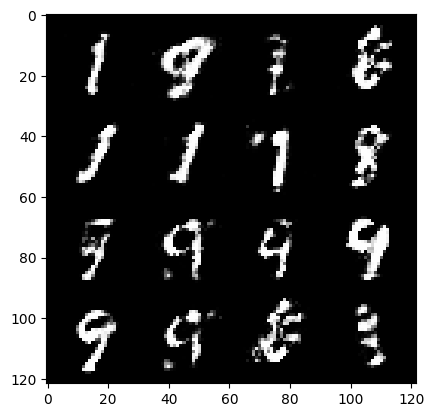

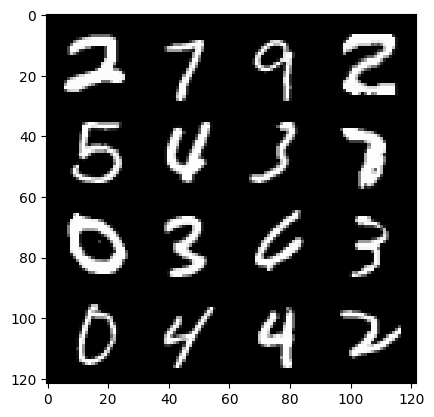

131: step 81000 / Gen loss: 1.5533555456002544 / Disc loss: 0.3703324854373936


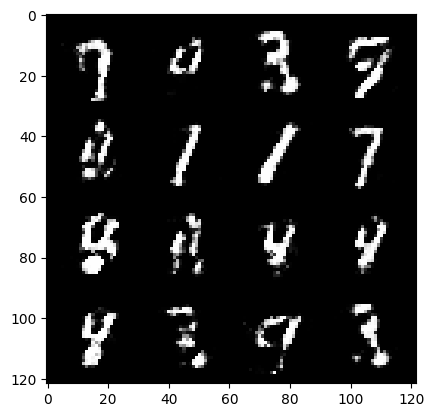

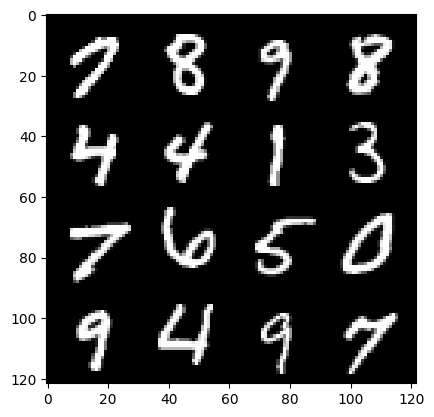

131: step 81300 / Gen loss: 1.5267269170284266 / Disc loss: 0.3741040198008219


  0%|          | 0/469 [00:00<?, ?it/s]

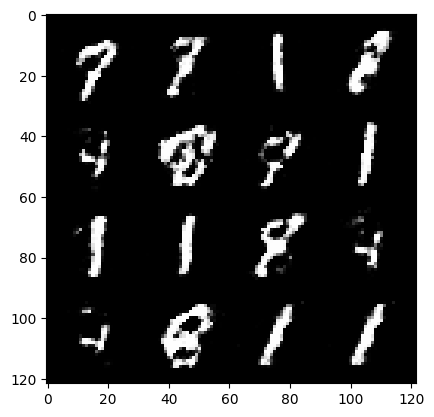

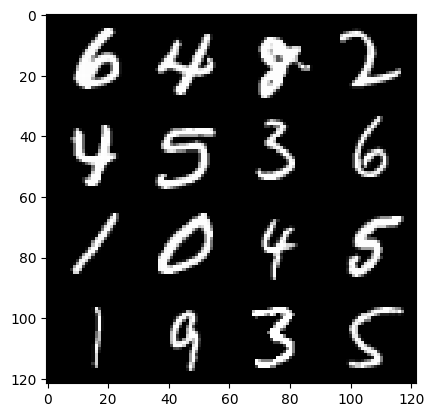

132: step 81600 / Gen loss: 1.4921065898736323 / Disc loss: 0.3847779541214305


  0%|          | 0/469 [00:00<?, ?it/s]

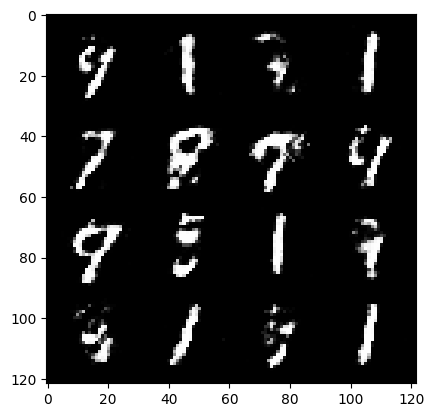

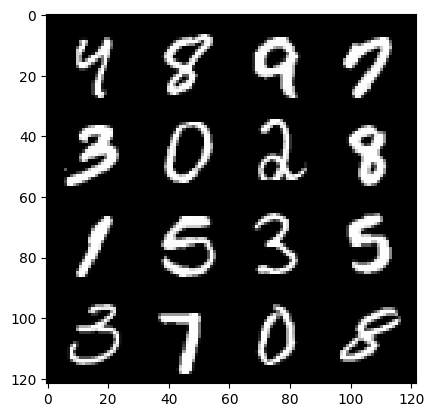

133: step 81900 / Gen loss: 1.592171237071356 / Disc loss: 0.3604967658718429


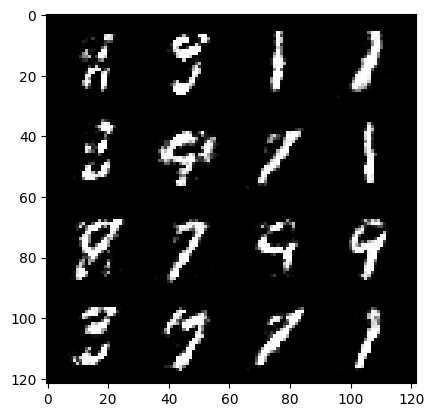

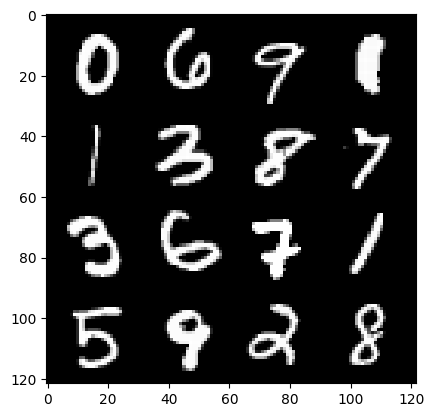

133: step 82200 / Gen loss: 1.6278039662043255 / Disc loss: 0.35452664156754815


  0%|          | 0/469 [00:00<?, ?it/s]

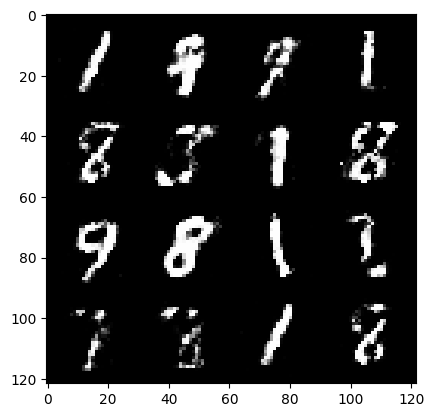

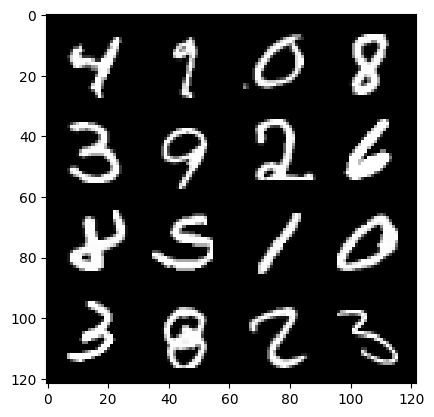

134: step 82500 / Gen loss: 1.5674165562788644 / Disc loss: 0.3786295612653094


In [ ]:
### 60,000 images of MINST
# batch size = 128
#no. of steps = 469

for epoch in range(epochs):
  for real, _ in tqdm(dataloader):
    ###discriminator
    disc_opt.zero_grad()
    cur_bs = len(real)  #128 x 1 x 28 x 28
    real = real.view(cur_bs, -1)  # 128 x 784    here -1 have forced rest dimensions to become 1 single entity
    real  = real.to(device)

    disc_loss = calc_disc_loss(loss_func, gen, disc, cur_bs, real, z_dim)

    disc_loss.backward(retain_graph = True)
    disc_opt.step()

    #generator

    gen_opt.zero_grad()
    gen_loss = calc_gen_loss(loss_func, gen, disc, cur_bs, z_dim)
    gen_loss.backward(retain_graph = True)
    gen_opt.step()

    #visualization & stats
    mean_disc_loss+= disc_loss.item()/info_step
    mean_gen_loss+= gen_loss.item()/info_step
    if cur_step %info_step == 0 and cur_step > 0:
      fake_noise = gen_noise(cur_bs, z_dim)
      fake = gen(fake_noise)
      show(fake)
      # torchvision.utils.save_image(fake, f'/content/fake images/fake_images_{epoch}.png', normalize=False)
      show(real)
      print (f"{epoch}: step {cur_step} / Gen loss: {mean_gen_loss} / Disc loss: {mean_disc_loss}")
      mean_gen_loss, mean_disc_loss = 0 , 0
    cur_step+=1
